## XGB on Magnetic States

In [1]:
# !pip install mlxtend
# !pip install xgboost
# !pip install optuna

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import random
import os
import re
%matplotlib inline

from mlxtend.feature_selection import SequentialFeatureSelector as sfs
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [3]:
#!pip install scikeras
from sklearn import metrics,linear_model, svm
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, BayesianRidge, Lasso, RidgeCV, LassoCV, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, RepeatedKFold, StratifiedKFold
from sklearn.model_selection import GridSearchCV, ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score, auc, confusion_matrix, ConfusionMatrixDisplay, mean_squared_error, r2_score, mean_absolute_error, f1_score
import xgboost as xgb

In [23]:
df = pd.read_excel('Results_Mag_States/STEP1_withDescriptors_DFT_D3_ACS_AMI_348_hetero_Mu.xlsx')
df1 = pd.read_excel('Results_Mag_States/STEP5_pearson_corr_less_than_98%_reasonable.xlsx')
df2 = pd.read_excel('Results_Mag_States/Descriptors_with_DFT_ML23_structure_hetero.xlsx')
df3 = pd.read_excel('Results_Mag_States/STEP5_pearson_corr_less_than_98%_from_plots_reasonable.xlsx')
df4 = pd.read_excel('Results_Mag_States/STEP5_pearson_corr_less_than_95%_from_plots_reasonable.xlsx')
df5 = pd.read_excel('Results_Mag_States/STEP5_pearson_corr_less_than_90%_from_plots_reasonable.xlsx')

In [24]:
X1_mu = df1.iloc[:,]
X2_mu = df[df2.iloc[:,5:].columns]
X3_mu = df3.iloc[:,15:]
X4_mu = df4.iloc[:,15:]
X5_mu = df5.iloc[:,15:]

In [25]:
print(X1_mu.shape, X2_mu.shape, X3_mu.shape, X4_mu.shape, X5_mu.shape)

(348, 194) (348, 100) (348, 199) (348, 156) (348, 113)


In [36]:
y_mu = df['Mu_per_cell']
y_spin = df['spin_state']

In [8]:
feature_list_x1 = list(X1_mu.columns)
feature_list_x2 = list(X2_mu.columns)
feature_list_x3 = list(X3_mu.columns)
feature_list_x4 = list(X4_mu.columns)
feature_list_x5 = list(X5_mu.columns)

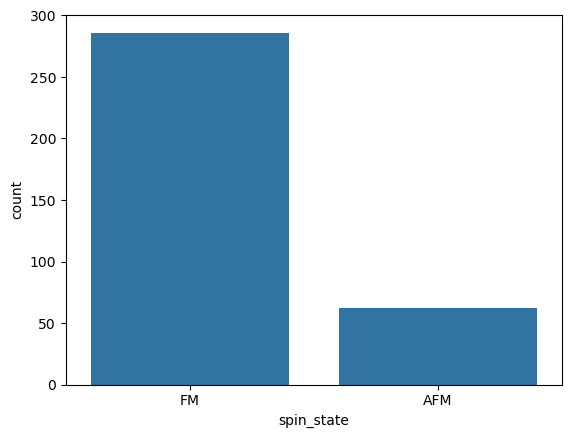

In [9]:
sns.countplot(x = y_spin)
plt.show()

In [10]:
y_spin = [1 if x == 'FM' else 0 for x in y_spin]
y_spin = pd.Series(i for i in y_spin)

In [45]:
## Using XGBoost classifier and considering class imbalance

In [53]:
## X1 dataset

In [172]:
import optuna
import random
X1_train_spin,X1_test_spin,y1_train_spin,y1_test_spin = train_test_split(X1_mu,y_spin,test_size=0.20,random_state=82)

def objective_x1(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x1_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x1 = model_x1_xgb.fit(X1_train_spin,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1 = cross_val_score(xgb_spin_optuna_x1,X1_train_spin,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1 = cv_scores_xgb_spin_optuna_x1.mean()

    # Return best F1 scores
    f1_train_x1 = f1_score(y1_train_spin, model_x1_xgb.predict(X1_train_spin))
    f1_test_x1 = f1_score(y1_test_spin, model_x1_xgb.predict(X1_test_spin))
    return f1_train_x1,avg_f1_cv_xgb_spin_optuna_x1,f1_test_x1
# return avg_f1_cv_xgb_spin_optuna_x1

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_x1_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_x1_xgb.optimize(objective_x1, n_trials=300)

[I 2025-03-08 15:53:56,881] A new study created in memory with name: no-name-1c342815-ad03-457a-a0c2-9a75538ac3e1
[I 2025-03-08 15:53:57,531] Trial 0 finished with values: [0.9305263157894736, 0.7822952176722783, 0.9682539682539683] and parameters: {'n_estimators': 131, 'max_depth': 7, 'learning_rate': 0.11659469207187315, 'subsample': 0.700036570638276, 'colsample_bytree': 0.2978138602012188, 'gamma': 4.846985150400186, 'reg_alpha': 0.07831923100036871, 'reg_lambda': 2.18765065026055e-06, 'min_child_weight': 2, 'scale_pos_weight': 1, 'max_delta_step': 3.681361164869821}.
[I 2025-03-08 15:53:57,946] Trial 1 finished with values: [0.9311064718162839, 0.7788045266990636, 0.9538461538461539] and parameters: {'n_estimators': 43, 'max_depth': 24, 'learning_rate': 0.10859832333088269, 'subsample': 0.6238336835949703, 'colsample_bytree': 0.13548133239475565, 'gamma': 0.6949960657029552, 'reg_alpha': 0.06496326348746964, 'reg_lambda': 0.0005877504992171481, 'min_child_weight': 3, 'scale_pos_we

In [173]:
best_models_x1_xgb_optuna = study_x1_xgb.best_trials
best_models_x1_xgb_optuna

[FrozenTrial(number=23, state=1, values=[0.9449152542372882, 0.7838451382614142, 0.9612403100775194], datetime_start=datetime.datetime(2025, 3, 8, 15, 54, 7, 584978), datetime_complete=datetime.datetime(2025, 3, 8, 15, 54, 8, 73783), params={'n_estimators': 86, 'max_depth': 30, 'learning_rate': 0.15781333531454575, 'subsample': 0.9866986811756416, 'colsample_bytree': 0.1251463614292329, 'gamma': 2.1349570863948673, 'reg_alpha': 0.0004994528346846766, 'reg_lambda': 3.706735867829735e-07, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 2.951364987004247}, user_attrs={}, system_attrs={'nsga2:generation': 0}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=150, log=False, low=10, step=1), 'max_depth': IntDistribution(high=50, log=False, low=5, step=1), 'learning_rate': FloatDistribution(high=0.3, log=True, low=0.05, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.1, step=None), 'colsample_bytree': FloatDistribution(high=1.0

In [174]:
for i in range(len(best_models_x1_xgb_optuna)):
    print('\n',i)
    print('Trial number: ', best_models_x1_xgb_optuna[i].number)
    print('F1 scores: ', best_models_x1_xgb_optuna[i].values)
    print('Parameters: ', best_models_x1_xgb_optuna[i].params)


 0
Trial number:  23
F1 scores:  [0.9449152542372882, 0.7838451382614142, 0.9612403100775194]
Parameters:  {'n_estimators': 86, 'max_depth': 30, 'learning_rate': 0.15781333531454575, 'subsample': 0.9866986811756416, 'colsample_bytree': 0.1251463614292329, 'gamma': 2.1349570863948673, 'reg_alpha': 0.0004994528346846766, 'reg_lambda': 3.706735867829735e-07, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 2.951364987004247}

 1
Trial number:  70
F1 scores:  [0.9509594882729211, 0.7748239447232963, 0.9763779527559056]
Parameters:  {'n_estimators': 21, 'max_depth': 36, 'learning_rate': 0.1051587062364809, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.7664044094211496, 'gamma': 2.700033383748629, 'reg_alpha': 1.1056109874997368e-05, 'reg_lambda': 8.178167344253034e-08, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 5.975681056291764}

 2
Trial number:  78
F1 scores:  [0.971677559912854, 0.7880268117497465, 0.9523809523809523]
Parameters:  {'n_estim

In [603]:
best_models_x1_xgb_optuna_pd = pd.DataFrame({'Trial number': [best_models_x1_xgb_optuna[i].number for i in range(len(best_models_x1_xgb_optuna))],
                                             'Train F1': [best_models_x1_xgb_optuna[i].values[0] for i in range(len(best_models_x1_xgb_optuna))],
                                             'Test F1': [best_models_x1_xgb_optuna[i].values[2] for i in range(len(best_models_x1_xgb_optuna))],
                                             'CV F1': [best_models_x1_xgb_optuna[i].values[1] for i in range(len(best_models_x1_xgb_optuna))],
                                             'n_estimators': [best_models_x1_xgb_optuna[i].params['n_estimators'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'max_depth': [best_models_x1_xgb_optuna[i].params['max_depth'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'learning_rate': [best_models_x1_xgb_optuna[i].params['learning_rate'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'subsample': [best_models_x1_xgb_optuna[i].params['subsample'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'colsample_bytree': [best_models_x1_xgb_optuna[i].params['colsample_bytree'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'gamma': [best_models_x1_xgb_optuna[i].params['gamma'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'reg_alpha': [best_models_x1_xgb_optuna[i].params['reg_alpha'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'reg_lambda': [best_models_x1_xgb_optuna[i].params['reg_lambda'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'min_child_weight': [best_models_x1_xgb_optuna[i].params['min_child_weight'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'scale_pos_weight': [best_models_x1_xgb_optuna[i].params['scale_pos_weight'] for i in range(len(best_models_x1_xgb_optuna))],
                                             'max_delta_step': [best_models_x1_xgb_optuna[i].params['max_delta_step'] for i in range(len(best_models_x1_xgb_optuna))]
                                            })
best_models_x1_xgb_optuna_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X1_HP_Optuna.xlsx')

In [ ]:
# 0
# Trial number:  23
# F1 scores:  [0.9449152542372882, 0.7838451382614142, 0.9612403100775194]
# Parameters:  {'n_estimators': 86, 'max_depth': 30, 'learning_rate': 0.15781333531454575, 'subsample': 0.9866986811756416, 'colsample_bytree': 0.1251463614292329, 'gamma': 2.1349570863948673, 'reg_alpha': 0.0004994528346846766, 'reg_lambda': 3.706735867829735e-07, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 2.951364987004247}

#  1
# Trial number:  70
# F1 scores:  [0.9509594882729211, 0.7748239447232963, 0.9763779527559056]
# Parameters:  {'n_estimators': 21, 'max_depth': 36, 'learning_rate': 0.1051587062364809, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.7664044094211496, 'gamma': 2.700033383748629, 'reg_alpha': 1.1056109874997368e-05, 'reg_lambda': 8.178167344253034e-08, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 5.975681056291764}

#  2
# Trial number:  78
# F1 scores:  [0.971677559912854, 0.7880268117497465, 0.9523809523809523]
# Parameters:  {'n_estimators': 138, 'max_depth': 20, 'learning_rate': 0.16331776875592913, 'subsample': 0.9227731075796478, 'colsample_bytree': 0.5189600330222337, 'gamma': 1.3675316471354648, 'reg_alpha': 0.516316978549452, 'reg_lambda': 1.2604113128822888e-07, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 9.302311644465457}

#  3
# Trial number:  101
# F1 scores:  [0.9311064718162839, 0.79117334153389, 0.96875]
# Parameters:  {'n_estimators': 113, 'max_depth': 7, 'learning_rate': 0.1051587062364809, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.15012744104334552, 'gamma': 2.700033383748629, 'reg_alpha': 0.08175825176299761, 'reg_lambda': 0.00010603793749125948, 'min_child_weight': 3, 'scale_pos_weight': 4, 'max_delta_step': 3.591805672409978}

#  4
# Trial number:  131
# F1 scores:  [0.9933184855233853, 0.7555788260926601, 0.953125]
# Parameters:  {'n_estimators': 105, 'max_depth': 13, 'learning_rate': 0.24872846367472193, 'subsample': 0.72863744055983, 'colsample_bytree': 0.6006112516751879, 'gamma': 0.9704450899612194, 'reg_alpha': 4.19299892519393e-07, 'reg_lambda': 1.0332147881248956e-07, 'min_child_weight': 3, 'scale_pos_weight': 7, 'max_delta_step': 1.8640853225146536}

#  5
# Trial number:  133
# F1 scores:  [0.918918918918919, 0.7797077763224556, 0.9763779527559056]
# Parameters:  {'n_estimators': 47, 'max_depth': 7, 'learning_rate': 0.2019873614710159, 'subsample': 0.7133027639558673, 'colsample_bytree': 0.2978138602012188, 'gamma': 8.211044478043975, 'reg_alpha': 0.007015723792460711, 'reg_lambda': 2.18765065026055e-06, 'min_child_weight': 3, 'scale_pos_weight': 1, 'max_delta_step': 5.443560547462446}

#  6
# Trial number:  134
# F1 scores:  [0.9369747899159664, 0.788332887344857, 0.96875]
# Parameters:  {'n_estimators': 113, 'max_depth': 16, 'learning_rate': 0.15781333531454575, 'subsample': 0.9866986811756416, 'colsample_bytree': 0.1251463614292329, 'gamma': 2.1349570863948673, 'reg_alpha': 1.6630691308854023e-08, 'reg_lambda': 0.33187373445199675, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 6.925386388666077}

#  7
# Trial number:  146
# F1 scores:  [0.9350104821802935, 0.7890189656561006, 0.96875]
# Parameters:  {'n_estimators': 86, 'max_depth': 30, 'learning_rate': 0.05389328744019995, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.1251463614292329, 'gamma': 2.1349570863948673, 'reg_alpha': 0.007015723792460711, 'reg_lambda': 0.00010603793749125948, 'min_child_weight': 2, 'scale_pos_weight': 3, 'max_delta_step': 3.591805672409978}

#  8
# Trial number:  151
# F1 scores:  [0.9954954954954955, 0.7693401520640625, 0.9256198347107438]
# Parameters:  {'n_estimators': 113, 'max_depth': 26, 'learning_rate': 0.24872846367472193, 'subsample': 0.6238336835949703, 'colsample_bytree': 0.6006112516751879, 'gamma': 0.6949960657029552, 'reg_alpha': 0.06496326348746964, 'reg_lambda': 0.0005877504992171481, 'min_child_weight': 3, 'scale_pos_weight': 1, 'max_delta_step': 1.8640853225146536}

#  9
# Trial number:  194
# F1 scores:  [0.9802197802197802, 0.7835377835365802, 0.96]
# Parameters:  {'n_estimators': 105, 'max_depth': 13, 'learning_rate': 0.08338409218213426, 'subsample': 0.9307744319586022, 'colsample_bytree': 0.45297019718103493, 'gamma': 0.9704450899612194, 'reg_alpha': 0.0011833997241267984, 'reg_lambda': 3.299527871427494e-07, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 7.253866129611629}

#  10
# Trial number:  204
# F1 scores:  [0.9469214437367304, 0.7837767967405457, 0.96875]
# Parameters:  {'n_estimators': 86, 'max_depth': 6, 'learning_rate': 0.08338409218213426, 'subsample': 0.8916575352296379, 'colsample_bytree': 0.1251463614292329, 'gamma': 1.7518410314145427, 'reg_alpha': 0.007015723792460711, 'reg_lambda': 9.178271034361031e-08, 'min_child_weight': 2, 'scale_pos_weight': 6, 'max_delta_step': 3.341602682085761}

#  11
# Trial number:  205
# F1 scores:  [0.9350104821802935, 0.8007798330815581, 0.9612403100775194]
# Parameters:  {'n_estimators': 60, 'max_depth': 11, 'learning_rate': 0.07799118442174083, 'subsample': 0.8525670507356811, 'colsample_bytree': 0.6097211137500173, 'gamma': 3.1296514278408294, 'reg_alpha': 3.343682012078171e-05, 'reg_lambda': 1.2604113128822888e-07, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 3.591805672409978}

#  12
# Trial number:  210
# F1 scores:  [0.9389473684210526, 0.785452595693096, 0.96875]
# Parameters:  {'n_estimators': 116, 'max_depth': 20, 'learning_rate': 0.16331776875592913, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.7664044094211496, 'gamma': 2.700033383748629, 'reg_alpha': 0.516316978549452, 'reg_lambda': 1.2604113128822888e-07, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 1.8562616316621638}

#  13
# Trial number:  241
# F1 scores:  [0.9802197802197802, 0.7737958627097167, 0.9606299212598425]
# Parameters:  {'n_estimators': 86, 'max_depth': 13, 'learning_rate': 0.10030463017388609, 'subsample': 0.9307744319586022, 'colsample_bytree': 0.45297019718103493, 'gamma': 0.9704450899612194, 'reg_alpha': 0.0024231340514473897, 'reg_lambda': 0.00013411723867115072, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 7.253866129611629}

#  14
# Trial number:  259
# F1 scores:  [0.9932584269662922, 0.7731442092181656, 0.9354838709677419]
# Parameters:  {'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.24872846367472193, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.6006112516751879, 'gamma': 0.6949960657029552, 'reg_alpha': 0.06496326348746964, 'reg_lambda': 0.0005877504992171481, 'min_child_weight': 3, 'scale_pos_weight': 1, 'max_delta_step': 1.8640853225146536}

#  15
# Trial number:  263
# F1 scores:  [0.9933184855233853, 0.7615705451513459, 0.9365079365079365]
# Parameters:  {'n_estimators': 126, 'max_depth': 24, 'learning_rate': 0.24872846367472193, 'subsample': 0.7173507341547104, 'colsample_bytree': 0.6006112516751879, 'gamma': 0.6949960657029552, 'reg_alpha': 0.06496326348746964, 'reg_lambda': 0.8657453149588074, 'min_child_weight': 3, 'scale_pos_weight': 7, 'max_delta_step': 6.98744980543336}

#  16
# Trial number:  285
# F1 scores:  [0.9911111111111112, 0.7696401739571266, 0.9682539682539683]
# Parameters:  {'n_estimators': 86, 'max_depth': 13, 'learning_rate': 0.10030463017388609, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.8384639726366222, 'gamma': 0.9704450899612194, 'reg_alpha': 0.07485148858690742, 'reg_lambda': 3.706735867829735e-07, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 7.253866129611629}

#  17
# Trial number:  291
# F1 scores:  [0.9889135254988913, 0.7889986355576626, 0.944]
# Parameters:  {'n_estimators': 105, 'max_depth': 13, 'learning_rate': 0.24872846367472193, 'subsample': 0.9307744319586022, 'colsample_bytree': 0.44044590616803203, 'gamma': 0.6949960657029552, 'reg_alpha': 0.06496326348746964, 'reg_lambda': 0.019551481351317054, 'min_child_weight': 3, 'scale_pos_weight': 3, 'max_delta_step': 1.8640853225146536}

#  18
# Trial number:  296
# F1 scores:  [0.971677559912854, 0.7808234671399186, 0.96875]
# Parameters:  {'n_estimators': 113, 'max_depth': 13, 'learning_rate': 0.06030385080546949, 'subsample': 0.9129516948973346, 'colsample_bytree': 0.15012744104334552, 'gamma': 0.6949960657029552, 'reg_alpha': 0.08175825176299761, 'reg_lambda': 0.019551481351317054, 'min_child_weight': 3, 'scale_pos_weight': 3, 'max_delta_step': 3.591805672409978}

#  19
# Trial number:  297
# F1 scores:  [0.9695652173913043, 0.7834200046343858, 0.96875]
# Parameters:  {'n_estimators': 86, 'max_depth': 16, 'learning_rate': 0.10030463017388609, 'subsample': 0.9307744319586022, 'colsample_bytree': 0.1251463614292329, 'gamma': 0.9704450899612194, 'reg_alpha': 1.1056109874997368e-05, 'reg_lambda': 0.00010603793749125948, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 6.925386388666077}

0.9911111111111112 0.7696401739571266 0.9682539682539683


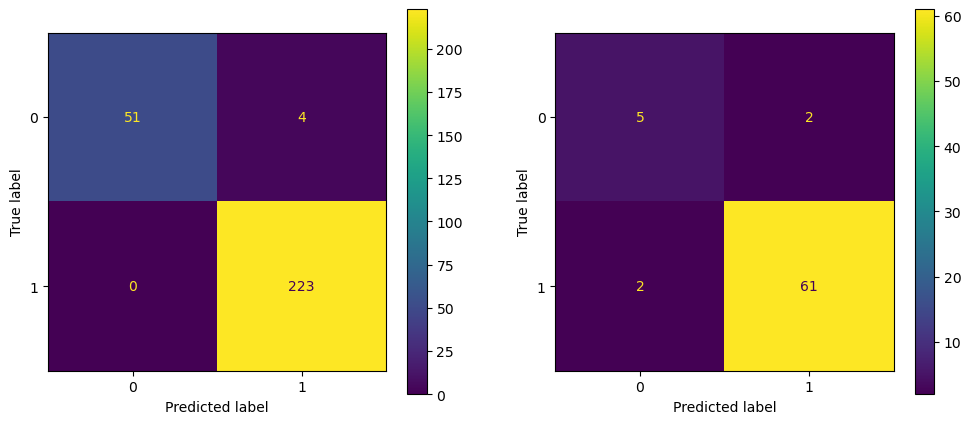

In [459]:
def detailed_objective_x1(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x1_xgb = xgb.XGBClassifier(n_estimators=best_models_x1_xgb_optuna[16].params['n_estimators'],
                                     max_depth=best_models_x1_xgb_optuna[16].params['max_depth'],
                                     learning_rate=best_models_x1_xgb_optuna[16].params['learning_rate'],
                                     subsample=best_models_x1_xgb_optuna[16].params['subsample'],
                                     colsample_bytree=best_models_x1_xgb_optuna[16].params['colsample_bytree'],
                                     gamma=best_models_x1_xgb_optuna[16].params['gamma'],
                                     reg_alpha=best_models_x1_xgb_optuna[16].params['reg_alpha'],
                                     reg_lambda=best_models_x1_xgb_optuna[16].params['reg_lambda'],
                                     min_child_weight=best_models_x1_xgb_optuna[16].params['min_child_weight'],
                                     scale_pos_weight=best_models_x1_xgb_optuna[16].params['scale_pos_weight'],
                                     max_delta_step=best_models_x1_xgb_optuna[16].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x1 = model_x1_xgb.fit(X1_train_spin,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1 = cross_val_score(xgb_spin_optuna_x1,X1_train_spin,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1 = cv_scores_xgb_spin_optuna_x1.mean()

    f1_train_x1_optuna = f1_score(y1_train_spin, model_x1_xgb.predict(X1_train_spin))
    f1_test_x1_optuna = f1_score(y1_test_spin, model_x1_xgb.predict(X1_test_spin))

    f1_train_best_optuna_x1 = f1_score(y1_train_spin,model_x1_xgb.predict(X1_train_spin))
    f1_test_best_optuna_x1 = f1_score(y1_test_spin,model_x1_xgb.predict(X1_test_spin))
    print(f1_train_best_optuna_x1,avg_f1_cv_xgb_spin_optuna_x1,f1_test_best_optuna_x1)

    ## Exporting the results of best trial no 16
    y_pred_x1 = model_x1_xgb.predict(X1_mu)
    out_file_x1 = pd.DataFrame({'y_true': y_spin, 'y_pred_x1': y_pred_x1})
    out_file_x1.to_excel('Results_Mag_States/y_pred_X1_Optuna_16.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x1 = confusion_matrix(y1_train_spin,xgb_spin_optuna_x1.predict(X1_train_spin))
    cm_test_best_optuna_x1 = confusion_matrix(y1_test_spin,xgb_spin_optuna_x1.predict(X1_test_spin))
    
    disp_train_best_optuna_x1 = ConfusionMatrixDisplay(cm_train_best_optuna_x1)
    disp_test_best_optuna_x1 = ConfusionMatrixDisplay(cm_test_best_optuna_x1)
    
    disp_train_best_optuna_x1.plot(ax=axes[0])
    disp_test_best_optuna_x1.plot(ax=axes[1])
    
    plt.show()
detailed_objective_x1(study_x1_xgb.best_trials[16])

0.971677559912854 0.7808234671399186 0.96875


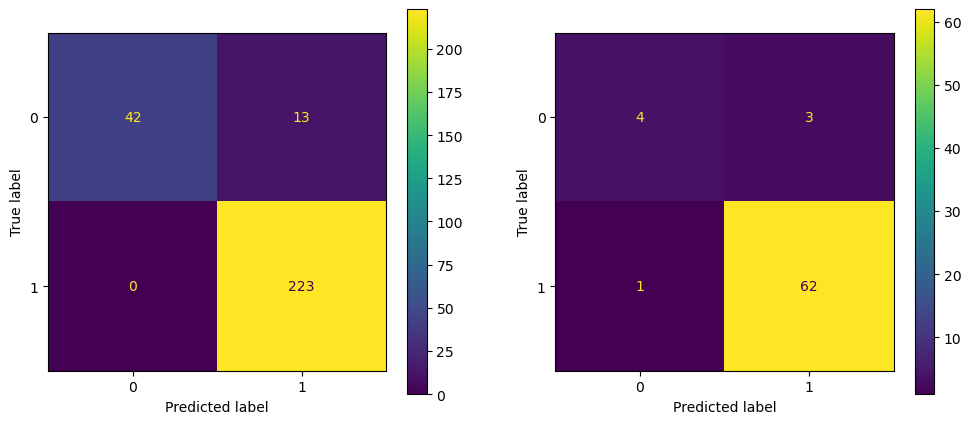

In [458]:
detailed_objective_x1(study_x1_xgb.best_trials[18])

0.9695652173913043 0.7834200046343858 0.96875


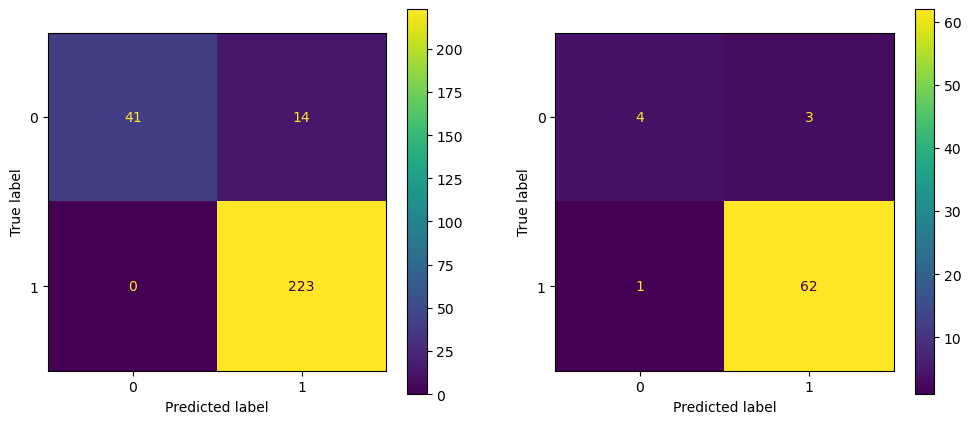

In [200]:
detailed_objective_x1(study_x1_xgb.best_trials[19])

In [33]:
## Backward features elimination

In [40]:
# !pip install --upgrade mlxtend
# !pip install scikit-learn==1.3.1

In [202]:
xgb_spin_be_x1 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)
n_features = X1_train_spin.shape[1]

xgb_spin_sfs_x1 = sfs(xgb_spin_be_x1,forward=False,k_features=(1,n_features),scoring='f1_weighted',cv=cv,verbose=2,n_jobs=-1)

xgb_spin_sfs_x1 = xgb_spin_sfs_x1.fit(X1_train_spin, y1_train_spin)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 194 out of 194 | elapsed:   17.2s finished

[2025-03-08 16:15:36] Features: 193/1 -- score: 0.779941871109618[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 193 out of 193 | elapsed:   16.9s finished

[2025-03-08 16:15:53] Features: 192/1 -- score: 0.7879032502554209[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 192 out of 192 | elapsed:   16.7s finished

[2025-03-08 16:16:10] Features: 191/1 -- score: 0.

In [203]:
# !pip install scikit-learn==1.3.1

In [204]:
xgb_spin_sfs_x1.get_metric_dict()

{194: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   52,
   53,
   54,
   55,
   56,
   57,
   58,
   59,
   60,
   61,
   62,
   63,
   64,
   65,
   66,
   67,
   68,
   69,
   70,
   71,
   72,
   73,
   74,
   75,
   76,
   77,
   78,
   79,
   80,
   81,
   82,
   83,
   84,
   85,
   86,
   87,
   88,
   89,
   90,
   91,
   92,
   93,
   94,
   95,
   96,
   97,
   98,
   99,
   100,
   101,
   102,
   103,
   104,
   105,
   106,
   107,
   108,
   109,
   110,
   111,
   112,
   113,
   114,
   115,
   116,
   117,
   118,
   119,
   120,
   121,
   122,
   123,
   124,
   125,
   126,
   127,
   128,
   129,
   130,
   131,
   132,
   133,
   134,
   135,
  

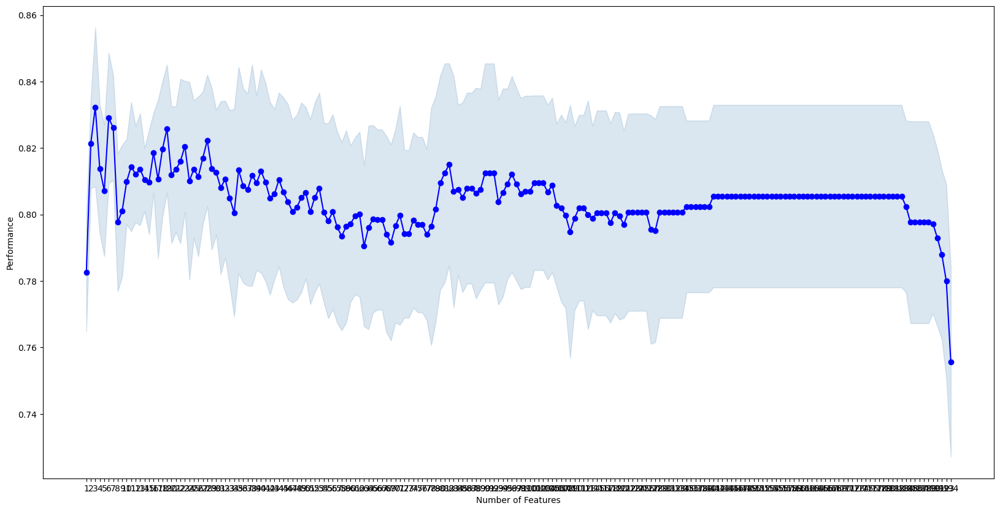

In [205]:
fig = plot_sfs(xgb_spin_sfs_x1.get_metric_dict(),kind='std_err',figsize=(20,10))
plt.show()

In [206]:
xgb_spin_sfs_x1.k_feature_idx_

(27, 67, 96)

In [207]:
print(xgb_spin_sfs_x1.k_feature_names_)
print(len(xgb_spin_sfs_x1.k_feature_names_))

('std_mendeleev_number', 'std_unp_electrons', 'avg_a12x18_lattice_constant')
3


In [208]:
X1_mu_be_xgb = X1_mu[[i for i in xgb_spin_sfs_x1.k_feature_names_]]
X1_train_spin_be_xgb = X1_train_spin[[i for i in xgb_spin_sfs_x1.k_feature_names_]]
X1_test_spin_be_xgb = X1_test_spin[[i for i in xgb_spin_sfs_x1.k_feature_names_]]

In [209]:
def find_extra_element(tuple1,tuple2):
    set1 = set(tuple1)
    set2 = set(tuple2)
    
    extra_element = (set1 - set2).pop()
    return extra_element

for i in range(len(xgb_spin_sfs_x1.get_metric_dict())):
    j = i+1
    if j==X1_mu.shape[1]:
        eliminated_feature_index = 'None'
        eliminated_feature = 'None'
    else:
        eliminated_feature_index = find_extra_element(xgb_spin_sfs_x1.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x1.get_metric_dict()[j]['feature_idx'])
        eliminated_feature = X1_mu.columns[eliminated_feature_index]
    print(j,eliminated_feature_index,eliminated_feature,xgb_spin_sfs_x1.get_metric_dict()[j]['avg_score'],xgb_spin_sfs_x1.get_metric_dict()[j]['ci_bound'],xgb_spin_sfs_x1.get_metric_dict()[j]['std_dev'],xgb_spin_sfs_x1.get_metric_dict()[j]['std_err'])

1 96 avg_a12x18_lattice_constant 0.7825384188167119 0.04542337130617949 0.03534092607087572 0.01767046303543786
2 27 std_mendeleev_number 0.8214232571280251 0.034734129614656425 0.02702433288303264 0.013512166441516319
3 190 delta_b14x914_avg_melting_point 0.8323215236813757 0.061564953485358245 0.04789962539365617 0.023949812696828086
4 180 avg_a12b58_lattice_constant 0.8137317275669733 0.04995757079588812 0.03886868731687102 0.01943434365843551
5 75 avg_a12b58_ion_energies 0.8072128895851959 0.05080161788042995 0.039525384623948126 0.01976269231197406
6 98 avg_a12x18_vdw_radius 0.8290151711773497 0.05044854552951413 0.03925068233980285 0.019625341169901424
7 178 delta_a12x914_avg_vdw_radius 0.8260850042352228 0.040398018097852595 0.03143103054554386 0.01571551527277193
8 137 std_electron_affinity 0.7976374430368933 0.05338355028425912 0.041534215751621625 0.020767107875810813
9 191 delta_b14x18_avg_dipole_polarizability 0.801090103026864 0.0508942955885487 0.0395974910294583 0.019798

In [210]:
iteration_be_xgb_x1 = []
eliminated_feature_index_be_xgb_x1 = []
eliminated_feature_be_xgb_x1 = []
avg_cv_F1_score_be_xgb_x1 = []
ci_bound_be_xgb_x1 = []
std_dev_be_xgb_x1 = []
std_err_be_xgb_x1 = []

for i in range(len(xgb_spin_sfs_x1.get_metric_dict())):
    j = i+1
    iteration_be_xgb_x1.append(j)
    if j==X1_mu.shape[1]:
        eliminated_feature_index_be_xgb_x1.append('None')
        eliminated_feature_be_xgb_x1.append('None')
    else:
        elim_feat_index_for_feat_be_xgb_x1 = find_extra_element(xgb_spin_sfs_x1.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x1.get_metric_dict()[j]['feature_idx'])
        eliminated_feature_index_be_xgb_x1.append(elim_feat_index_for_feat_be_xgb_x1)
        eliminated_feature_be_xgb_x1.append(X1_mu.columns[elim_feat_index_for_feat_be_xgb_x1])

    avg_cv_F1_score_be_xgb_x1.append(xgb_spin_sfs_x1.get_metric_dict()[j]['avg_score'])
    ci_bound_be_xgb_x1.append(xgb_spin_sfs_x1.get_metric_dict()[j]['ci_bound'])
    std_dev_be_xgb_x1.append(xgb_spin_sfs_x1.get_metric_dict()[j]['std_dev'])
    std_err_be_xgb_x1.append(xgb_spin_sfs_x1.get_metric_dict()[j]['std_err'])

In [211]:
training_history_be_xgb_x1 = pd.DataFrame({
    'iteration':iteration_be_xgb_x1,
    'eliminated_feature_index': eliminated_feature_index_be_xgb_x1,
    'eliminated_feature': eliminated_feature_be_xgb_x1,
    'avg_cv_F1_score': avg_cv_F1_score_be_xgb_x1,
    'ci_bound_be': ci_bound_be_xgb_x1,
    'std_dev_be': std_dev_be_xgb_x1,
    'std_err_be': std_err_be_xgb_x1
})

training_history_be_xgb_x1.to_csv('Results_Mag_States/XGB_X1_training_history.csv',index=False)

0.9818223393102433 0.8323215236813757 0.9029333333333333


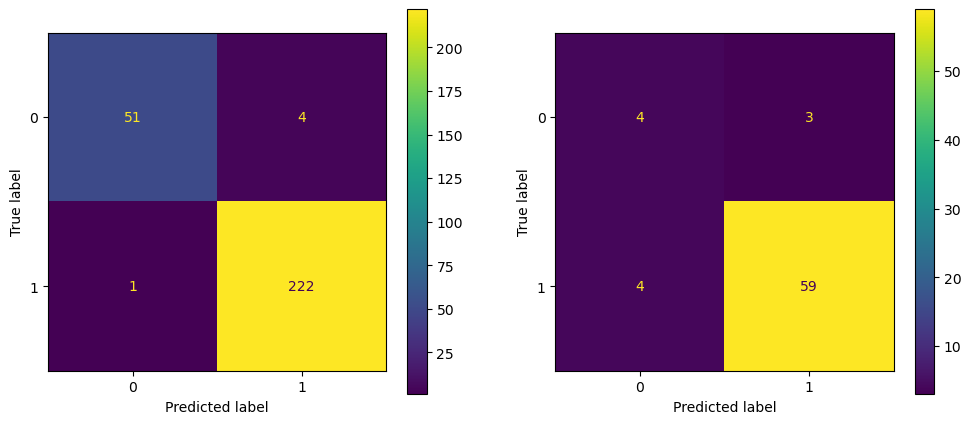

In [213]:
model_xgb_from_be_x1 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)

xgb_from_be_x1 = model_xgb_from_be_x1.fit(X1_train_spin_be_xgb, y1_train_spin)

cv_scores_xgb_from_be_x1 = cross_val_score(xgb_from_be_x1,X1_train_spin_be_xgb,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_from_be_x1 = cv_scores_xgb_from_be_x1.mean()

f1_train_xgb_from_be_x1 = f1_score(y1_train_spin,model_xgb_from_be_x1.predict(X1_train_spin_be_xgb), average='weighted')
f1_test_xgb_from_be_x1 = f1_score(y1_test_spin,model_xgb_from_be_x1.predict(X1_test_spin_be_xgb), average='weighted')
print(f1_train_xgb_from_be_x1,avg_f1_cv_xgb_from_be_x1,f1_test_xgb_from_be_x1)

fig,axes = plt.subplots(1,2,figsize=(12,5))

cm_train_xgb_from_be_x1 = confusion_matrix(y1_train_spin,xgb_from_be_x1.predict(X1_train_spin_be_xgb))
cm_test_xgb_from_be_x1 = confusion_matrix(y1_test_spin,xgb_from_be_x1.predict(X1_test_spin_be_xgb))

disp_train_xgb_from_be_x1 = ConfusionMatrixDisplay(cm_train_xgb_from_be_x1)
disp_test_xgb_from_be_x1 = ConfusionMatrixDisplay(cm_test_xgb_from_be_x1)

disp_train_xgb_from_be_x1.plot(ax=axes[0])
disp_test_xgb_from_be_x1.plot(ax=axes[1])

plt.show()

In [215]:
import optuna
import random

def objective_x1_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x1_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x1_be = model_be_x1_xgb.fit(X1_train_spin_be_xgb,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1_be = cross_val_score(xgb_spin_optuna_x1_be,X1_train_spin_be_xgb,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1_be = cv_scores_xgb_spin_optuna_x1_be.mean()

    # Return best F1 scores
    f1_train_x1_be = f1_score(y1_train_spin, model_be_x1_xgb.predict(X1_train_spin_be_xgb),average='weighted')
    f1_test_x1_be = f1_score(y1_test_spin, model_be_x1_xgb.predict(X1_test_spin_be_xgb),average='weighted')
    return f1_train_x1_be,avg_f1_cv_xgb_spin_optuna_x1_be,f1_test_x1_be
# return avg_f1_cv_et_spin_optunax1

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_be_x1_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_be_x1_xgb.optimize(objective_x1_be, n_trials=300)

[I 2025-03-08 18:35:19,438] A new study created in memory with name: no-name-781adbbc-0a86-47f3-a013-8d1a591e83b6
[I 2025-03-08 18:35:22,079] Trial 0 finished with values: [0.7388651604682187, 0.7229060633966562, 0.8526315789473684] and parameters: {'n_estimators': 126, 'max_depth': 31, 'learning_rate': 0.09260696912193013, 'subsample': 0.5108596056951824, 'colsample_bytree': 0.9025453802470483, 'gamma': 1.9652963102201038, 'reg_alpha': 0.03122595875172801, 'reg_lambda': 1.4698239171561896e-05, 'min_child_weight': 7, 'scale_pos_weight': 6, 'max_delta_step': 6.468425797024534}.
[I 2025-03-08 18:35:23,768] Trial 1 finished with values: [0.766395402947419, 0.7491543263601649, 0.8840909090909091] and parameters: {'n_estimators': 115, 'max_depth': 43, 'learning_rate': 0.23530827875354732, 'subsample': 0.758187122303422, 'colsample_bytree': 0.3597296693585348, 'gamma': 9.419755465933816, 'reg_alpha': 1.464842313965937e-06, 'reg_lambda': 5.852483447176e-08, 'min_child_weight': 2, 'scale_pos_w

In [216]:
best_models_x1_be_xgb = study_be_x1_xgb.best_trials
for i in range(len(best_models_x1_be_xgb)):
    print('\n',i)
    print('Trial number: ', best_models_x1_be_xgb[i].number)
    print('F1 scores: ', best_models_x1_be_xgb[i].values)
    print('Parameters: ', best_models_x1_be_xgb[i].params)


 0
Trial number:  228
F1 scores:  [0.9547572351173512, 0.8057341861483778, 0.9385416666666667]
Parameters:  {'n_estimators': 140, 'max_depth': 19, 'learning_rate': 0.2725272407163364, 'subsample': 0.9399501023335908, 'colsample_bytree': 0.5608750879535092, 'gamma': 0.3491266609301602, 'reg_alpha': 1.7559227022622543e-07, 'reg_lambda': 1.443439479567324e-07, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 5.3803677854861975}

 1
Trial number:  240
F1 scores:  [0.8768493695318521, 0.8168937956852709, 0.8840909090909091]
Parameters:  {'n_estimators': 90, 'max_depth': 10, 'learning_rate': 0.28475861898015575, 'subsample': 0.6533486500307842, 'colsample_bytree': 0.23411266868025038, 'gamma': 1.2108228196996906, 'reg_alpha': 1.2472674517955957e-05, 'reg_lambda': 2.4292040259438433e-05, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 4.801576304976798}

 2
Trial number:  252
F1 scores:  [0.938544439386319, 0.8167661804773871, 0.8984615384615385]
Parameters:  {

In [605]:
best_models_x1_be_xgb_pd = pd.DataFrame({'Trial number': [best_models_x1_be_xgb[i].number for i in range(len(best_models_x1_be_xgb))],
                                             'Train F1': [best_models_x1_be_xgb[i].values[0] for i in range(len(best_models_x1_be_xgb))],
                                             'Test F1': [best_models_x1_be_xgb[i].values[2] for i in range(len(best_models_x1_be_xgb))],
                                             'CV F1': [best_models_x1_be_xgb[i].values[1] for i in range(len(best_models_x1_be_xgb))],
                                             'n_estimators': [best_models_x1_be_xgb[i].params['n_estimators'] for i in range(len(best_models_x1_be_xgb))],
                                             'max_depth': [best_models_x1_be_xgb[i].params['max_depth'] for i in range(len(best_models_x1_be_xgb))],
                                             'learning_rate': [best_models_x1_be_xgb[i].params['learning_rate'] for i in range(len(best_models_x1_be_xgb))],
                                             'subsample': [best_models_x1_be_xgb[i].params['subsample'] for i in range(len(best_models_x1_be_xgb))],
                                             'colsample_bytree': [best_models_x1_be_xgb[i].params['colsample_bytree'] for i in range(len(best_models_x1_be_xgb))],
                                             'gamma': [best_models_x1_be_xgb[i].params['gamma'] for i in range(len(best_models_x1_be_xgb))],
                                             'reg_alpha': [best_models_x1_be_xgb[i].params['reg_alpha'] for i in range(len(best_models_x1_be_xgb))],
                                             'reg_lambda': [best_models_x1_be_xgb[i].params['reg_lambda'] for i in range(len(best_models_x1_be_xgb))],
                                             'min_child_weight': [best_models_x1_be_xgb[i].params['min_child_weight'] for i in range(len(best_models_x1_be_xgb))],
                                             'scale_pos_weight': [best_models_x1_be_xgb[i].params['scale_pos_weight'] for i in range(len(best_models_x1_be_xgb))],
                                             'max_delta_step': [best_models_x1_be_xgb[i].params['max_delta_step'] for i in range(len(best_models_x1_be_xgb))]
                                            })
best_models_x1_be_xgb_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X1_BE_HP_Optuna.xlsx')

In [463]:
# 0
# Trial number:  228
# F1 scores:  [0.9547572351173512, 0.8057341861483778, 0.9385416666666667]
# Parameters:  {'n_estimators': 140, 'max_depth': 19, 'learning_rate': 0.2725272407163364, 'subsample': 0.9399501023335908, 'colsample_bytree': 0.5608750879535092, 'gamma': 0.3491266609301602, 'reg_alpha': 1.7559227022622543e-07, 'reg_lambda': 1.443439479567324e-07, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 5.3803677854861975}

#  1
# Trial number:  240
# F1 scores:  [0.8768493695318521, 0.8168937956852709, 0.8840909090909091]
# Parameters:  {'n_estimators': 90, 'max_depth': 10, 'learning_rate': 0.28475861898015575, 'subsample': 0.6533486500307842, 'colsample_bytree': 0.23411266868025038, 'gamma': 1.2108228196996906, 'reg_alpha': 1.2472674517955957e-05, 'reg_lambda': 2.4292040259438433e-05, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 4.801576304976798}

#  2
# Trial number:  252
# F1 scores:  [0.938544439386319, 0.8167661804773871, 0.8984615384615385]
# Parameters:  {'n_estimators': 115, 'max_depth': 8, 'learning_rate': 0.23530827875354732, 'subsample': 0.37449006958893594, 'colsample_bytree': 0.49261140336529197, 'gamma': 0.3491266609301602, 'reg_alpha': 1.7559227022622543e-07, 'reg_lambda': 4.8036264268845026e-05, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 5.3803677854861975}

#  3
# Trial number:  259
# F1 scores:  [0.9431915959045983, 0.8078059658674958, 0.9385416666666667]
# Parameters:  {'n_estimators': 102, 'max_depth': 40, 'learning_rate': 0.2725272407163364, 'subsample': 0.4742332568743294, 'colsample_bytree': 0.2827570379199015, 'gamma': 0.49400381607377697, 'reg_alpha': 0.025148792088303604, 'reg_lambda': 0.00042360162268812595, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 6.403988350233095}

#  4
# Trial number:  283
# F1 scores:  [0.978105968055744, 0.8160159318686672, 0.9142857142857143]
# Parameters:  {'n_estimators': 123, 'max_depth': 19, 'learning_rate': 0.23530827875354732, 'subsample': 0.9244314299497967, 'colsample_bytree': 0.9446494421315444, 'gamma': 0.3491266609301602, 'reg_alpha': 0.0003194771156800057, 'reg_lambda': 0.00042360162268812595, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 8.632819011979286}

0.978105968055744 0.8160159318686672 0.9142857142857143


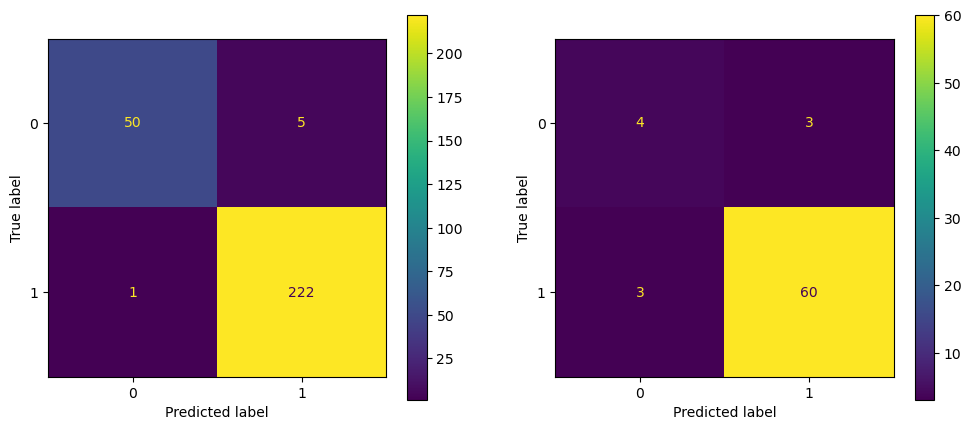

In [462]:
def detailed_objective_x1_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x1_xgb = xgb.XGBClassifier(n_estimators=best_models_x1_be_xgb[4].params['n_estimators'],
                                     max_depth=best_models_x1_be_xgb[4].params['max_depth'],
                                     learning_rate=best_models_x1_be_xgb[4].params['learning_rate'],
                                     subsample=best_models_x1_be_xgb[4].params['subsample'],
                                     colsample_bytree=best_models_x1_be_xgb[4].params['colsample_bytree'],
                                     gamma=best_models_x1_be_xgb[4].params['gamma'],
                                     reg_alpha=best_models_x1_be_xgb[4].params['reg_alpha'],
                                     reg_lambda=best_models_x1_be_xgb[4].params['reg_lambda'],
                                     min_child_weight=best_models_x1_be_xgb[4].params['min_child_weight'],
                                     scale_pos_weight=best_models_x1_be_xgb[4].params['scale_pos_weight'],
                                     max_delta_step=best_models_x1_be_xgb[4].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x1_be = model_be_x1_xgb.fit(X1_train_spin_be_xgb,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1_be = cross_val_score(xgb_spin_optuna_x1_be,X1_train_spin_be_xgb,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1_be = cv_scores_xgb_spin_optuna_x1_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y1_train_spin,model_be_x1_xgb.predict(X1_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y1_test_spin,model_be_x1_xgb.predict(X1_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x1_be,f1_test_xgb_best_optuna_be)
     
    ## Exporting the results of best trial no 4
    y_pred_x1_be = model_be_x1_xgb.predict(X1_mu_be_xgb)
    out_file_x1_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x1_be': y_pred_x1_be})
    out_file_x1_be.to_excel('Results_Mag_States/y_pred_X1_be_Optuna_4.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_xgb_best_optuna_be = confusion_matrix(y1_train_spin,xgb_spin_optuna_x1_be.predict(X1_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y1_test_spin,xgb_spin_optuna_x1_be.predict(X1_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x1_be(study_be_x1_xgb.best_trials[4])

0.9547572351173512 0.8057341861483778 0.9385416666666667


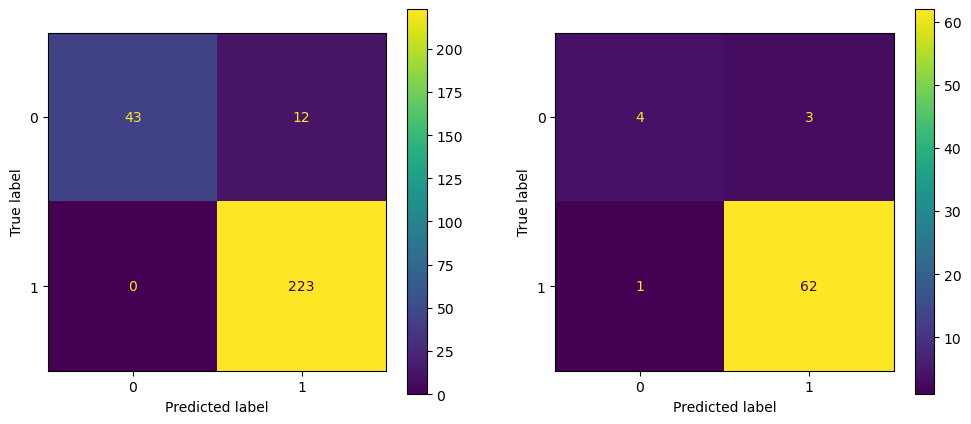

In [460]:
detailed_objective_x1_be(study_be_x1_xgb.best_trials[0])

0.9431915959045983 0.8078059658674958 0.9385416666666667


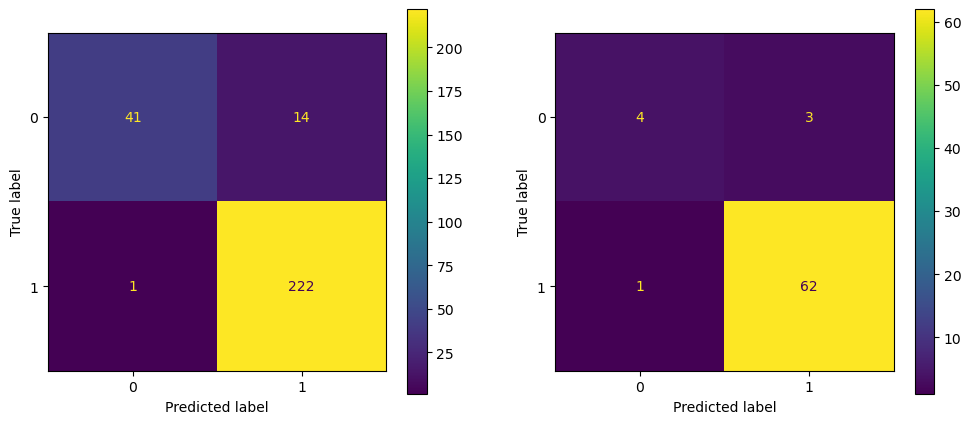

In [317]:
detailed_objective_x1_be(study_be_x1_xgb.best_trials[3])

In [221]:
## X2 dataset

In [222]:
import optuna
import random
X2_train_spin,X2_test_spin,y2_train_spin,y2_test_spin = train_test_split(X2_mu,y_spin,test_size=0.20,random_state=82)

def objective_x2(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x2_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x2 = model_x2_xgb.fit(X2_train_spin,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2 = cross_val_score(xgb_spin_optuna_x2,X2_train_spin,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2 = cv_scores_xgb_spin_optuna_x2.mean()

    # Return best F1 scores
    f1_train_x2 = f1_score(y2_train_spin, model_x2_xgb.predict(X2_train_spin))
    f1_test_x2 = f1_score(y2_test_spin, model_x2_xgb.predict(X2_test_spin))
    return f1_train_x2,avg_f1_cv_xgb_spin_optuna_x2,f1_test_x2
# return avg_f1_cv_xgb_spin_optuna_x2

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_x2_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_x2_xgb.optimize(objective_x2, n_trials=300)

[I 2025-03-08 18:36:50,278] A new study created in memory with name: no-name-d0e0eb2c-f136-4aef-87b7-52fbb3854dbf
[I 2025-03-08 18:36:50,642] Trial 0 finished with values: [0.8902195608782435, 0.7148068898429372, 0.9473684210526315] and parameters: {'n_estimators': 63, 'max_depth': 40, 'learning_rate': 0.05013064954039084, 'subsample': 0.6101742637981739, 'colsample_bytree': 0.408385669212847, 'gamma': 6.406128774284711, 'reg_alpha': 3.5201273997591507, 'reg_lambda': 0.019584065268689502, 'min_child_weight': 1, 'scale_pos_weight': 5, 'max_delta_step': 0.27799978767733213}.
[I 2025-03-08 18:36:50,922] Trial 1 finished with values: [0.9214876033057852, 0.7604826854041603, 0.9538461538461539] and parameters: {'n_estimators': 82, 'max_depth': 9, 'learning_rate': 0.20346846996945883, 'subsample': 0.276973721238679, 'colsample_bytree': 0.5316882962836647, 'gamma': 3.4808633737954677, 'reg_alpha': 0.19462000781155367, 'reg_lambda': 5.355219733623534e-08, 'min_child_weight': 3, 'scale_pos_weig

In [223]:
best_models_x2_xgb_optuna = study_x2_xgb.best_trials
best_models_x2_xgb_optuna

[FrozenTrial(number=26, state=1, values=[0.9227557411273486, 0.7949606621140586, 0.9692307692307692], datetime_start=datetime.datetime(2025, 3, 8, 18, 36, 57, 819595), datetime_complete=datetime.datetime(2025, 3, 8, 18, 36, 58, 27259), params={'n_estimators': 28, 'max_depth': 6, 'learning_rate': 0.23937824402590516, 'subsample': 0.6977166789234838, 'colsample_bytree': 0.8103120461040783, 'gamma': 3.7746691647411135, 'reg_alpha': 0.0010489285283962221, 'reg_lambda': 9.365061100599371e-08, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 9.658191953475477}, user_attrs={}, system_attrs={'nsga2:generation': 0}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=150, log=False, low=10, step=1), 'max_depth': IntDistribution(high=50, log=False, low=5, step=1), 'learning_rate': FloatDistribution(high=0.3, log=True, low=0.05, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.1, step=None), 'colsample_bytree': FloatDistribution(high=1.0

In [224]:
for i in range(len(best_models_x2_xgb_optuna)):
    print('\n',i)
    print('Trial number: ', best_models_x2_xgb_optuna[i].number)
    print('F1 scores: ', best_models_x2_xgb_optuna[i].values)
    print('Parameters: ', best_models_x2_xgb_optuna[i].params)


 0
Trial number:  26
F1 scores:  [0.9227557411273486, 0.7949606621140586, 0.9692307692307692]
Parameters:  {'n_estimators': 28, 'max_depth': 6, 'learning_rate': 0.23937824402590516, 'subsample': 0.6977166789234838, 'colsample_bytree': 0.8103120461040783, 'gamma': 3.7746691647411135, 'reg_alpha': 0.0010489285283962221, 'reg_lambda': 9.365061100599371e-08, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 9.658191953475477}

 1
Trial number:  96
F1 scores:  [0.9311064718162839, 0.8055615439966595, 0.9612403100775194]
Parameters:  {'n_estimators': 11, 'max_depth': 35, 'learning_rate': 0.23219178457032422, 'subsample': 0.8824325281683184, 'colsample_bytree': 0.9907322152878343, 'gamma': 4.328719955628606, 'reg_alpha': 1.2385059655282125e-08, 'reg_lambda': 0.012175815785312369, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 5.415706389738601}

 2
Trial number:  144
F1 scores:  [0.9911111111111112, 0.7885834384054731, 0.96875]
Parameters:  {'n_estimators': 13

In [606]:
best_models_x2_xgb_optuna_pd = pd.DataFrame({'Trial number': [best_models_x2_xgb_optuna[i].number for i in range(len(best_models_x2_xgb_optuna))],
                                             'Train F1': [best_models_x2_xgb_optuna[i].values[0] for i in range(len(best_models_x2_xgb_optuna))],
                                             'Test F1': [best_models_x2_xgb_optuna[i].values[2] for i in range(len(best_models_x2_xgb_optuna))],
                                             'CV F1': [best_models_x2_xgb_optuna[i].values[1] for i in range(len(best_models_x2_xgb_optuna))],
                                             'n_estimators': [best_models_x2_xgb_optuna[i].params['n_estimators'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'max_depth': [best_models_x2_xgb_optuna[i].params['max_depth'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'learning_rate': [best_models_x2_xgb_optuna[i].params['learning_rate'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'subsample': [best_models_x2_xgb_optuna[i].params['subsample'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'colsample_bytree': [best_models_x2_xgb_optuna[i].params['colsample_bytree'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'gamma': [best_models_x2_xgb_optuna[i].params['gamma'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'reg_alpha': [best_models_x2_xgb_optuna[i].params['reg_alpha'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'reg_lambda': [best_models_x2_xgb_optuna[i].params['reg_lambda'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'min_child_weight': [best_models_x2_xgb_optuna[i].params['min_child_weight'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'scale_pos_weight': [best_models_x2_xgb_optuna[i].params['scale_pos_weight'] for i in range(len(best_models_x2_xgb_optuna))],
                                             'max_delta_step': [best_models_x2_xgb_optuna[i].params['max_delta_step'] for i in range(len(best_models_x2_xgb_optuna))]
                                            })
best_models_x2_xgb_optuna_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X2_HP_Optuna.xlsx')

In [464]:
# 0
# Trial number:  26
# F1 scores:  [0.9227557411273486, 0.7949606621140586, 0.9692307692307692]
# Parameters:  {'n_estimators': 28, 'max_depth': 6, 'learning_rate': 0.23937824402590516, 'subsample': 0.6977166789234838, 'colsample_bytree': 0.8103120461040783, 'gamma': 3.7746691647411135, 'reg_alpha': 0.0010489285283962221, 'reg_lambda': 9.365061100599371e-08, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 9.658191953475477}

#  1
# Trial number:  96
# F1 scores:  [0.9311064718162839, 0.8055615439966595, 0.9612403100775194]
# Parameters:  {'n_estimators': 11, 'max_depth': 35, 'learning_rate': 0.23219178457032422, 'subsample': 0.8824325281683184, 'colsample_bytree': 0.9907322152878343, 'gamma': 4.328719955628606, 'reg_alpha': 1.2385059655282125e-08, 'reg_lambda': 0.012175815785312369, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 5.415706389738601}

#  2
# Trial number:  144
# F1 scores:  [0.9911111111111112, 0.7885834384054731, 0.96875]
# Parameters:  {'n_estimators': 133, 'max_depth': 24, 'learning_rate': 0.07455677486404019, 'subsample': 0.7545861097488139, 'colsample_bytree': 0.6923898608651717, 'gamma': 0.8534748347436583, 'reg_alpha': 0.11031137849558018, 'reg_lambda': 0.0031068102545928353, 'min_child_weight': 2, 'scale_pos_weight': 6, 'max_delta_step': 8.216860425232694}

#  3
# Trial number:  161
# F1 scores:  [0.9612068965517241, 0.7682369778821626, 0.9763779527559056]
# Parameters:  {'n_estimators': 82, 'max_depth': 20, 'learning_rate': 0.20346846996945883, 'subsample': 0.87036893151933, 'colsample_bytree': 0.5316882962836647, 'gamma': 3.0046866979162132, 'reg_alpha': 0.11031137849558018, 'reg_lambda': 5.355219733623534e-08, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 4.5725450590889505}

#  4
# Trial number:  200
# F1 scores:  [0.9977628635346756, 0.7879172556733121, 0.96875]
# Parameters:  {'n_estimators': 82, 'max_depth': 19, 'learning_rate': 0.09110232953532087, 'subsample': 0.7545861097488139, 'colsample_bytree': 0.5316882962836647, 'gamma': 0.8534748347436583, 'reg_alpha': 0.11031137849558018, 'reg_lambda': 5.355219733623534e-08, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 5.825528382648165}

#  5
# Trial number:  203
# F1 scores:  [0.9911111111111112, 0.7945904840808862, 0.953125]
# Parameters:  {'n_estimators': 133, 'max_depth': 24, 'learning_rate': 0.07455677486404019, 'subsample': 0.7545861097488139, 'colsample_bytree': 0.4600401878575475, 'gamma': 0.8534748347436583, 'reg_alpha': 1.2385059655282125e-08, 'reg_lambda': 0.0031068102545928353, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 3.121245937494991}

#  6
# Trial number:  204
# F1 scores:  [0.9867256637168141, 0.7942194324792682, 0.96875]
# Parameters:  {'n_estimators': 125, 'max_depth': 35, 'learning_rate': 0.12757715347745407, 'subsample': 0.774001554700147, 'colsample_bytree': 0.41471132267411603, 'gamma': 1.650450792696504, 'reg_alpha': 0.32771678738002874, 'reg_lambda': 0.012175815785312369, 'min_child_weight': 1, 'scale_pos_weight': 6, 'max_delta_step': 3.515561857105106}

#  7
# Trial number:  206
# F1 scores:  [0.9845474613686535, 0.7952820987860502, 0.96875]
# Parameters:  {'n_estimators': 124, 'max_depth': 46, 'learning_rate': 0.0592607876610017, 'subsample': 0.7545861097488139, 'colsample_bytree': 0.7824844558384243, 'gamma': 0.8534748347436583, 'reg_alpha': 0.11031137849558018, 'reg_lambda': 0.0031068102545928353, 'min_child_weight': 2, 'scale_pos_weight': 6, 'max_delta_step': 8.216860425232694}

#  8
# Trial number:  207
# F1 scores:  [0.9272349272349273, 0.7841614291262549, 0.9767441860465116]
# Parameters:  {'n_estimators': 143, 'max_depth': 35, 'learning_rate': 0.2434266809987575, 'subsample': 0.8824325281683184, 'colsample_bytree': 0.89314288648395, 'gamma': 7.440945973091763, 'reg_alpha': 4.3410009646234704e-07, 'reg_lambda': 0.0005083684407358236, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 5.616581414647283}

#  9
# Trial number:  255
# F1 scores:  [0.9291666666666667, 0.7806586133139118, 0.9767441860465116]
# Parameters:  {'n_estimators': 11, 'max_depth': 46, 'learning_rate': 0.23219178457032422, 'subsample': 0.8824325281683184, 'colsample_bytree': 0.7824844558384243, 'gamma': 4.328719955628606, 'reg_alpha': 1.2385059655282125e-08, 'reg_lambda': 0.012175815785312369, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 5.415706389738601}

#  10
# Trial number:  273
# F1 scores:  [0.9240506329113924, 0.8004167778283673, 0.96875]
# Parameters:  {'n_estimators': 122, 'max_depth': 6, 'learning_rate': 0.23937824402590516, 'subsample': 0.87036893151933, 'colsample_bytree': 0.4080773739875755, 'gamma': 3.7746691647411135, 'reg_alpha': 4.963715888317027e-07, 'reg_lambda': 9.365061100599371e-08, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 3.0577256600863354}

#  11
# Trial number:  275
# F1 scores:  [0.9389473684210526, 0.7958497899866457, 0.9606299212598425]
# Parameters:  {'n_estimators': 67, 'max_depth': 16, 'learning_rate': 0.09110232953532087, 'subsample': 0.8824325281683184, 'colsample_bytree': 0.3365125771405766, 'gamma': 2.4516229307785817, 'reg_alpha': 0.007062331688156336, 'reg_lambda': 0.0005083684407358236, 'min_child_weight': 2, 'scale_pos_weight': 4, 'max_delta_step': 1.8327295905422925}

0.9911111111111112 0.7885834384054731 0.96875


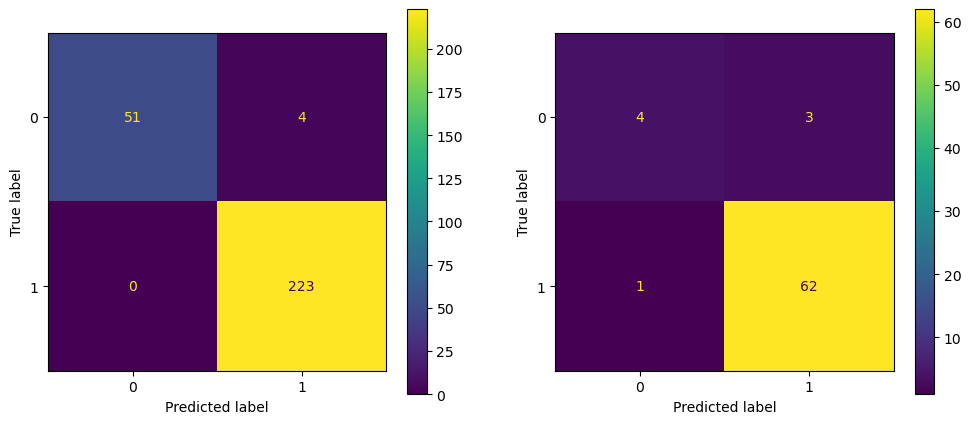

In [468]:
def detailed_objective_x2(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x2_xgb = xgb.XGBClassifier(n_estimators=best_models_x2_xgb_optuna[2].params['n_estimators'],
                                     max_depth=best_models_x2_xgb_optuna[2].params['max_depth'],
                                     learning_rate=best_models_x2_xgb_optuna[2].params['learning_rate'],
                                     subsample=best_models_x2_xgb_optuna[2].params['subsample'],
                                     colsample_bytree=best_models_x2_xgb_optuna[2].params['colsample_bytree'],
                                     gamma=best_models_x2_xgb_optuna[2].params['gamma'],
                                     reg_alpha=best_models_x2_xgb_optuna[2].params['reg_alpha'],
                                     reg_lambda=best_models_x2_xgb_optuna[2].params['reg_lambda'],
                                     min_child_weight=best_models_x2_xgb_optuna[2].params['min_child_weight'],
                                     scale_pos_weight=best_models_x2_xgb_optuna[2].params['scale_pos_weight'],
                                     max_delta_step=best_models_x2_xgb_optuna[2].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x2 = model_x2_xgb.fit(X2_train_spin,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2 = cross_val_score(xgb_spin_optuna_x2,X2_train_spin,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2 = cv_scores_xgb_spin_optuna_x2.mean()

    f1_train_x2_optuna = f1_score(y2_train_spin, model_x2_xgb.predict(X2_train_spin))
    f1_test_x2_optuna = f1_score(y2_test_spin, model_x2_xgb.predict(X2_test_spin))

    f1_train_best_optuna_x2 = f1_score(y2_train_spin,model_x2_xgb.predict(X2_train_spin))
    f1_test_best_optuna_x2 = f1_score(y2_test_spin,model_x2_xgb.predict(X2_test_spin))
    print(f1_train_best_optuna_x2,avg_f1_cv_xgb_spin_optuna_x2,f1_test_best_optuna_x2)

    ## Exporting the results of best trial no 2, 4, 6, 7
    y_pred_x2 = model_x2_xgb.predict(X2_mu)
    out_file_x2 = pd.DataFrame({'y_true': y_spin, 'y_pred_x2': y_pred_x2})
    out_file_x2.to_excel('Results_Mag_States/y_pred_X2_Optuna_2.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x2 = confusion_matrix(y2_train_spin,xgb_spin_optuna_x2.predict(X2_train_spin))
    cm_test_best_optuna_x2 = confusion_matrix(y2_test_spin,xgb_spin_optuna_x2.predict(X2_test_spin))
    
    disp_train_best_optuna_x2 = ConfusionMatrixDisplay(cm_train_best_optuna_x2)
    disp_test_best_optuna_x2 = ConfusionMatrixDisplay(cm_test_best_optuna_x2)
    
    disp_train_best_optuna_x2.plot(ax=axes[0])
    disp_test_best_optuna_x2.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x2(study_x2_xgb.best_trials[2])

0.9977628635346756 0.7879172556733121 0.96875


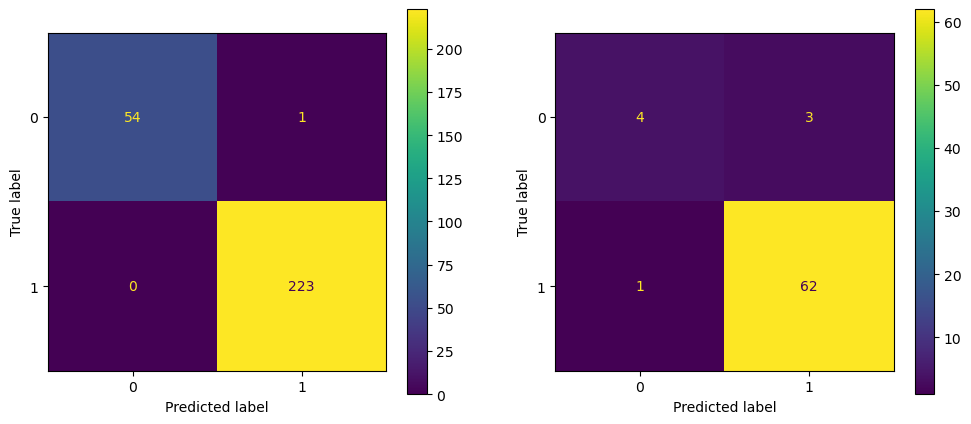

In [333]:
detailed_objective_x2(study_x2_xgb.best_trials[4])

0.9867256637168141 0.7942194324792682 0.96875


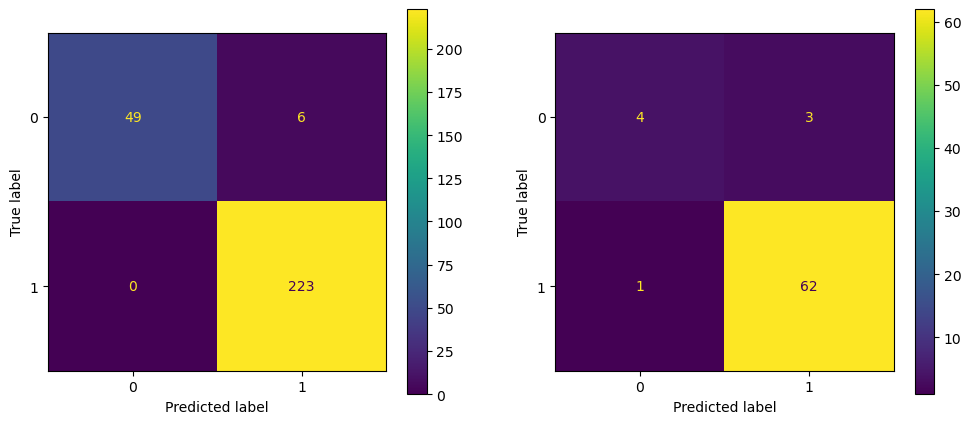

In [336]:
detailed_objective_x2(study_x2_xgb.best_trials[6])

0.9845474613686535 0.7952820987860502 0.96875


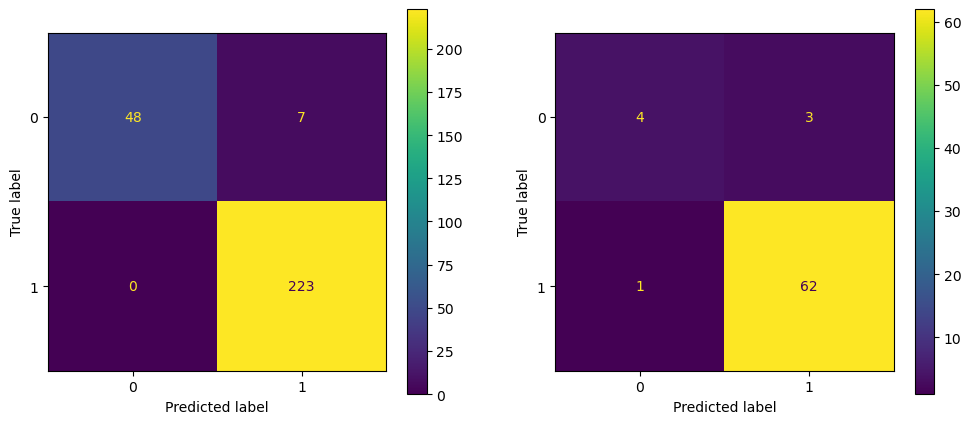

In [338]:
detailed_objective_x2(study_x2_xgb.best_trials[7])

In [227]:
X2_train_spin,X2_test_spin,y2_train_spin,y2_test_spin = train_test_split(X2_mu,y_spin,test_size=0.20,random_state=82)
xgb_spin_be_x2 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)
n_features = X2_train_spin.shape[1]

xgb_spin_sfs_x2 = sfs(xgb_spin_be_x2,forward=False,k_features=(1,n_features),scoring='f1_weighted',cv=cv,verbose=2,n_jobs=-1)

xgb_spin_sfs_x2 = xgb_spin_sfs_x2.fit(X2_train_spin, y2_train_spin)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.2s finished

[2025-03-08 18:38:21] Features: 99/1 -- score: 0.7868734228742188[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  99 out of  99 | elapsed:    4.3s finished

[2025-03-08 18:38:25] Features: 98/1 -- score: 0.790326845654242[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  98 out of  98 | elapsed:    4.1s finished

[2025-03-08 18:38:30] Features: 97/1 -- score: 0.7923284702945768[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  97 ou

In [228]:
xgb_spin_sfs_x2.get_metric_dict()

{100: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   52,
   53,
   54,
   55,
   56,
   57,
   58,
   59,
   60,
   61,
   62,
   63,
   64,
   65,
   66,
   67,
   68,
   69,
   70,
   71,
   72,
   73,
   74,
   75,
   76,
   77,
   78,
   79,
   80,
   81,
   82,
   83,
   84,
   85,
   86,
   87,
   88,
   89,
   90,
   91,
   92,
   93,
   94,
   95,
   96,
   97,
   98,
   99),
  'cv_scores': array([0.81663685, 0.81436421, 0.66883117, 0.74373206, 0.83945841]),
  'avg_score': 0.7766045397831716,
  'feature_names': ('min_vdw_radius',
   'avg_a1a2_vdw_radius',
   'delta_a12x18_avg_vdw_radius',
   'delta_a12x914_avg_vdw_radius',
   'delta_a12b14_avg_vdw_radius',
   

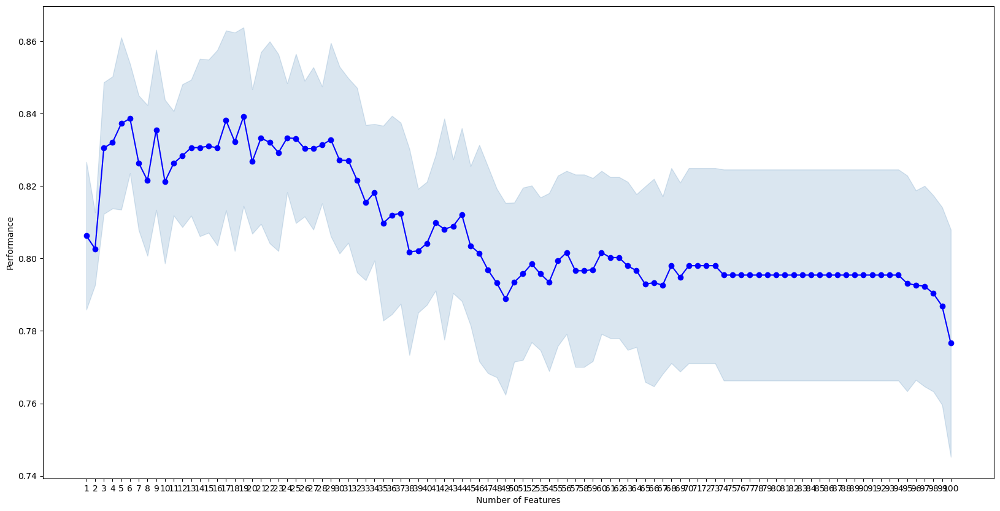

In [229]:
fig = plot_sfs(xgb_spin_sfs_x2.get_metric_dict(),kind='std_err',figsize=(20,10))
plt.show()

In [230]:
xgb_spin_sfs_x2.k_feature_idx_

(5, 11, 13, 18, 20, 29, 31, 33, 52, 64, 72, 73, 81, 86, 88, 90, 92, 94, 99)

In [231]:
print(xgb_spin_sfs_x2.k_feature_names_)
print(len(xgb_spin_sfs_x2.k_feature_names_))

('delta_a12b58_avg_vdw_radius', 'delta_a12x18_avg_covalent_radius', 'delta_a12b14_avg_covalent_radius', 'max_diff_covalent_radius', 'std_atomic_volume', 'delta_a12b14_avg_dipole_polarizability', 'delta_a1a2_dipole_polarizability', 'avg_a12x914_dipole_polarizability', 'std_unp_electrons', 'delta_a12b58_avg_ion_energies', 'delta_a1a2_electronegativity', 'avg_electron_affinity', 'avg_a12x18_electron_affinity', 'avg_a1a2_metallic_radius', 'delta_a12x914_avg_metallic_radius', 'avg_mendeleev_number', 'delta_b18x114_avg_mendeleev_number', 'delta_a12b58_avg_mendeleev_number', 'std_lattice_constant')
19


In [232]:
X2_mu_be_xgb = X2_mu[[i for i in xgb_spin_sfs_x2.k_feature_names_]]
X2_train_spin_be_xgb = X2_train_spin[[i for i in xgb_spin_sfs_x2.k_feature_names_]]
X2_test_spin_be_xgb = X2_test_spin[[i for i in xgb_spin_sfs_x2.k_feature_names_]]

In [234]:
def find_extra_element(tuple1,tuple2):
    set1 = set(tuple1)
    set2 = set(tuple2)
    
    extra_element = (set1 - set2).pop()
    return extra_element

for i in range(len(xgb_spin_sfs_x2.get_metric_dict())):
    j = i+1
    if j==X2_mu.shape[1]:
        eliminated_feature_index = 'None'
        eliminated_feature = 'None'
    else:
        eliminated_feature_index = find_extra_element(xgb_spin_sfs_x2.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x2.get_metric_dict()[j]['feature_idx'])
        eliminated_feature = X2_mu.columns[eliminated_feature_index]
    print(j,eliminated_feature_index,eliminated_feature,xgb_spin_sfs_x2.get_metric_dict()[j]['avg_score'],xgb_spin_sfs_x2.get_metric_dict()[j]['ci_bound'],xgb_spin_sfs_x2.get_metric_dict()[j]['std_dev'],xgb_spin_sfs_x2.get_metric_dict()[j]['std_err'])

1 52 std_unp_electrons 0.8062575843734623 0.05239270934177152 0.04076330783594944 0.020381653917974717
2 73 avg_electron_affinity 0.8026669013970841 0.025789795033332015 0.020065336707670377 0.010032668353835188
3 20 std_atomic_volume 0.8304394528091196 0.0466673555945814 0.03630878810985568 0.01815439405492784
4 18 max_diff_covalent_radius 0.8320073605945637 0.046831555133703975 0.03643654092973969 0.018218270464869846
5 99 std_lattice_constant 0.8372182824423916 0.061082593701797305 0.0475243330945557 0.023762166547277846
6 64 delta_a12b58_avg_ion_energies 0.8386321142343958 0.038846814838554906 0.030224141709877816 0.01511207085493891
7 86 avg_a1a2_metallic_radius 0.8263679922454896 0.04776515843553387 0.03716291601641247 0.018581458008206233
8 81 avg_a12x18_electron_affinity 0.8215072556309669 0.05344723320966721 0.041583763231126274 0.020791881615563133
9 90 avg_mendeleev_number 0.8355081236971549 0.05680698734293016 0.04419776608969023 0.02209888304484511
10 92 delta_b18x114_avg_

In [237]:
iteration_be_xgb_x2 = []
eliminated_feature_index_be_xgb_x2 = []
eliminated_feature_be_xgb_x2 = []
avg_cv_F1_score_be_xgb_x2 = []
ci_bound_be_xgb_x2 = []
std_dev_be_xgb_x2 = []
std_err_be_xgb_x2 = []

for i in range(len(xgb_spin_sfs_x2.get_metric_dict())):
    j = i+1
    iteration_be_xgb_x2.append(j)
    if j==X2_mu.shape[1]:
        eliminated_feature_index_be_xgb_x2.append('None')
        eliminated_feature_be_xgb_x2.append('None')
    else:
        elim_feat_index_for_feat_be_xgb_x2 = find_extra_element(xgb_spin_sfs_x2.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x2.get_metric_dict()[j]['feature_idx'])
        eliminated_feature_index_be_xgb_x2.append(elim_feat_index_for_feat_be_xgb_x2)
        eliminated_feature_be_xgb_x2.append(X2_mu.columns[elim_feat_index_for_feat_be_xgb_x2])

    avg_cv_F1_score_be_xgb_x2.append(xgb_spin_sfs_x2.get_metric_dict()[j]['avg_score'])
    ci_bound_be_xgb_x2.append(xgb_spin_sfs_x2.get_metric_dict()[j]['ci_bound'])
    std_dev_be_xgb_x2.append(xgb_spin_sfs_x2.get_metric_dict()[j]['std_dev'])
    std_err_be_xgb_x2.append(xgb_spin_sfs_x2.get_metric_dict()[j]['std_err'])

In [238]:
training_history_be_xgb_x2 = pd.DataFrame({
    'iteration':iteration_be_xgb_x2,
    'eliminated_feature_index': eliminated_feature_index_be_xgb_x2,
    'eliminated_feature': eliminated_feature_be_xgb_x2,
    'avg_cv_F1_score': avg_cv_F1_score_be_xgb_x2,
    'ci_bound_be': ci_bound_be_xgb_x2,
    'std_dev_be': std_dev_be_xgb_x2,
    'std_err_be': std_err_be_xgb_x2
})

training_history_be_xgb_x2.to_csv('Results_Mag_States/XGB_X2_training_history.csv',index=False)

0.9964150392410033 0.8391234325253498 0.9029333333333333


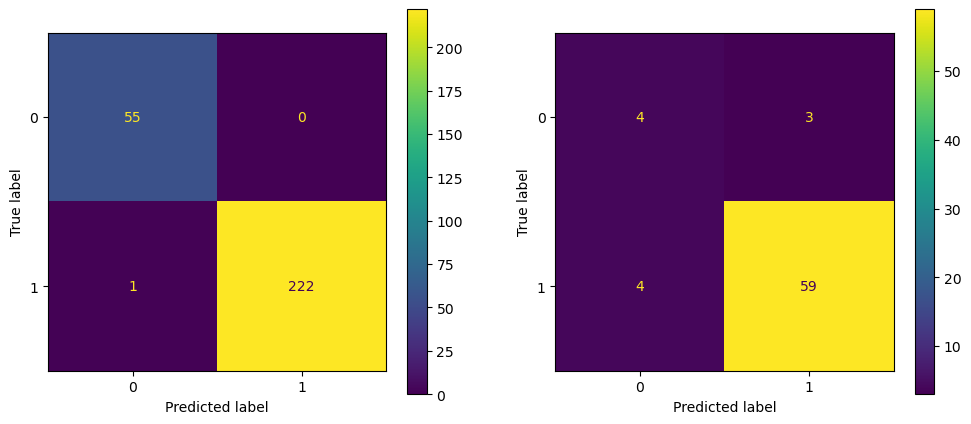

In [241]:
model_xgb_from_be_x2 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)

xgb_from_be_x2 = model_xgb_from_be_x2.fit(X2_train_spin_be_xgb, y2_train_spin)

cv_scores_xgb_from_be_x2 = cross_val_score(xgb_from_be_x2,X2_train_spin_be_xgb,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_from_be_x2 = cv_scores_xgb_from_be_x2.mean()

f1_train_xgb_from_be_x2 = f1_score(y2_train_spin,model_xgb_from_be_x2.predict(X2_train_spin_be_xgb), average='weighted')
f1_test_xgb_from_be_x2 = f1_score(y2_test_spin,model_xgb_from_be_x2.predict(X2_test_spin_be_xgb), average='weighted')
print(f1_train_xgb_from_be_x2,avg_f1_cv_xgb_from_be_x2,f1_test_xgb_from_be_x2)

fig,axes = plt.subplots(1,2,figsize=(12,5))

cm_train_xgb_from_be_x2 = confusion_matrix(y2_train_spin,xgb_from_be_x2.predict(X2_train_spin_be_xgb))
cm_test_xgb_from_be_x2 = confusion_matrix(y2_test_spin,xgb_from_be_x2.predict(X2_test_spin_be_xgb))

disp_train_xgb_from_be_x2 = ConfusionMatrixDisplay(cm_train_xgb_from_be_x2)
disp_test_xgb_from_be_x2 = ConfusionMatrixDisplay(cm_test_xgb_from_be_x2)

disp_train_xgb_from_be_x2.plot(ax=axes[0])
disp_test_xgb_from_be_x2.plot(ax=axes[1])

plt.show()

In [243]:
import optuna
import random

def objective_x2_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x2_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x2_be = model_be_x2_xgb.fit(X2_train_spin_be_xgb,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2_be = cross_val_score(xgb_spin_optuna_x2_be,X2_train_spin_be_xgb,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2_be = cv_scores_xgb_spin_optuna_x2_be.mean()

    # Return best F1 scores
    f1_train_x2_be = f1_score(y2_train_spin, model_be_x2_xgb.predict(X2_train_spin_be_xgb),average='weighted')
    f1_test_x2_be = f1_score(y2_test_spin, model_be_x2_xgb.predict(X2_test_spin_be_xgb),average='weighted')
    return f1_train_x2_be,avg_f1_cv_xgb_spin_optuna_x2_be,f1_test_x2_be
# return avg_f1_cv_et_spin_optuna_x2

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_be_x2_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_be_x2_xgb.optimize(objective_x2_be, n_trials=300)

[I 2025-03-08 18:46:54,569] A new study created in memory with name: no-name-a8f6ab7a-6f6f-4044-a192-8fbe89fe3ea5
[I 2025-03-08 18:46:57,097] Trial 0 finished with values: [0.8264893748341015, 0.7525015530972656, 0.919661733615222] and parameters: {'n_estimators': 44, 'max_depth': 43, 'learning_rate': 0.10364588259549756, 'subsample': 0.36739871915492706, 'colsample_bytree': 0.727166164467507, 'gamma': 8.055976715171822, 'reg_alpha': 0.0006785105549317966, 'reg_lambda': 0.00027824506209747375, 'min_child_weight': 2, 'scale_pos_weight': 1, 'max_delta_step': 5.892081048028622}.
[I 2025-03-08 18:46:59,450] Trial 1 finished with values: [0.8572164454432022, 0.8196271400467374, 0.8875264270613108] and parameters: {'n_estimators': 96, 'max_depth': 28, 'learning_rate': 0.14687458453121513, 'subsample': 0.5618551724359925, 'colsample_bytree': 0.22429064016732136, 'gamma': 0.9098164848548562, 'reg_alpha': 0.00011089254423098398, 'reg_lambda': 0.17003315479099063, 'min_child_weight': 6, 'scale_p

In [244]:
best_models_x2_be_xgb = study_be_x2_xgb.best_trials
for i in range(len(best_models_x2_be_xgb)):
    print('\n',i)
    print('Trial number: ', best_models_x2_be_xgb[i].number)
    print('F1 scores: ', best_models_x2_be_xgb[i].values)
    print('Parameters: ', best_models_x2_be_xgb[i].params)


 0
Trial number:  51
F1 scores:  [0.9963904007635588, 0.8286514454824501, 0.919661733615222]
Parameters:  {'n_estimators': 135, 'max_depth': 43, 'learning_rate': 0.20098831893411256, 'subsample': 0.9416595310397748, 'colsample_bytree': 0.7443587138571025, 'gamma': 0.24605783445489804, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 1.9245078351598488e-06, 'min_child_weight': 1, 'scale_pos_weight': 8, 'max_delta_step': 5.74106028660843}

 1
Trial number:  165
F1 scores:  [0.9963904007635588, 0.821250659142523, 0.9385416666666667]
Parameters:  {'n_estimators': 96, 'max_depth': 17, 'learning_rate': 0.14687458453121513, 'subsample': 0.9241084814256535, 'colsample_bytree': 0.5398023949477788, 'gamma': 0.24605783445489804, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 3.1677710690029967e-07, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 5.874632196430375}

 2
Trial number:  179
F1 scores:  [0.9964150392410033, 0.8279727555804112, 0.8919354838709677]
Parameters:  {'n_esti

In [608]:
best_models_x2_be_xgb_pd = pd.DataFrame({'Trial number': [best_models_x2_be_xgb[i].number for i in range(len(best_models_x2_be_xgb))],
                                             'Train F1': [best_models_x2_be_xgb[i].values[0] for i in range(len(best_models_x2_be_xgb))],
                                             'Test F1': [best_models_x2_be_xgb[i].values[2] for i in range(len(best_models_x2_be_xgb))],
                                             'CV F1': [best_models_x2_be_xgb[i].values[1] for i in range(len(best_models_x2_be_xgb))],
                                             'n_estimators': [best_models_x2_be_xgb[i].params['n_estimators'] for i in range(len(best_models_x2_be_xgb))],
                                             'max_depth': [best_models_x2_be_xgb[i].params['max_depth'] for i in range(len(best_models_x2_be_xgb))],
                                             'learning_rate': [best_models_x2_be_xgb[i].params['learning_rate'] for i in range(len(best_models_x2_be_xgb))],
                                             'subsample': [best_models_x2_be_xgb[i].params['subsample'] for i in range(len(best_models_x2_be_xgb))],
                                             'colsample_bytree': [best_models_x2_be_xgb[i].params['colsample_bytree'] for i in range(len(best_models_x2_be_xgb))],
                                             'gamma': [best_models_x2_be_xgb[i].params['gamma'] for i in range(len(best_models_x2_be_xgb))],
                                             'reg_alpha': [best_models_x2_be_xgb[i].params['reg_alpha'] for i in range(len(best_models_x2_be_xgb))],
                                             'reg_lambda': [best_models_x2_be_xgb[i].params['reg_lambda'] for i in range(len(best_models_x2_be_xgb))],
                                             'min_child_weight': [best_models_x2_be_xgb[i].params['min_child_weight'] for i in range(len(best_models_x2_be_xgb))],
                                             'scale_pos_weight': [best_models_x2_be_xgb[i].params['scale_pos_weight'] for i in range(len(best_models_x2_be_xgb))],
                                             'max_delta_step': [best_models_x2_be_xgb[i].params['max_delta_step'] for i in range(len(best_models_x2_be_xgb))]
                                            })
best_models_x2_be_xgb_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X2_BE_HP_Optuna.xlsx')

In [469]:
# 0
# Trial number:  51
# F1 scores:  [0.9963904007635588, 0.8286514454824501, 0.919661733615222]
# Parameters:  {'n_estimators': 135, 'max_depth': 43, 'learning_rate': 0.20098831893411256, 'subsample': 0.9416595310397748, 'colsample_bytree': 0.7443587138571025, 'gamma': 0.24605783445489804, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 1.9245078351598488e-06, 'min_child_weight': 1, 'scale_pos_weight': 8, 'max_delta_step': 5.74106028660843}

#  1
# Trial number:  165
# F1 scores:  [0.9963904007635588, 0.821250659142523, 0.9385416666666667]
# Parameters:  {'n_estimators': 96, 'max_depth': 17, 'learning_rate': 0.14687458453121513, 'subsample': 0.9241084814256535, 'colsample_bytree': 0.5398023949477788, 'gamma': 0.24605783445489804, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 3.1677710690029967e-07, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 5.874632196430375}

#  2
# Trial number:  179
# F1 scores:  [0.9964150392410033, 0.8279727555804112, 0.8919354838709677]
# Parameters:  {'n_estimators': 135, 'max_depth': 43, 'learning_rate': 0.20098831893411256, 'subsample': 0.9241084814256535, 'colsample_bytree': 0.7443587138571025, 'gamma': 0.24605783445489804, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 1.9245078351598488e-06, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 5.74106028660843}

#  3
# Trial number:  252
# F1 scores:  [0.8717694424371437, 0.8076132852483923, 0.9556632344033918]
# Parameters:  {'n_estimators': 47, 'max_depth': 30, 'learning_rate': 0.28602616140086423, 'subsample': 0.4054122276452039, 'colsample_bytree': 0.36464031916364725, 'gamma': 4.388479632310426, 'reg_alpha': 2.884101172469564e-07, 'reg_lambda': 4.3113637497213485e-07, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 6.525796339667449}

#  4
# Trial number:  253
# F1 scores:  [0.826822926731941, 0.7807278793016039, 0.9692708333333333]
# Parameters:  {'n_estimators': 113, 'max_depth': 24, 'learning_rate': 0.18575002426070775, 'subsample': 0.7031075414051545, 'colsample_bytree': 0.22128810580381053, 'gamma': 8.07704789605686, 'reg_alpha': 0.007303869041757912, 'reg_lambda': 3.1677710690029967e-07, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 2.8297054089541787}

#  5
# Trial number:  274
# F1 scores:  [0.9964150392410033, 0.8263344931927202, 0.9189516129032258]
# Parameters:  {'n_estimators': 135, 'max_depth': 43, 'learning_rate': 0.20098831893411256, 'subsample': 0.9416595310397748, 'colsample_bytree': 0.7443587138571025, 'gamma': 0.24605783445489804, 'reg_alpha': 5.2014417781355435e-06, 'reg_lambda': 1.9245078351598488e-06, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 6.126503411389539}

#  6
# Trial number:  285
# F1 scores:  [0.97436020141758, 0.8316033841215601, 0.9029333333333333]
# Parameters:  {'n_estimators': 47, 'max_depth': 28, 'learning_rate': 0.20823130951218619, 'subsample': 0.5618551724359925, 'colsample_bytree': 0.7443587138571025, 'gamma': 0.9098164848548562, 'reg_alpha': 0.00011089254423098398, 'reg_lambda': 0.17003315479099063, 'min_child_weight': 2, 'scale_pos_weight': 1, 'max_delta_step': 9.790069231387394}

#  7
# Trial number:  291
# F1 scores:  [0.9963904007635588, 0.8204850278278204, 0.9428571428571428]
# Parameters:  {'n_estimators': 79, 'max_depth': 5, 'learning_rate': 0.28602616140086423, 'subsample': 0.7031075414051545, 'colsample_bytree': 0.24761494276933105, 'gamma': 0.18859157145677985, 'reg_alpha': 0.0004957325749822106, 'reg_lambda': 6.068771287683056e-08, 'min_child_weight': 1, 'scale_pos_weight': 1, 'max_delta_step': 0.9118467768979377}

#  8
# Trial number:  299
# F1 scores:  [0.938544439386319, 0.8008882368226036, 0.9556632344033918]
# Parameters:  {'n_estimators': 47, 'max_depth': 49, 'learning_rate': 0.27449832768133803, 'subsample': 0.9241084814256535, 'colsample_bytree': 0.7443587138571025, 'gamma': 2.1299432330737336, 'reg_alpha': 0.09127189345715753, 'reg_lambda': 2.6880162509937617e-06, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 6.0270307163126695}


0.9963904007635588 0.8204850278278204 0.9428571428571428


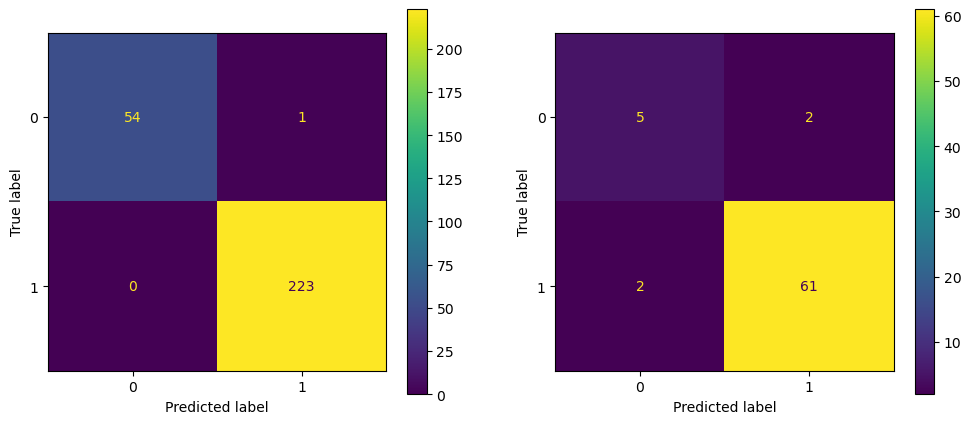

In [625]:
def detailed_objective_x2_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x2_xgb = xgb.XGBClassifier(n_estimators=best_models_x2_be_xgb[7].params['n_estimators'],
                                     max_depth=best_models_x2_be_xgb[7].params['max_depth'],
                                     learning_rate=best_models_x2_be_xgb[7].params['learning_rate'],
                                     subsample=best_models_x2_be_xgb[7].params['subsample'],
                                     colsample_bytree=best_models_x2_be_xgb[7].params['colsample_bytree'],
                                     gamma=best_models_x2_be_xgb[7].params['gamma'],
                                     reg_alpha=best_models_x2_be_xgb[7].params['reg_alpha'],
                                     reg_lambda=best_models_x2_be_xgb[7].params['reg_lambda'],
                                     min_child_weight=best_models_x2_be_xgb[7].params['min_child_weight'],
                                     scale_pos_weight=best_models_x2_be_xgb[7].params['scale_pos_weight'],
                                     max_delta_step=best_models_x2_be_xgb[7].params['max_delta_step'],
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x2_be = model_be_x2_xgb.fit(X2_train_spin_be_xgb,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2_be = cross_val_score(xgb_spin_optuna_x2_be,X2_train_spin_be_xgb,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2_be = cv_scores_xgb_spin_optuna_x2_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y2_train_spin,model_be_x2_xgb.predict(X2_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y2_test_spin,model_be_x2_xgb.predict(X2_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x2_be,f1_test_xgb_best_optuna_be)
    
    ## Exporting the results of best trial no 1,5,7(best)
    y_pred_x2_be = model_be_x2_xgb.predict(X2_mu_be_xgb)
    out_file_x2_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x2_be': y_pred_x2_be})
    out_file_x2_be.to_excel('Results_Mag_States/y_pred_X2_be_Optuna_7.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_xgb_best_optuna_be = confusion_matrix(y2_train_spin,xgb_spin_optuna_x2_be.predict(X2_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y2_test_spin,xgb_spin_optuna_x2_be.predict(X2_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x2_be(study_be_x2_xgb.best_trials[7])

0.938544439386319 0.8008882368226036 0.9556632344033918


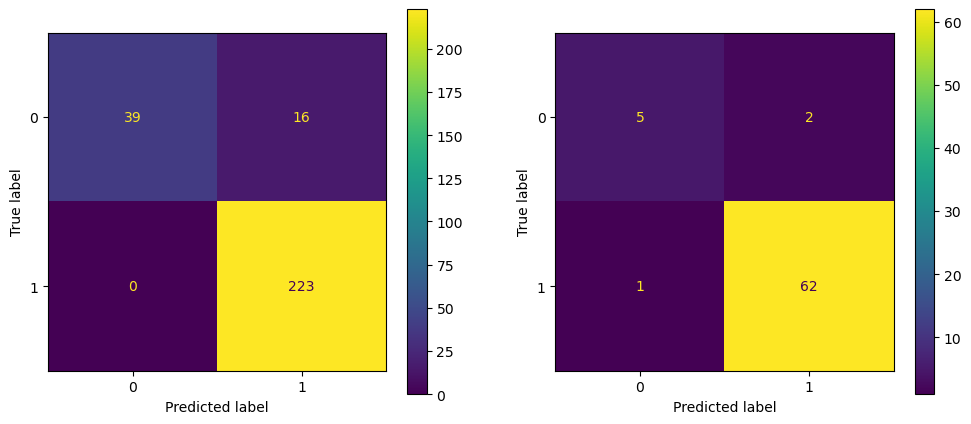

In [474]:
detailed_objective_x2_be(study_be_x2_xgb.best_trials[8])

0.9963904007635588 0.8204850278278204 0.9428571428571428


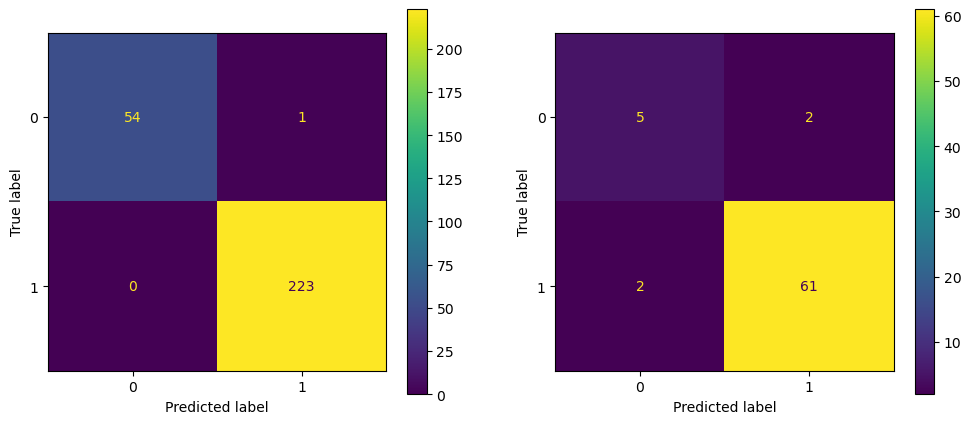

In [357]:
detailed_objective_x2_be(study_be_x2_xgb.best_trials[7])

0.9964150392410033 0.8263344931927202 0.9189516129032258


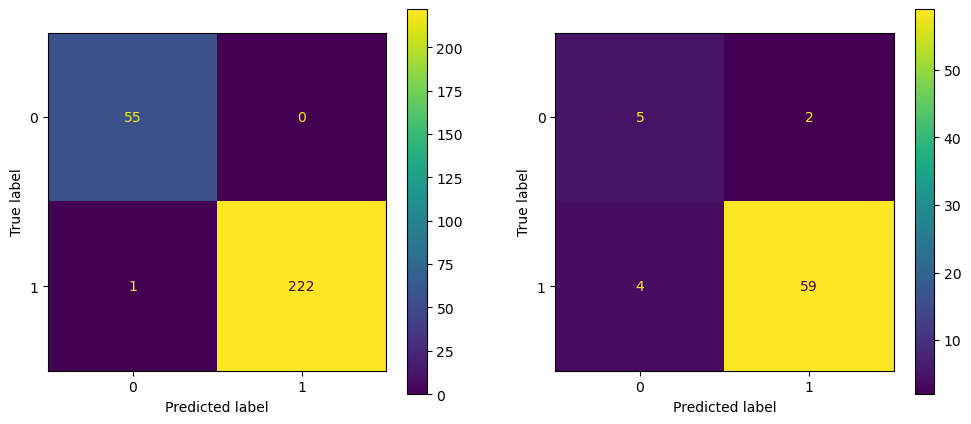

In [354]:
detailed_objective_x2_be(study_be_x2_xgb.best_trials[5])

0.9963904007635588 0.821250659142523 0.9385416666666667


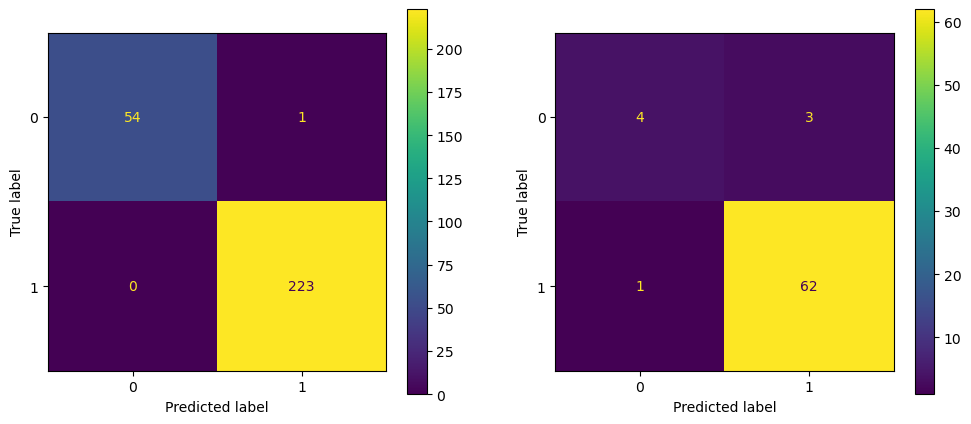

In [349]:
detailed_objective_x2_be(study_be_x2_xgb.best_trials[1])

0.9963904007635588 0.8286514454824501 0.919661733615222


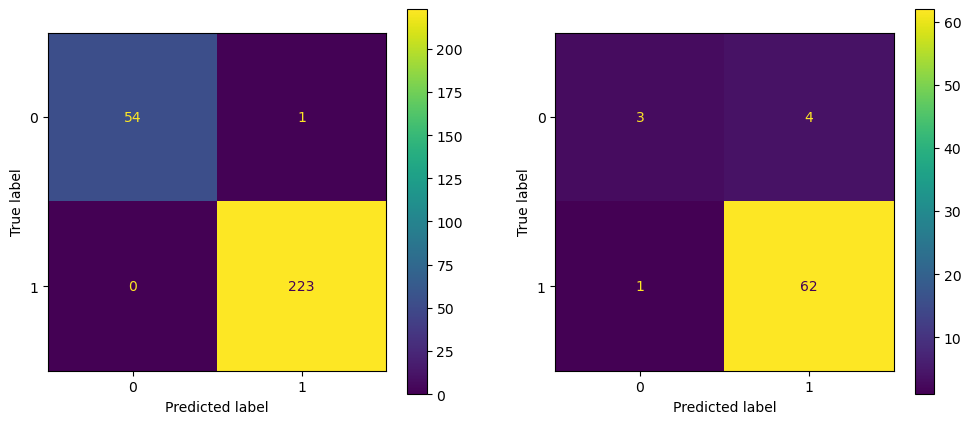

In [347]:
detailed_objective_x2_be(study_be_x2_xgb.best_trials[0])

In [248]:
## for dataset X3

In [249]:
import optuna
import random
X3_train_spin,X3_test_spin,y3_train_spin,y3_test_spin = train_test_split(X3_mu,y_spin,test_size=0.20,random_state=82)

def objective_x3(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x3_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x3 = model_x3_xgb.fit(X3_train_spin,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3 = cross_val_score(xgb_spin_optuna_x3,X3_train_spin,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3 = cv_scores_xgb_spin_optuna_x3.mean()

    # Return best F1 scores
    f1_train_x3 = f1_score(y3_train_spin, model_x3_xgb.predict(X3_train_spin))
    f1_test_x3 = f1_score(y3_test_spin, model_x3_xgb.predict(X3_test_spin))
    return f1_train_x3,avg_f1_cv_xgb_spin_optuna_x3,f1_test_x3
# return avg_f1_cv_xgb_spin_optuna_x3

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_x3_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_x3_xgb.optimize(objective_x3, n_trials=300)

[I 2025-03-08 18:48:11,141] A new study created in memory with name: no-name-e2b5f74a-0b68-459f-b322-aa40d9c14c8a
[I 2025-03-08 18:48:11,644] Trial 0 finished with values: [0.8902195608782435, 0.7148068898429372, 0.9473684210526315] and parameters: {'n_estimators': 73, 'max_depth': 43, 'learning_rate': 0.1039604827814352, 'subsample': 0.7296329536974483, 'colsample_bytree': 0.4588550165811486, 'gamma': 8.638973698857562, 'reg_alpha': 2.271945381051141e-07, 'reg_lambda': 5.913870504602583e-06, 'min_child_weight': 10, 'scale_pos_weight': 7, 'max_delta_step': 2.5198687086988834}.
[I 2025-03-08 18:48:12,159] Trial 1 finished with values: [0.9311064718162839, 0.789408708278028, 0.96875] and parameters: {'n_estimators': 64, 'max_depth': 39, 'learning_rate': 0.0927139563001101, 'subsample': 0.7425014002334388, 'colsample_bytree': 0.22771895944659487, 'gamma': 2.5117856098430535, 'reg_alpha': 1.4972390742786557e-07, 'reg_lambda': 3.477196828406614e-05, 'min_child_weight': 4, 'scale_pos_weight'

In [250]:
best_models_x3_xgb_optuna = study_x3_xgb.best_trials
best_models_x3_xgb_optuna

[FrozenTrial(number=53, state=1, values=[0.9955357142857143, 0.7807075682423059, 0.9606299212598425], datetime_start=datetime.datetime(2025, 3, 8, 18, 48, 36, 272350), datetime_complete=datetime.datetime(2025, 3, 8, 18, 48, 36, 874387), params={'n_estimators': 86, 'max_depth': 42, 'learning_rate': 0.196883857707887, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.8416532786995207, 'gamma': 0.4668833401699879, 'reg_alpha': 0.00048053478544866695, 'reg_lambda': 8.858288378953974e-08, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 6.099620897764191}, user_attrs={}, system_attrs={'nsga2:generation': 1}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=150, log=False, low=10, step=1), 'max_depth': IntDistribution(high=50, log=False, low=5, step=1), 'learning_rate': FloatDistribution(high=0.3, log=True, low=0.05, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.1, step=None), 'colsample_bytree': FloatDistribution(high=1.

In [251]:
for i in range(len(best_models_x3_xgb_optuna)):
    print('\n',i)
    print('Trial number: ', best_models_x3_xgb_optuna[i].number)
    print('F1 scores: ', best_models_x3_xgb_optuna[i].values)
    print('Parameters: ', best_models_x3_xgb_optuna[i].params)


 0
Trial number:  53
F1 scores:  [0.9955357142857143, 0.7807075682423059, 0.9606299212598425]
Parameters:  {'n_estimators': 86, 'max_depth': 42, 'learning_rate': 0.196883857707887, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.8416532786995207, 'gamma': 0.4668833401699879, 'reg_alpha': 0.00048053478544866695, 'reg_lambda': 8.858288378953974e-08, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 6.099620897764191}

 1
Trial number:  105
F1 scores:  [0.9653679653679653, 0.7993927995976707, 0.9612403100775194]
Parameters:  {'n_estimators': 136, 'max_depth': 5, 'learning_rate': 0.24618516557626172, 'subsample': 0.6401291009068701, 'colsample_bytree': 0.7467135039881069, 'gamma': 1.5229987998837813, 'reg_alpha': 0.00013776335217707285, 'reg_lambda': 0.02105649446101593, 'min_child_weight': 6, 'scale_pos_weight': 5, 'max_delta_step': 1.6590757454951044}

 2
Trial number:  187
F1 scores:  [0.9977628635346756, 0.7899218496113578, 0.9523809523809523]
Parameters:  {'n_est

In [609]:
best_models_x3_xgb_optuna_pd = pd.DataFrame({'Trial number': [best_models_x3_xgb_optuna[i].number for i in range(len(best_models_x3_xgb_optuna))],
                                             'Train F1': [best_models_x3_xgb_optuna[i].values[0] for i in range(len(best_models_x3_xgb_optuna))],
                                             'Test F1': [best_models_x3_xgb_optuna[i].values[2] for i in range(len(best_models_x3_xgb_optuna))],
                                             'CV F1': [best_models_x3_xgb_optuna[i].values[1] for i in range(len(best_models_x3_xgb_optuna))],
                                             'n_estimators': [best_models_x3_xgb_optuna[i].params['n_estimators'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'max_depth': [best_models_x3_xgb_optuna[i].params['max_depth'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'learning_rate': [best_models_x3_xgb_optuna[i].params['learning_rate'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'subsample': [best_models_x3_xgb_optuna[i].params['subsample'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'colsample_bytree': [best_models_x3_xgb_optuna[i].params['colsample_bytree'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'gamma': [best_models_x3_xgb_optuna[i].params['gamma'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'reg_alpha': [best_models_x3_xgb_optuna[i].params['reg_alpha'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'reg_lambda': [best_models_x3_xgb_optuna[i].params['reg_lambda'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'min_child_weight': [best_models_x3_xgb_optuna[i].params['min_child_weight'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'scale_pos_weight': [best_models_x3_xgb_optuna[i].params['scale_pos_weight'] for i in range(len(best_models_x3_xgb_optuna))],
                                             'max_delta_step': [best_models_x3_xgb_optuna[i].params['max_delta_step'] for i in range(len(best_models_x3_xgb_optuna))]
                                            })
best_models_x3_xgb_optuna_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X3_HP_Optuna.xlsx')

In [476]:
#  0
# Trial number:  53
# F1 scores:  [0.9955357142857143, 0.7807075682423059, 0.9606299212598425]
# Parameters:  {'n_estimators': 86, 'max_depth': 42, 'learning_rate': 0.196883857707887, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.8416532786995207, 'gamma': 0.4668833401699879, 'reg_alpha': 0.00048053478544866695, 'reg_lambda': 8.858288378953974e-08, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 6.099620897764191}

#  1
# Trial number:  105
# F1 scores:  [0.9653679653679653, 0.7993927995976707, 0.9612403100775194]
# Parameters:  {'n_estimators': 136, 'max_depth': 5, 'learning_rate': 0.24618516557626172, 'subsample': 0.6401291009068701, 'colsample_bytree': 0.7467135039881069, 'gamma': 1.5229987998837813, 'reg_alpha': 0.00013776335217707285, 'reg_lambda': 0.02105649446101593, 'min_child_weight': 6, 'scale_pos_weight': 5, 'max_delta_step': 1.6590757454951044}

#  2
# Trial number:  187
# F1 scores:  [0.9977628635346756, 0.7899218496113578, 0.9523809523809523]
# Parameters:  {'n_estimators': 103, 'max_depth': 42, 'learning_rate': 0.196883857707887, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.8416532786995207, 'gamma': 0.4668833401699879, 'reg_alpha': 2.0873503921669805e-05, 'reg_lambda': 8.858288378953974e-08, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 1.7467923245020256}

#  3
# Trial number:  190
# F1 scores:  [0.9464668094218416, 0.7827596621173739, 0.9763779527559056]
# Parameters:  {'n_estimators': 141, 'max_depth': 48, 'learning_rate': 0.14695679559528674, 'subsample': 0.9592645992204853, 'colsample_bytree': 0.8593102428280873, 'gamma': 0.6151144278662801, 'reg_alpha': 0.06878691754588522, 'reg_lambda': 0.2342669292834213, 'min_child_weight': 10, 'scale_pos_weight': 1, 'max_delta_step': 5.030667841027665}

#  4
# Trial number:  205
# F1 scores:  [0.9587852494577006, 0.7766809239098001, 0.9763779527559056]
# Parameters:  {'n_estimators': 93, 'max_depth': 49, 'learning_rate': 0.07083584875472014, 'subsample': 0.8041854717637676, 'colsample_bytree': 0.30296195355868105, 'gamma': 0.4668833401699879, 'reg_alpha': 9.778591333422371e-05, 'reg_lambda': 1.387703602858996e-08, 'min_child_weight': 5, 'scale_pos_weight': 1, 'max_delta_step': 3.315851346082276}

#  5
# Trial number:  226
# F1 scores:  [0.9208333333333333, 0.7780813235062914, 0.9767441860465116]
# Parameters:  {'n_estimators': 49, 'max_depth': 48, 'learning_rate': 0.19773853282470857, 'subsample': 0.33096104996878783, 'colsample_bytree': 0.8288850059118358, 'gamma': 1.0427629413426975, 'reg_alpha': 0.9442737877848522, 'reg_lambda': 2.6231067876822127, 'min_child_weight': 4, 'scale_pos_weight': 1, 'max_delta_step': 0.6946898097291099}

#  6
# Trial number:  247
# F1 scores:  [0.9977628635346756, 0.7719805768473812, 0.9612403100775194]
# Parameters:  {'n_estimators': 86, 'max_depth': 37, 'learning_rate': 0.196883857707887, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.8288850059118358, 'gamma': 0.4668833401699879, 'reg_alpha': 0.00048053478544866695, 'reg_lambda': 8.858288378953974e-08, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 6.099620897764191}

#  7
# Trial number:  248
# F1 scores:  [0.9955156950672646, 0.763506881448208, 0.9682539682539683]
# Parameters:  {'n_estimators': 64, 'max_depth': 42, 'learning_rate': 0.14695679559528674, 'subsample': 0.6847678640281678, 'colsample_bytree': 0.9846111041946235, 'gamma': 0.4668833401699879, 'reg_alpha': 0.00048053478544866695, 'reg_lambda': 0.0003295541924713693, 'min_child_weight': 2, 'scale_pos_weight': 1, 'max_delta_step': 6.009226926801591}

#  8
# Trial number:  264
# F1 scores:  [0.9933184855233853, 0.7978809930823119, 0.96875]
# Parameters:  {'n_estimators': 37, 'max_depth': 48, 'learning_rate': 0.14695679559528674, 'subsample': 0.9592645992204853, 'colsample_bytree': 0.30296195355868105, 'gamma': 0.4668833401699879, 'reg_alpha': 0.06878691754588522, 'reg_lambda': 0.2342669292834213, 'min_child_weight': 2, 'scale_pos_weight': 3, 'max_delta_step': 5.030667841027665}

#  9
# Trial number:  293
# F1 scores:  [0.9350104821802935, 0.8072288029557366, 0.96875]
# Parameters:  {'n_estimators': 141, 'max_depth': 48, 'learning_rate': 0.14695679559528674, 'subsample': 0.9088564615872807, 'colsample_bytree': 0.4425316435590031, 'gamma': 0.6151144278662801, 'reg_alpha': 1.2922267845546867e-05, 'reg_lambda': 0.11658445316487119, 'min_child_weight': 10, 'scale_pos_weight': 2, 'max_delta_step': 0.9588222419045389}

0.9933184855233853 0.7978809930823119 0.96875


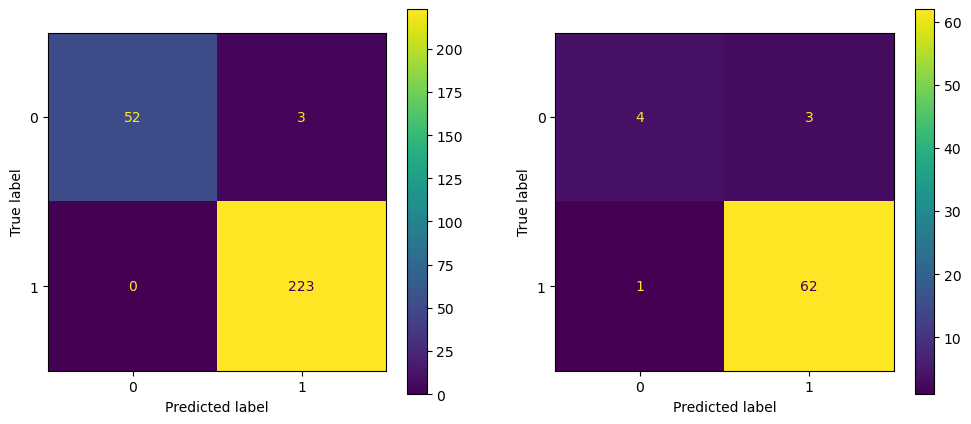

In [480]:
def detailed_objective_x3(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x3_xgb = xgb.XGBClassifier(n_estimators=best_models_x3_xgb_optuna[8].params['n_estimators'],
                                     max_depth=best_models_x3_xgb_optuna[8].params['max_depth'],
                                     learning_rate=best_models_x3_xgb_optuna[8].params['learning_rate'],
                                     subsample=best_models_x3_xgb_optuna[8].params['subsample'],
                                     colsample_bytree=best_models_x3_xgb_optuna[8].params['colsample_bytree'],
                                     gamma=best_models_x3_xgb_optuna[8].params['gamma'],
                                     reg_alpha=best_models_x3_xgb_optuna[8].params['reg_alpha'],
                                     reg_lambda=best_models_x3_xgb_optuna[8].params['reg_lambda'],
                                     min_child_weight=best_models_x3_xgb_optuna[8].params['min_child_weight'],
                                     scale_pos_weight=best_models_x3_xgb_optuna[8].params['scale_pos_weight'],
                                     max_delta_step=best_models_x3_xgb_optuna[8].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x3 = model_x3_xgb.fit(X3_train_spin,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3 = cross_val_score(xgb_spin_optuna_x3,X3_train_spin,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3 = cv_scores_xgb_spin_optuna_x3.mean()

    f1_train_x3_optuna = f1_score(y3_train_spin, model_x3_xgb.predict(X3_train_spin))
    f1_test_x3_optuna = f1_score(y3_test_spin, model_x3_xgb.predict(X3_test_spin))

    f1_train_best_optuna_x3 = f1_score(y3_train_spin,model_x3_xgb.predict(X3_train_spin))
    f1_test_best_optuna_x3 = f1_score(y3_test_spin,model_x3_xgb.predict(X3_test_spin))
    print(f1_train_best_optuna_x3,avg_f1_cv_xgb_spin_optuna_x3,f1_test_best_optuna_x3)

    ## Exporting the results of best trial no 0,2,7(best),8
    y_pred_x3 = model_x3_xgb.predict(X3_mu)
    out_file_x3 = pd.DataFrame({'y_true': y_spin, 'y_pred_x3': y_pred_x3})
    out_file_x3.to_excel('Results_Mag_States/y_pred_X3_Optuna_8.xlsx',index=False)    
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x3 = confusion_matrix(y3_train_spin,xgb_spin_optuna_x3.predict(X3_train_spin))
    cm_test_best_optuna_x3 = confusion_matrix(y3_test_spin,xgb_spin_optuna_x3.predict(X3_test_spin))
    
    disp_train_best_optuna_x3 = ConfusionMatrixDisplay(cm_train_best_optuna_x3)
    disp_test_best_optuna_x3 = ConfusionMatrixDisplay(cm_test_best_optuna_x3)
    
    disp_train_best_optuna_x3.plot(ax=axes[0])
    disp_test_best_optuna_x3.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x3(study_x3_xgb.best_trials[8])

0.9955156950672646 0.763506881448208 0.9682539682539683


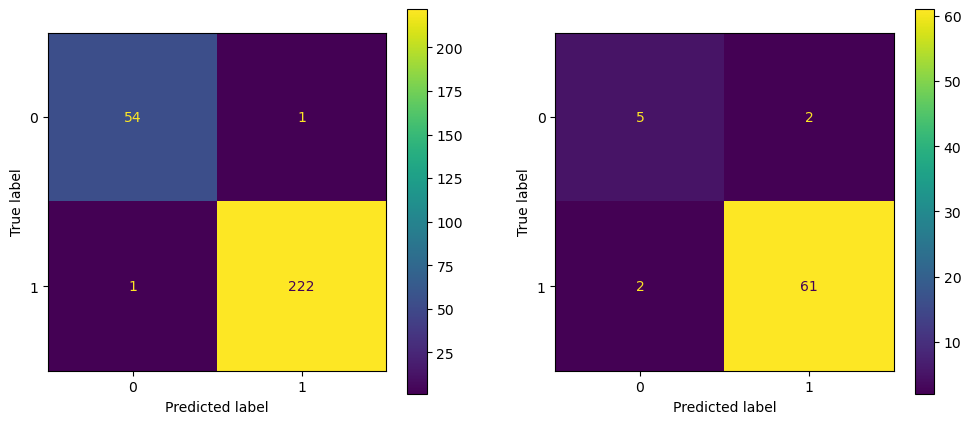

In [372]:
detailed_objective_x3(study_x3_xgb.best_trials[7])

0.9977628635346756 0.7719805768473812 0.9612403100775194


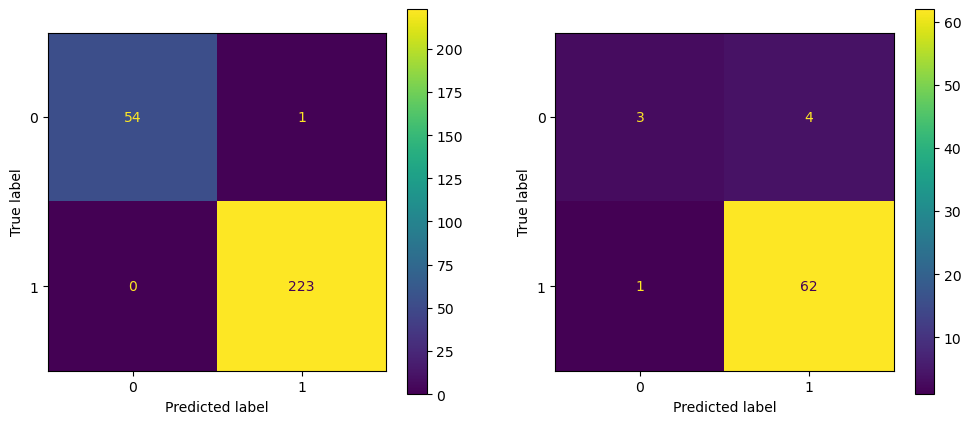

In [370]:
detailed_objective_x3(study_x3_xgb.best_trials[6])

0.9587852494577006 0.7766809239098001 0.9763779527559056


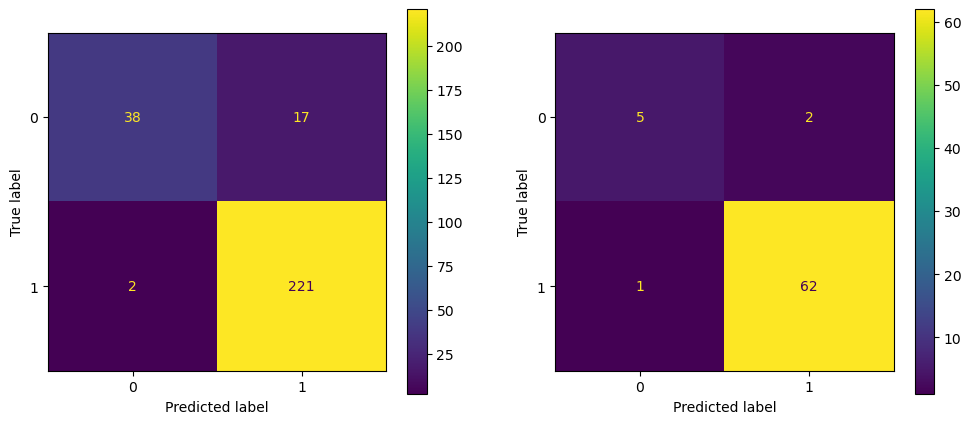

In [367]:
detailed_objective_x3(study_x3_xgb.best_trials[4])

0.9977628635346756 0.7899218496113578 0.9523809523809523


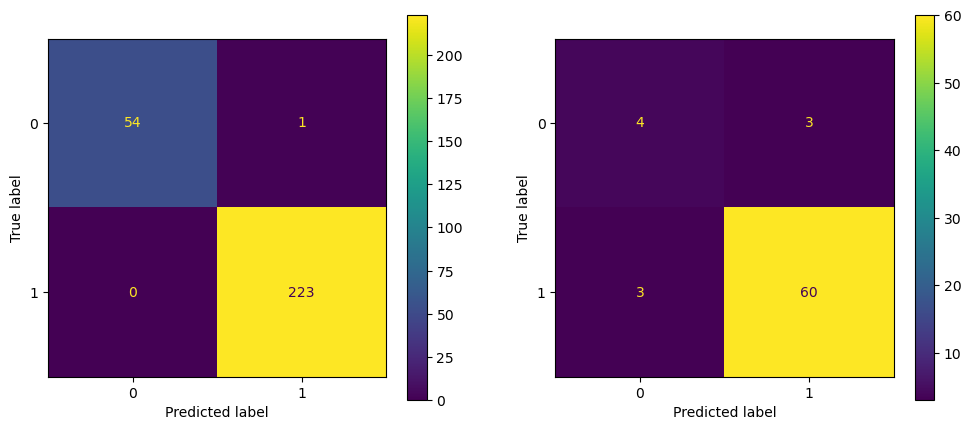

In [364]:
detailed_objective_x3(study_x3_xgb.best_trials[2])

0.9955357142857143 0.7807075682423059 0.9606299212598425


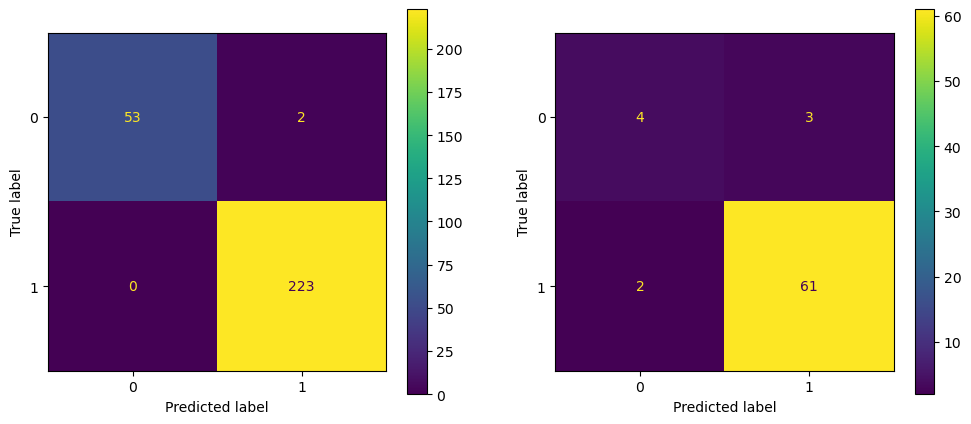

In [253]:
detailed_objective_x3(study_x3_xgb.best_trials[0])

In [254]:
X3_train_spin,X3_test_spin,y3_train_spin,y3_test_spin = train_test_split(X3_mu,y_spin,test_size=0.20,random_state=82)
xgb_spin_be_x3 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)
n_features = X3_train_spin.shape[1]

xgb_spin_sfs_x3 = sfs(xgb_spin_be_x3,forward=False,k_features=(1,n_features),scoring='f1_weighted',cv=cv,verbose=2,n_jobs=-1)

xgb_spin_sfs_x3 = xgb_spin_sfs_x3.fit(X3_train_spin, y3_train_spin)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 199 out of 199 | elapsed:   14.6s finished

[2025-03-08 18:50:55] Features: 198/1 -- score: 0.7931950012583329[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 198 out of 198 | elapsed:   14.3s finished

[2025-03-08 18:51:10] Features: 197/1 -- score: 0.8039838672083857[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 197 out of 197 | elapsed:   14.1s finished

[2025-03-08 18:51:24] Features: 196/1 -- score: 0

In [255]:
xgb_spin_sfs_x3.get_metric_dict()

{199: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   52,
   53,
   54,
   55,
   56,
   57,
   58,
   59,
   60,
   61,
   62,
   63,
   64,
   65,
   66,
   67,
   68,
   69,
   70,
   71,
   72,
   73,
   74,
   75,
   76,
   77,
   78,
   79,
   80,
   81,
   82,
   83,
   84,
   85,
   86,
   87,
   88,
   89,
   90,
   91,
   92,
   93,
   94,
   95,
   96,
   97,
   98,
   99,
   100,
   101,
   102,
   103,
   104,
   105,
   106,
   107,
   108,
   109,
   110,
   111,
   112,
   113,
   114,
   115,
   116,
   117,
   118,
   119,
   120,
   121,
   122,
   123,
   124,
   125,
   126,
   127,
   128,
   129,
   130,
   131,
   132,
   133,
   134,
   135,
  

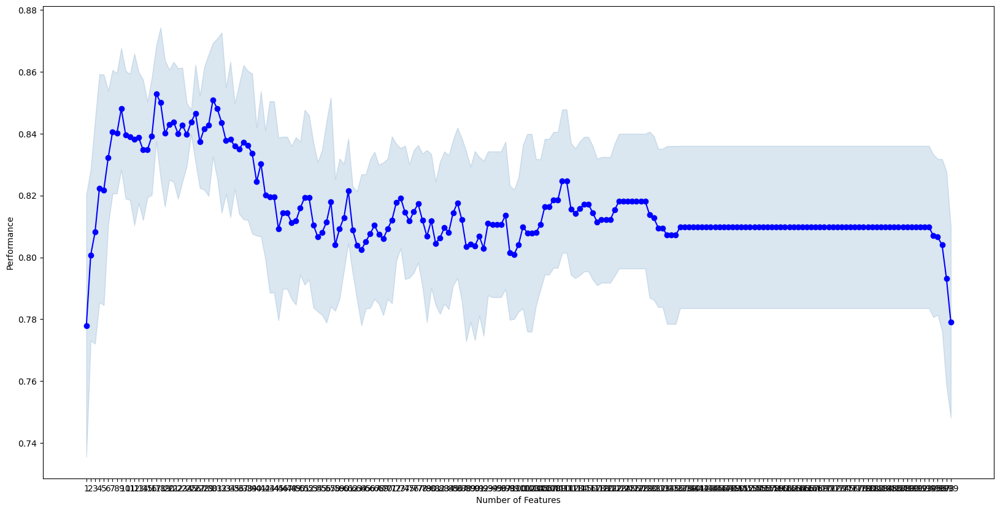

In [256]:
fig = plot_sfs(xgb_spin_sfs_x3.get_metric_dict(),kind='std_err',figsize=(20,10))
plt.show()

In [257]:
xgb_spin_sfs_x3.k_feature_idx_

(16, 18, 33, 48, 49, 57, 88, 98, 108, 109, 111, 113, 158, 165, 167, 168, 189)

In [258]:
print(xgb_spin_sfs_x3.k_feature_names_)
print(len(xgb_spin_sfs_x3.k_feature_names_))

('delta_a12x18_avg_covalent_radius', 'delta_a12b14_avg_covalent_radius', 'delta_a12b58_avg_atomic_radius', 'max_diff_atomic_volume', 'std_dipole_polarizability', 'delta_a12b14_avg_dipole_polarizability', 'max_diff_unp_electrons', 'delta_a12x18_avg_no_electrons', 'delta_a12b58_avg_electronegativity', 'delta_bx1418bx58914_avg_electronegativity', 'avg_electron_affinity', 'avg_bx_electron_affinity', 'std_mendeleev_number', 'delta_a12b14_avg_mendeleev_number', 'delta_bx1418bx58914_avg_mendeleev_number', 'delta_a1a2_mendeleev_number', 'delta_a12x18_avg_heat_of_formation')
17


In [259]:
X3_mu_be_xgb = X3_mu[[i for i in xgb_spin_sfs_x3.k_feature_names_]]
X3_train_spin_be_xgb = X3_train_spin[[i for i in xgb_spin_sfs_x3.k_feature_names_]]
X3_test_spin_be_xgb = X3_test_spin[[i for i in xgb_spin_sfs_x3.k_feature_names_]]

In [260]:
def find_extra_element(tuple1,tuple2):
    set1 = set(tuple1)
    set2 = set(tuple2)
    
    extra_element = (set1 - set2).pop()
    return extra_element

for i in range(len(xgb_spin_sfs_x3.get_metric_dict())):
    j = i+1
    if j==X3_mu.shape[1]:
        eliminated_feature_index = 'None'
        eliminated_feature = 'None'
    else:
        eliminated_feature_index = find_extra_element(xgb_spin_sfs_x3.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x3.get_metric_dict()[j]['feature_idx'])
        eliminated_feature = X3_mu.columns[eliminated_feature_index]
    print(j,eliminated_feature_index,eliminated_feature,xgb_spin_sfs_x3.get_metric_dict()[j]['avg_score'],xgb_spin_sfs_x3.get_metric_dict()[j]['ci_bound'],xgb_spin_sfs_x3.get_metric_dict()[j]['std_dev'],xgb_spin_sfs_x3.get_metric_dict()[j]['std_err'])

1 33 delta_a12b58_avg_atomic_radius 0.7778888670694407 0.10892315846394113 0.0847459177948938 0.0423729588974469
2 165 delta_a12b14_avg_mendeleev_number 0.8007015704282907 0.07106584405024799 0.055291641032433086 0.027645820516216543
3 167 delta_bx1418bx58914_avg_mendeleev_number 0.8081992661836928 0.092828488723297 0.0722237179430769 0.03611185897153845
4 168 delta_a1a2_mendeleev_number 0.8223457642049666 0.09471336473596972 0.07369021551692764 0.03684510775846382
5 111 avg_electron_affinity 0.8218039036986406 0.09582921514260771 0.07455838504272823 0.037279192521364114
6 189 delta_a12x18_avg_heat_of_formation 0.8321261492187944 0.05603391914234372 0.04359629276573741 0.021798146382868706
7 108 delta_a12b58_avg_electronegativity 0.8405223436587651 0.05142816509987477 0.040012859646730056 0.020006429823365028
8 49 std_dipole_polarizability 0.8400926653233798 0.04989458445105722 0.038819681800720776 0.019409840900360388
9 16 delta_a12x18_avg_covalent_radius 0.848009630223773 0.050438748

In [261]:
iteration_be_xgb_x3 = []
eliminated_feature_index_be_xgb_x3 = []
eliminated_feature_be_xgb_x3 = []
avg_cv_F1_score_be_xgb_x3 = []
ci_bound_be_xgb_x3 = []
std_dev_be_xgb_x3 = []
std_err_be_xgb_x3 = []

for i in range(len(xgb_spin_sfs_x3.get_metric_dict())):
    j = i+1
    iteration_be_xgb_x3.append(j)
    if j==X3_mu.shape[1]:
        eliminated_feature_index_be_xgb_x3.append('None')
        eliminated_feature_be_xgb_x3.append('None')
    else:
        elim_feat_index_for_feat_be_xgb_x3 = find_extra_element(xgb_spin_sfs_x3.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x3.get_metric_dict()[j]['feature_idx'])
        eliminated_feature_index_be_xgb_x3.append(elim_feat_index_for_feat_be_xgb_x3)
        eliminated_feature_be_xgb_x3.append(X3_mu.columns[elim_feat_index_for_feat_be_xgb_x3])

    avg_cv_F1_score_be_xgb_x3.append(xgb_spin_sfs_x3.get_metric_dict()[j]['avg_score'])
    ci_bound_be_xgb_x3.append(xgb_spin_sfs_x3.get_metric_dict()[j]['ci_bound'])
    std_dev_be_xgb_x3.append(xgb_spin_sfs_x3.get_metric_dict()[j]['std_dev'])
    std_err_be_xgb_x3.append(xgb_spin_sfs_x3.get_metric_dict()[j]['std_err'])

In [262]:
training_history_be_xgb_x3 = pd.DataFrame({
    'iteration':iteration_be_xgb_x3,
    'eliminated_feature_index': eliminated_feature_index_be_xgb_x3,
    'eliminated_feature': eliminated_feature_be_xgb_x3,
    'avg_cv_F1_score': avg_cv_F1_score_be_xgb_x3,
    'ci_bound_be': ci_bound_be_xgb_x3,
    'std_dev_be': std_dev_be_xgb_x3,
    'std_err_be': std_err_be_xgb_x3
})

training_history_be_xgb_x3.to_csv('Results_Mag_States/XGB_X3_training_history.csv',index=False)

0.9963904007635588 0.8529026228331542 0.8649193548387096


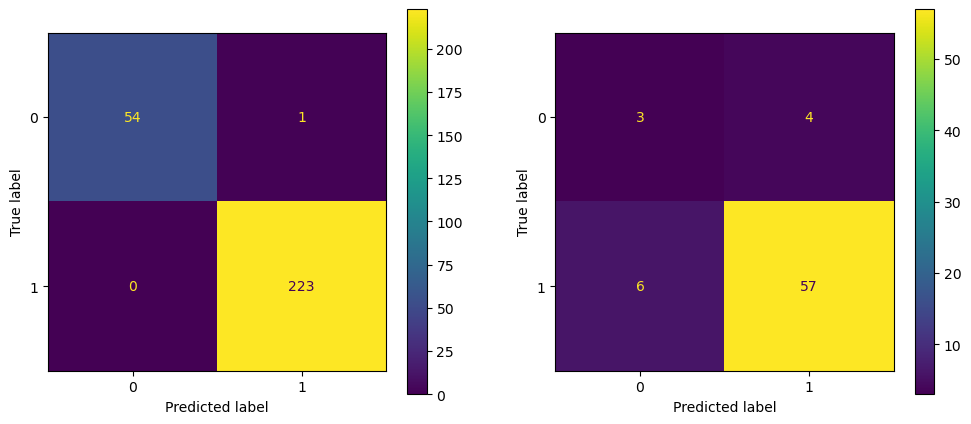

In [263]:
model_xgb_from_be_x3 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)

xgb_from_be_x3 = model_xgb_from_be_x3.fit(X3_train_spin_be_xgb, y3_train_spin)

cv_scores_xgb_from_be_x3 = cross_val_score(xgb_from_be_x3,X3_train_spin_be_xgb,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_from_be_x3 = cv_scores_xgb_from_be_x3.mean()

f1_train_xgb_from_be_x3 = f1_score(y3_train_spin,model_xgb_from_be_x3.predict(X3_train_spin_be_xgb), average='weighted')
f1_test_xgb_from_be_x3 = f1_score(y3_test_spin,model_xgb_from_be_x3.predict(X3_test_spin_be_xgb), average='weighted')
print(f1_train_xgb_from_be_x3,avg_f1_cv_xgb_from_be_x3,f1_test_xgb_from_be_x3)

fig,axes = plt.subplots(1,2,figsize=(12,5))

cm_train_xgb_from_be_x3 = confusion_matrix(y3_train_spin,xgb_from_be_x3.predict(X3_train_spin_be_xgb))
cm_test_xgb_from_be_x3 = confusion_matrix(y3_test_spin,xgb_from_be_x3.predict(X3_test_spin_be_xgb))

disp_train_xgb_from_be_x3 = ConfusionMatrixDisplay(cm_train_xgb_from_be_x3)
disp_test_xgb_from_be_x3 = ConfusionMatrixDisplay(cm_test_xgb_from_be_x3)

disp_train_xgb_from_be_x3.plot(ax=axes[0])
disp_test_xgb_from_be_x3.plot(ax=axes[1])

plt.show()

In [264]:
import optuna
import random

def objective_x3_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x3_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x3_be = model_be_x3_xgb.fit(X3_train_spin_be_xgb,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3_be = cross_val_score(xgb_spin_optuna_x3_be,X3_train_spin_be_xgb,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3_be = cv_scores_xgb_spin_optuna_x3_be.mean()

    # Return best F1 scores
    f1_train_x3_be = f1_score(y3_train_spin, model_be_x3_xgb.predict(X3_train_spin_be_xgb),average='weighted')
    f1_test_x3_be = f1_score(y3_test_spin, model_be_x3_xgb.predict(X3_test_spin_be_xgb),average='weighted')
    return f1_train_x3_be,avg_f1_cv_xgb_spin_optuna_x3_be,f1_test_x3_be
# return avg_f1_cv_et_spin_optunax3

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_be_x3_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_be_x3_xgb.optimize(objective_x3_be, n_trials=300)

[I 2025-03-08 19:13:37,945] A new study created in memory with name: no-name-27ea6ffd-8ef9-476c-be6c-ffb444b2295c
[I 2025-03-08 19:13:38,026] Trial 0 finished with values: [0.7444399319254275, 0.7203606074893204, 0.8454545454545456] and parameters: {'n_estimators': 28, 'max_depth': 45, 'learning_rate': 0.11982198924678152, 'subsample': 0.6493629034159649, 'colsample_bytree': 0.5642036911045313, 'gamma': 1.2971443553379336, 'reg_alpha': 4.9010085653741166e-05, 'reg_lambda': 7.225670319253714e-07, 'min_child_weight': 10, 'scale_pos_weight': 1, 'max_delta_step': 2.5874860745009833}.
[I 2025-03-08 19:13:38,139] Trial 1 finished with values: [0.7140969858843463, 0.7148068898429372, 0.8526315789473684] and parameters: {'n_estimators': 116, 'max_depth': 39, 'learning_rate': 0.27426437511259255, 'subsample': 0.11245014732494678, 'colsample_bytree': 0.8629491890089487, 'gamma': 1.944490451754064, 'reg_alpha': 6.024921901480597e-06, 'reg_lambda': 7.424100385625612, 'min_child_weight': 2, 'scale_

In [265]:
best_models_x3_be_xgb = study_be_x3_xgb.best_trials
for i in range(len(best_models_x3_be_xgb)):
    print('\n',i)
    print('Trial number: ', best_models_x3_be_xgb[i].number)
    print('F1 scores: ', best_models_x3_be_xgb[i].values)
    print('Parameters: ', best_models_x3_be_xgb[i].params)


 0
Trial number:  139
F1 scores:  [0.9963904007635588, 0.8287199606149545, 0.9142857142857143]
Parameters:  {'n_estimators': 140, 'max_depth': 29, 'learning_rate': 0.1573383749855815, 'subsample': 0.7393522756840204, 'colsample_bytree': 0.9633842390747858, 'gamma': 0.6448282340889844, 'reg_alpha': 0.01278881687525765, 'reg_lambda': 1.2670066885699921e-05, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 7.775274757636406}

 1
Trial number:  190
F1 scores:  [0.9854039787038296, 0.784981812469637, 0.9261053906723197]
Parameters:  {'n_estimators': 59, 'max_depth': 23, 'learning_rate': 0.20356776839117824, 'subsample': 0.5368265905615127, 'colsample_bytree': 0.365357720637708, 'gamma': 0.654739308362775, 'reg_alpha': 0.0004091359443643619, 'reg_lambda': 0.31470046013651654, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 3.4797376580396}

 2
Trial number:  202
F1 scores:  [0.9963904007635588, 0.8309297402105283, 0.9078125]
Parameters:  {'n_estimators': 103, 

In [610]:
best_models_x3_be_xgb_pd = pd.DataFrame({'Trial number': [best_models_x3_be_xgb[i].number for i in range(len(best_models_x3_be_xgb))],
                                             'Train F1': [best_models_x3_be_xgb[i].values[0] for i in range(len(best_models_x3_be_xgb))],
                                             'Test F1': [best_models_x3_be_xgb[i].values[2] for i in range(len(best_models_x3_be_xgb))],
                                             'CV F1': [best_models_x3_be_xgb[i].values[1] for i in range(len(best_models_x3_be_xgb))],
                                             'n_estimators': [best_models_x3_be_xgb[i].params['n_estimators'] for i in range(len(best_models_x3_be_xgb))],
                                             'max_depth': [best_models_x3_be_xgb[i].params['max_depth'] for i in range(len(best_models_x3_be_xgb))],
                                             'learning_rate': [best_models_x3_be_xgb[i].params['learning_rate'] for i in range(len(best_models_x3_be_xgb))],
                                             'subsample': [best_models_x3_be_xgb[i].params['subsample'] for i in range(len(best_models_x3_be_xgb))],
                                             'colsample_bytree': [best_models_x3_be_xgb[i].params['colsample_bytree'] for i in range(len(best_models_x3_be_xgb))],
                                             'gamma': [best_models_x3_be_xgb[i].params['gamma'] for i in range(len(best_models_x3_be_xgb))],
                                             'reg_alpha': [best_models_x3_be_xgb[i].params['reg_alpha'] for i in range(len(best_models_x3_be_xgb))],
                                             'reg_lambda': [best_models_x3_be_xgb[i].params['reg_lambda'] for i in range(len(best_models_x3_be_xgb))],
                                             'min_child_weight': [best_models_x3_be_xgb[i].params['min_child_weight'] for i in range(len(best_models_x3_be_xgb))],
                                             'scale_pos_weight': [best_models_x3_be_xgb[i].params['scale_pos_weight'] for i in range(len(best_models_x3_be_xgb))],
                                             'max_delta_step': [best_models_x3_be_xgb[i].params['max_delta_step'] for i in range(len(best_models_x3_be_xgb))]
                                            })
best_models_x3_be_xgb_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X3_BE_HP_Optuna.xlsx')

In [481]:
#  0
# Trial number:  139
# F1 scores:  [0.9963904007635588, 0.8287199606149545, 0.9142857142857143]
# Parameters:  {'n_estimators': 140, 'max_depth': 29, 'learning_rate': 0.1573383749855815, 'subsample': 0.7393522756840204, 'colsample_bytree': 0.9633842390747858, 'gamma': 0.6448282340889844, 'reg_alpha': 0.01278881687525765, 'reg_lambda': 1.2670066885699921e-05, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 7.775274757636406}

#  1
# Trial number:  190
# F1 scores:  [0.9854039787038296, 0.784981812469637, 0.9261053906723197]
# Parameters:  {'n_estimators': 59, 'max_depth': 23, 'learning_rate': 0.20356776839117824, 'subsample': 0.5368265905615127, 'colsample_bytree': 0.365357720637708, 'gamma': 0.654739308362775, 'reg_alpha': 0.0004091359443643619, 'reg_lambda': 0.31470046013651654, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 3.4797376580396}

#  2
# Trial number:  202
# F1 scores:  [0.9963904007635588, 0.8309297402105283, 0.9078125]
# Parameters:  {'n_estimators': 103, 'max_depth': 38, 'learning_rate': 0.20356776839117824, 'subsample': 0.5368265905615127, 'colsample_bytree': 0.9707366915596523, 'gamma': 0.5406829040326566, 'reg_alpha': 0.0001223487260681161, 'reg_lambda': 6.029055890954631e-07, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 7.775274757636406}

#  3
# Trial number:  206
# F1 scores:  [0.9963904007635588, 0.8235330954782766, 0.919661733615222]
# Parameters:  {'n_estimators': 79, 'max_depth': 15, 'learning_rate': 0.11416698778553251, 'subsample': 0.7084559135602775, 'colsample_bytree': 0.8341709876773483, 'gamma': 0.5406829040326566, 'reg_alpha': 3.0934509381613006e-05, 'reg_lambda': 6.029055890954631e-07, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 3.5089096582960977}

#  4
# Trial number:  211
# F1 scores:  [0.9779379355603333, 0.7968532822382313, 0.9385416666666667]
# Parameters:  {'n_estimators': 31, 'max_depth': 15, 'learning_rate': 0.2114204844850421, 'subsample': 0.5644691646038913, 'colsample_bytree': 0.7037016950483324, 'gamma': 0.8578307066840685, 'reg_alpha': 3.0934509381613006e-05, 'reg_lambda': 6.029055890954631e-07, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 4.6375947754058515}

#  5
# Trial number:  288
# F1 scores:  [0.9703480542852579, 0.8107330833655528, 0.9385416666666667]
# Parameters:  {'n_estimators': 103, 'max_depth': 5, 'learning_rate': 0.10761310746311198, 'subsample': 0.5368265905615127, 'colsample_bytree': 0.5553078604491397, 'gamma': 1.774955361863907, 'reg_alpha': 1.1889875460047191e-06, 'reg_lambda': 6.029055890954631e-07, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 6.1450650317275235}

0.9703480542852579 0.8107330833655528 0.9385416666666667


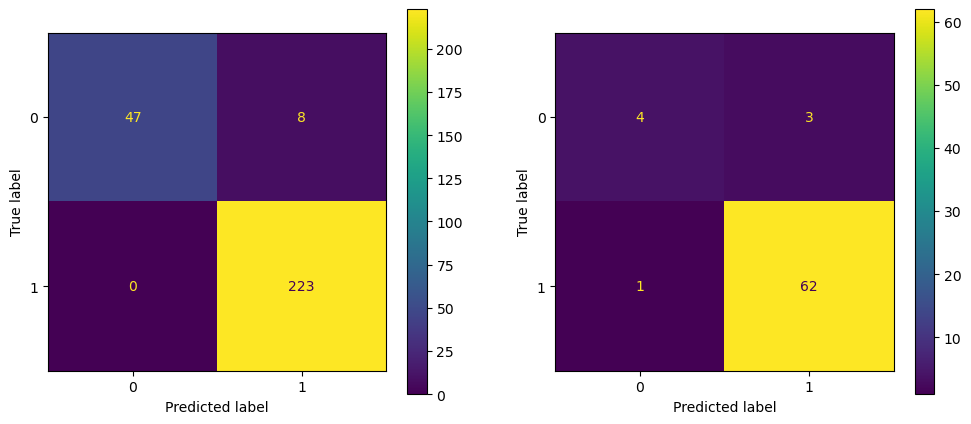

In [485]:
def detailed_objective_x3_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x3_xgb = xgb.XGBClassifier(n_estimators=best_models_x3_be_xgb[5].params['n_estimators'],
                                     max_depth=best_models_x3_be_xgb[5].params['max_depth'],
                                     learning_rate=best_models_x3_be_xgb[5].params['learning_rate'],
                                     subsample=best_models_x3_be_xgb[5].params['subsample'],
                                     colsample_bytree=best_models_x3_be_xgb[5].params['colsample_bytree'],
                                     gamma=best_models_x3_be_xgb[5].params['gamma'],
                                     reg_alpha=best_models_x3_be_xgb[5].params['reg_alpha'],
                                     reg_lambda=best_models_x3_be_xgb[5].params['reg_lambda'],
                                     min_child_weight=best_models_x3_be_xgb[5].params['min_child_weight'],
                                     scale_pos_weight=best_models_x3_be_xgb[5].params['scale_pos_weight'],
                                     max_delta_step=best_models_x3_be_xgb[5].params['max_delta_step'],
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x3_be = model_be_x3_xgb.fit(X3_train_spin_be_xgb,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3_be = cross_val_score(xgb_spin_optuna_x3_be,X3_train_spin_be_xgb,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3_be = cv_scores_xgb_spin_optuna_x3_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y3_train_spin,model_be_x3_xgb.predict(X3_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y3_test_spin,model_be_x3_xgb.predict(X3_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x3_be,f1_test_xgb_best_optuna_be)
    
    ## Exporting the results of best trial no 0,1,4,5( no best)
    y_pred_x3_be = model_be_x3_xgb.predict(X3_mu_be_xgb)
    out_file_x3_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x3_be': y_pred_x3_be})
    out_file_x3_be.to_excel('Results_Mag_States/y_pred_X3_be_Optuna_5.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_xgb_best_optuna_be = confusion_matrix(y3_train_spin,xgb_spin_optuna_x3_be.predict(X3_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y3_test_spin,xgb_spin_optuna_x3_be.predict(X3_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x3_be(study_be_x3_xgb.best_trials[5])

0.9779379355603333 0.7968532822382313 0.9385416666666667


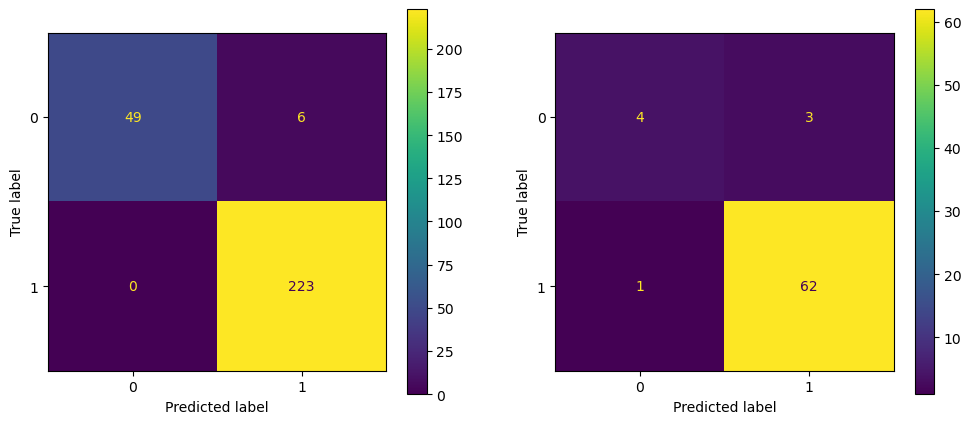

In [385]:
detailed_objective_x3_be(study_be_x3_xgb.best_trials[4])

0.9963904007635588 0.8235330954782766 0.919661733615222


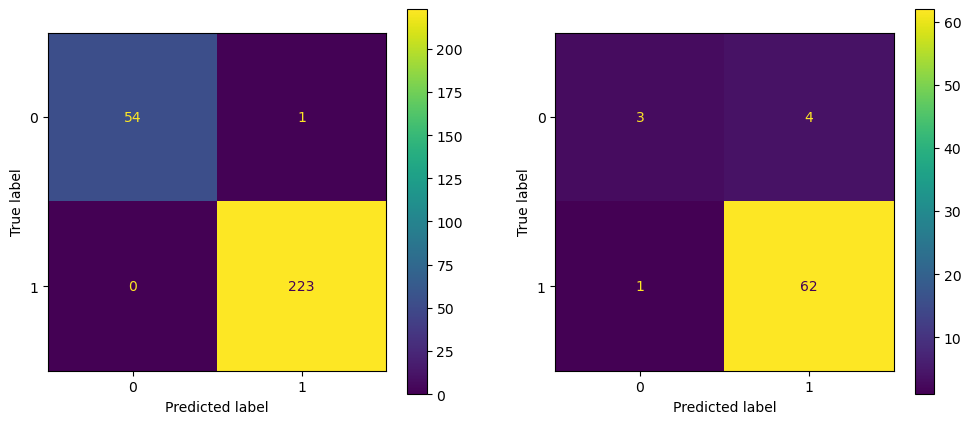

In [383]:
detailed_objective_x3_be(study_be_x3_xgb.best_trials[3])

0.9854039787038296 0.784981812469637 0.9261053906723197


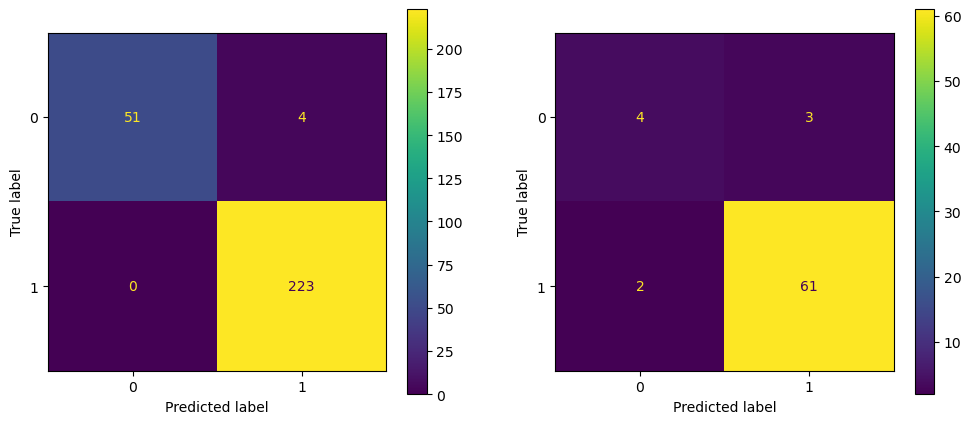

In [380]:
detailed_objective_x3_be(study_be_x3_xgb.best_trials[1])

0.9963904007635588 0.8287199606149545 0.9142857142857143


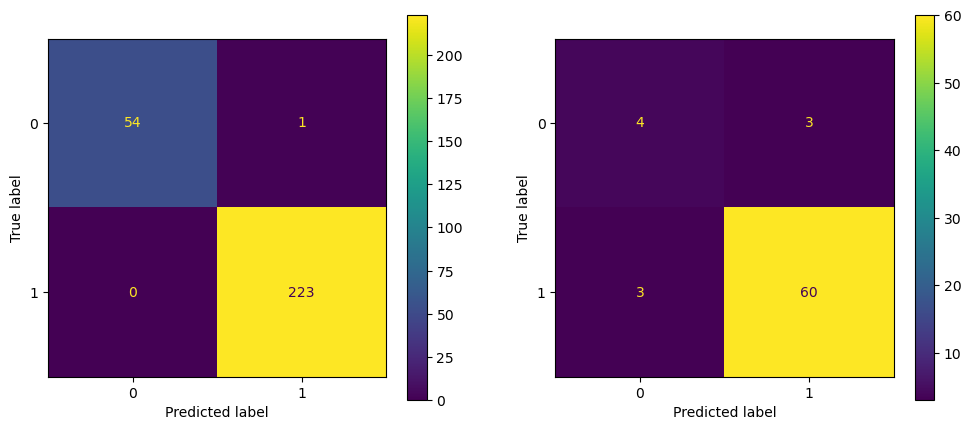

In [268]:
detailed_objective_x3_be(study_be_x3_xgb.best_trials[0])

In [269]:
## for dataset X4

In [270]:
import optuna
import random
X4_train_spin,X4_test_spin,y4_train_spin,y4_test_spin = train_test_split(X4_mu,y_spin,test_size=0.20,random_state=82)

def objective_x4(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x4_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x4 = model_x4_xgb.fit(X4_train_spin,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4 = cross_val_score(xgb_spin_optuna_x4,X4_train_spin,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4 = cv_scores_xgb_spin_optuna_x4.mean()

    # Return best F1 scores
    f1_train_x4 = f1_score(y4_train_spin, model_x4_xgb.predict(X4_train_spin))
    f1_test_x4 = f1_score(y4_test_spin, model_x4_xgb.predict(X4_test_spin))
    return f1_train_x4,avg_f1_cv_xgb_spin_optuna_x4,f1_test_x4
# return avg_f1_cv_xgb_spin_optuna_x4

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_x4_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_x4_xgb.optimize(objective_x4, n_trials=300)

[I 2025-03-08 19:24:24,459] A new study created in memory with name: no-name-745c599a-4326-4e6e-8135-25f2527ca7aa
[I 2025-03-08 19:24:27,270] Trial 0 finished with values: [0.9120654396728016, 0.7228760167556285, 0.9545454545454546] and parameters: {'n_estimators': 133, 'max_depth': 38, 'learning_rate': 0.15123404367027857, 'subsample': 0.8847839883845696, 'colsample_bytree': 0.851954988606506, 'gamma': 9.012779717784039, 'reg_alpha': 0.38452637855688687, 'reg_lambda': 9.230527290845855e-06, 'min_child_weight': 8, 'scale_pos_weight': 2, 'max_delta_step': 6.863641133734108}.
[I 2025-03-08 19:24:30,229] Trial 1 finished with values: [0.9139344262295082, 0.784888720730505, 0.9538461538461539] and parameters: {'n_estimators': 116, 'max_depth': 18, 'learning_rate': 0.11004341215553269, 'subsample': 0.8741117930429482, 'colsample_bytree': 0.8053805283540056, 'gamma': 6.741434583861121, 'reg_alpha': 3.5539379445899372e-06, 'reg_lambda': 0.004295608274557797, 'min_child_weight': 3, 'scale_pos_

In [271]:
best_models_x4_xgb_optuna = study_x4_xgb.best_trials
best_models_x4_xgb_optuna

[FrozenTrial(number=149, state=1, values=[0.9591397849462365, 0.8119758537361361, 0.96875], datetime_start=datetime.datetime(2025, 3, 8, 19, 25, 32, 861088), datetime_complete=datetime.datetime(2025, 3, 8, 19, 25, 33, 311437), params={'n_estimators': 133, 'max_depth': 19, 'learning_rate': 0.06215688498178898, 'subsample': 0.9523217482365969, 'colsample_bytree': 0.285349387850591, 'gamma': 1.8169400021643334, 'reg_alpha': 2.8679360497034146e-08, 'reg_lambda': 0.0016587046291011921, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 6.6571086849805905}, user_attrs={}, system_attrs={'nsga2:generation': 2}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=150, log=False, low=10, step=1), 'max_depth': IntDistribution(high=50, log=False, low=5, step=1), 'learning_rate': FloatDistribution(high=0.3, log=True, low=0.05, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.1, step=None), 'colsample_bytree': FloatDistribution(high=1.0, log=

In [272]:
for i in range(len(best_models_x4_xgb_optuna)):
    print('\n',i)
    print('Trial number: ', best_models_x4_xgb_optuna[i].number)
    print('F1 scores: ', best_models_x4_xgb_optuna[i].values)
    print('Parameters: ', best_models_x4_xgb_optuna[i].params)


 0
Trial number:  149
F1 scores:  [0.9591397849462365, 0.8119758537361361, 0.96875]
Parameters:  {'n_estimators': 133, 'max_depth': 19, 'learning_rate': 0.06215688498178898, 'subsample': 0.9523217482365969, 'colsample_bytree': 0.285349387850591, 'gamma': 1.8169400021643334, 'reg_alpha': 2.8679360497034146e-08, 'reg_lambda': 0.0016587046291011921, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 6.6571086849805905}

 1
Trial number:  182
F1 scores:  [0.9955357142857143, 0.7956187433641653, 0.9612403100775194]
Parameters:  {'n_estimators': 136, 'max_depth': 38, 'learning_rate': 0.1298829651373613, 'subsample': 0.8557066200411637, 'colsample_bytree': 0.7363459208265499, 'gamma': 1.0896011688883989, 'reg_alpha': 0.26236962293314353, 'reg_lambda': 0.00039973760304518724, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 7.996870807899987}

 2
Trial number:  202
F1 scores:  [0.9758241758241758, 0.7954662256712852, 0.9682539682539683]
Parameters:  {'n_estimators'

In [611]:
best_models_x4_xgb_optuna_pd = pd.DataFrame({'Trial number': [best_models_x4_xgb_optuna[i].number for i in range(len(best_models_x4_xgb_optuna))],
                                             'Train F1': [best_models_x4_xgb_optuna[i].values[0] for i in range(len(best_models_x4_xgb_optuna))],
                                             'Test F1': [best_models_x4_xgb_optuna[i].values[2] for i in range(len(best_models_x4_xgb_optuna))],
                                             'CV F1': [best_models_x4_xgb_optuna[i].values[1] for i in range(len(best_models_x4_xgb_optuna))],
                                             'n_estimators': [best_models_x4_xgb_optuna[i].params['n_estimators'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'max_depth': [best_models_x4_xgb_optuna[i].params['max_depth'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'learning_rate': [best_models_x4_xgb_optuna[i].params['learning_rate'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'subsample': [best_models_x4_xgb_optuna[i].params['subsample'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'colsample_bytree': [best_models_x4_xgb_optuna[i].params['colsample_bytree'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'gamma': [best_models_x4_xgb_optuna[i].params['gamma'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'reg_alpha': [best_models_x4_xgb_optuna[i].params['reg_alpha'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'reg_lambda': [best_models_x4_xgb_optuna[i].params['reg_lambda'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'min_child_weight': [best_models_x4_xgb_optuna[i].params['min_child_weight'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'scale_pos_weight': [best_models_x4_xgb_optuna[i].params['scale_pos_weight'] for i in range(len(best_models_x4_xgb_optuna))],
                                             'max_delta_step': [best_models_x4_xgb_optuna[i].params['max_delta_step'] for i in range(len(best_models_x4_xgb_optuna))]
                                            })
best_models_x4_xgb_optuna_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X4_HP_Optuna.xlsx')

In [486]:
#  0
# Trial number:  149
# F1 scores:  [0.9591397849462365, 0.8119758537361361, 0.96875]
# Parameters:  {'n_estimators': 133, 'max_depth': 19, 'learning_rate': 0.06215688498178898, 'subsample': 0.9523217482365969, 'colsample_bytree': 0.285349387850591, 'gamma': 1.8169400021643334, 'reg_alpha': 2.8679360497034146e-08, 'reg_lambda': 0.0016587046291011921, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 6.6571086849805905}

#  1
# Trial number:  182
# F1 scores:  [0.9955357142857143, 0.7956187433641653, 0.9612403100775194]
# Parameters:  {'n_estimators': 136, 'max_depth': 38, 'learning_rate': 0.1298829651373613, 'subsample': 0.8557066200411637, 'colsample_bytree': 0.7363459208265499, 'gamma': 1.0896011688883989, 'reg_alpha': 0.26236962293314353, 'reg_lambda': 0.00039973760304518724, 'min_child_weight': 1, 'scale_pos_weight': 7, 'max_delta_step': 7.996870807899987}

#  2
# Trial number:  202
# F1 scores:  [0.9758241758241758, 0.7954662256712852, 0.9682539682539683]
# Parameters:  {'n_estimators': 127, 'max_depth': 27, 'learning_rate': 0.20520923077837833, 'subsample': 0.9523217482365969, 'colsample_bytree': 0.6238782164711341, 'gamma': 1.8169400021643334, 'reg_alpha': 6.317619194144802e-08, 'reg_lambda': 3.4005402438898465e-07, 'min_child_weight': 4, 'scale_pos_weight': 1, 'max_delta_step': 3.210151749621255}

#  3
# Trial number:  247
# F1 scores:  [0.9977628635346756, 0.7934497851981756, 0.96875]
# Parameters:  {'n_estimators': 61, 'max_depth': 38, 'learning_rate': 0.14764819060730372, 'subsample': 0.7953659223583065, 'colsample_bytree': 0.15028739665198418, 'gamma': 0.1387498988999747, 'reg_alpha': 3.377602027434909e-07, 'reg_lambda': 6.494394318415997e-07, 'min_child_weight': 1, 'scale_pos_weight': 8, 'max_delta_step': 2.043443025906747}

#  4
# Trial number:  251
# F1 scores:  [0.971677559912854, 0.802192891392165, 0.953125]
# Parameters:  {'n_estimators': 136, 'max_depth': 38, 'learning_rate': 0.11129707847743324, 'subsample': 0.7953659223583065, 'colsample_bytree': 0.5599242424341889, 'gamma': 2.6278962497251444, 'reg_alpha': 3.7412994570110046e-05, 'reg_lambda': 0.00039973760304518724, 'min_child_weight': 1, 'scale_pos_weight': 5, 'max_delta_step': 3.210151749621255}

#  5
# Trial number:  270
# F1 scores:  [0.9933184855233853, 0.802005258577366, 0.9612403100775194]
# Parameters:  {'n_estimators': 136, 'max_depth': 39, 'learning_rate': 0.1298829651373613, 'subsample': 0.8297903131713832, 'colsample_bytree': 0.7363459208265499, 'gamma': 1.0896011688883989, 'reg_alpha': 0.5224829144480289, 'reg_lambda': 0.00039973760304518724, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 7.996870807899987}

#  6
# Trial number:  274
# F1 scores:  [0.9977628635346756, 0.8060043731386817, 0.944]
# Parameters:  {'n_estimators': 136, 'max_depth': 38, 'learning_rate': 0.12518349059969866, 'subsample': 0.7953659223583065, 'colsample_bytree': 0.979127220981164, 'gamma': 0.3872048347003787, 'reg_alpha': 3.377602027434909e-07, 'reg_lambda': 6.494394318415997e-07, 'min_child_weight': 1, 'scale_pos_weight': 5, 'max_delta_step': 8.633715722823233}

#  7
# Trial number:  279
# F1 scores:  [0.9977628635346756, 0.7986785281135546, 0.953125]
# Parameters:  {'n_estimators': 136, 'max_depth': 47, 'learning_rate': 0.12518349059969866, 'subsample': 0.7953659223583065, 'colsample_bytree': 0.979127220981164, 'gamma': 0.3872048347003787, 'reg_alpha': 3.377602027434909e-07, 'reg_lambda': 0.6698962218179196, 'min_child_weight': 2, 'scale_pos_weight': 5, 'max_delta_step': 2.043443025906747}

0.9977628635346756 0.7934497851981756 0.96875


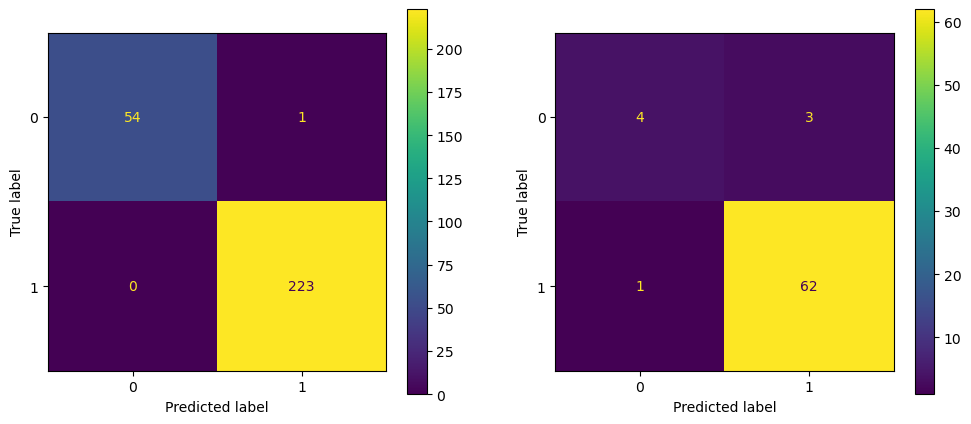

In [488]:
def detailed_objective_x4(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x4_xgb = xgb.XGBClassifier(n_estimators=best_models_x4_xgb_optuna[3].params['n_estimators'],
                                     max_depth=best_models_x4_xgb_optuna[3].params['max_depth'],
                                     learning_rate=best_models_x4_xgb_optuna[3].params['learning_rate'],
                                     subsample=best_models_x4_xgb_optuna[3].params['subsample'],
                                     colsample_bytree=best_models_x4_xgb_optuna[3].params['colsample_bytree'],
                                     gamma=best_models_x4_xgb_optuna[3].params['gamma'],
                                     reg_alpha=best_models_x4_xgb_optuna[3].params['reg_alpha'],
                                     reg_lambda=best_models_x4_xgb_optuna[3].params['reg_lambda'],
                                     min_child_weight=best_models_x4_xgb_optuna[3].params['min_child_weight'],
                                     scale_pos_weight=best_models_x4_xgb_optuna[3].params['scale_pos_weight'],
                                     max_delta_step=best_models_x4_xgb_optuna[3].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x4 = model_x4_xgb.fit(X4_train_spin,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4 = cross_val_score(xgb_spin_optuna_x4,X4_train_spin,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4 = cv_scores_xgb_spin_optuna_x4.mean()

    f1_train_x4_optuna = f1_score(y4_train_spin, model_x4_xgb.predict(X4_train_spin))
    f1_test_x4_optuna = f1_score(y4_test_spin, model_x4_xgb.predict(X4_test_spin))

    f1_train_best_optuna_x4 = f1_score(y4_train_spin,model_x4_xgb.predict(X4_train_spin))
    f1_test_best_optuna_x4 = f1_score(y4_test_spin,model_x4_xgb.predict(X4_test_spin))
    print(f1_train_best_optuna_x4,avg_f1_cv_xgb_spin_optuna_x4,f1_test_best_optuna_x4)

    ## Exporting the results of best trial no 3 only
    y_pred_x4 = model_x4_xgb.predict(X4_mu)
    out_file_x4 = pd.DataFrame({'y_true': y_spin, 'y_pred_x4': y_pred_x4})
    out_file_x4.to_excel('Results_Mag_States/y_pred_X4_Optuna_3.xlsx',index=False)  
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_best_optuna_x4 = confusion_matrix(y4_train_spin,xgb_spin_optuna_x4.predict(X4_train_spin))
    cm_test_best_optuna_x4 = confusion_matrix(y4_test_spin,xgb_spin_optuna_x4.predict(X4_test_spin))
    
    disp_train_best_optuna_x4 = ConfusionMatrixDisplay(cm_train_best_optuna_x4)
    disp_test_best_optuna_x4 = ConfusionMatrixDisplay(cm_test_best_optuna_x4)
    
    disp_train_best_optuna_x4.plot(ax=axes[0])
    disp_test_best_optuna_x4.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x4(study_x4_xgb.best_trials[3])

0.9977628635346756 0.7986785281135546 0.953125


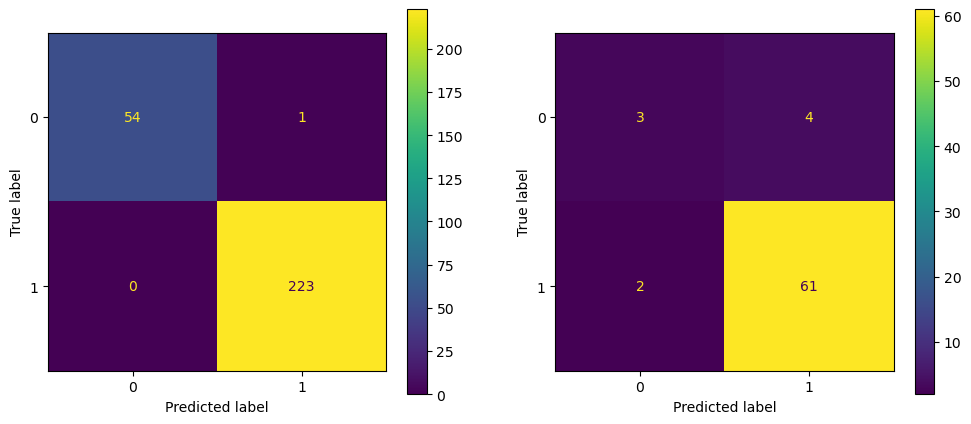

In [487]:
detailed_objective_x4(study_x4_xgb.best_trials[7])

0.9758241758241758 0.7954662256712852 0.9682539682539683


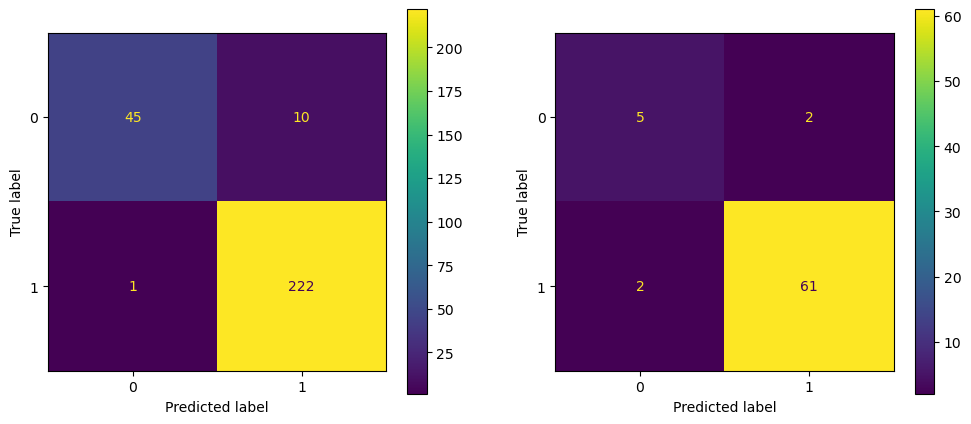

In [392]:
detailed_objective_x4(study_x4_xgb.best_trials[2])

0.9955357142857143 0.7956187433641653 0.9612403100775194


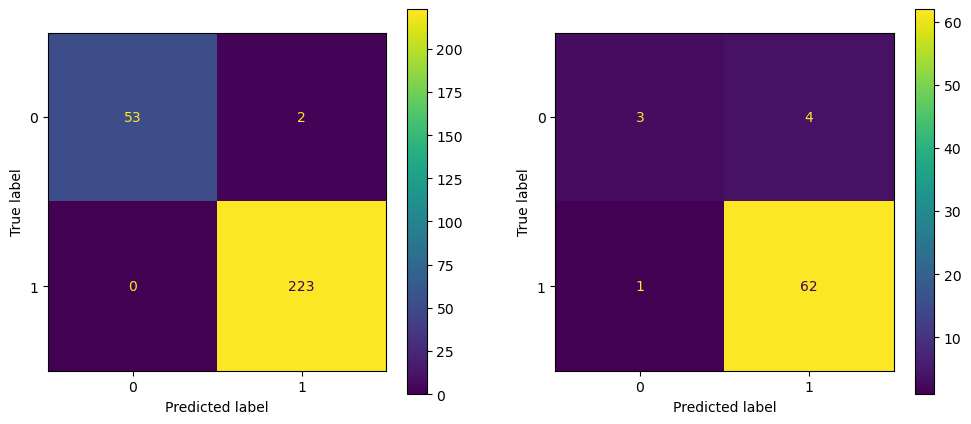

In [390]:
detailed_objective_x4(study_x4_xgb.best_trials[1])

In [275]:
X4_train_spin,X4_test_spin,y4_train_spin,y4_test_spin = train_test_split(X4_mu,y_spin,test_size=0.20,random_state=82)
xgb_spin_be_x4 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)
n_features = X4_train_spin.shape[1]

xgb_spin_sfs_x4 = sfs(xgb_spin_be_x4,forward=False,k_features=(1,n_features),scoring='f1_weighted',cv=cv,verbose=2,n_jobs=-1)

xgb_spin_sfs_x4 = xgb_spin_sfs_x4.fit(X4_train_spin, y4_train_spin)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 156 out of 156 | elapsed:    9.8s finished

[2025-03-08 19:26:56] Features: 155/1 -- score: 0.7889416356640926[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 155 out of 155 | elapsed:    9.5s finished

[2025-03-08 19:27:05] Features: 154/1 -- score: 0.8067779674197766[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 154 out of 154 | elapsed:    9.4s finished

[2025-03-08 19:27:15] Features: 153/1 -- score: 0.8195583263278363[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 15

In [276]:
xgb_spin_sfs_x4.get_metric_dict()

{156: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   52,
   53,
   54,
   55,
   56,
   57,
   58,
   59,
   60,
   61,
   62,
   63,
   64,
   65,
   66,
   67,
   68,
   69,
   70,
   71,
   72,
   73,
   74,
   75,
   76,
   77,
   78,
   79,
   80,
   81,
   82,
   83,
   84,
   85,
   86,
   87,
   88,
   89,
   90,
   91,
   92,
   93,
   94,
   95,
   96,
   97,
   98,
   99,
   100,
   101,
   102,
   103,
   104,
   105,
   106,
   107,
   108,
   109,
   110,
   111,
   112,
   113,
   114,
   115,
   116,
   117,
   118,
   119,
   120,
   121,
   122,
   123,
   124,
   125,
   126,
   127,
   128,
   129,
   130,
   131,
   132,
   133,
   134,
   135,
  

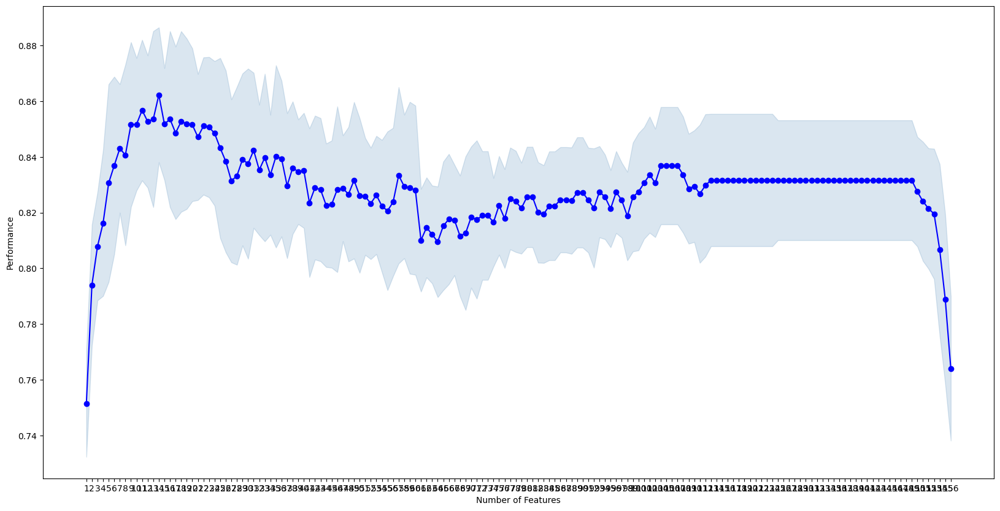

In [277]:
fig = plot_sfs(xgb_spin_sfs_x4.get_metric_dict(),kind='std_err',figsize=(20,10))
plt.show()

In [278]:
xgb_spin_sfs_x4.k_feature_idx_

(24, 33, 51, 52, 76, 77, 87, 97, 119, 126, 130, 131, 132, 155)

In [279]:
print(xgb_spin_sfs_x4.k_feature_names_)
print(len(xgb_spin_sfs_x4.k_feature_names_))

('avg_a12b58_covalent_radius', 'avg_a12b58_atomic_radius', 'delta_a1a2_dipole_polarizability', 'avg_a12x18_dipole_polarizability', 'max_diff_unp_electrons', 'std_ion_energies', 'delta_a12x914_avg_no_electrons', 'delta_bx1418bx58914_avg_electronegativity', 'delta_a12x914_avg_metallic_radius', 'std_mendeleev_number', 'delta_a12b14_avg_mendeleev_number', 'delta_a12b58_avg_mendeleev_number', 'delta_bx1418bx58914_avg_mendeleev_number', 'avg_a12b58_heat_of_formation')
14


In [280]:
X4_mu_be_xgb = X4_mu[[i for i in xgb_spin_sfs_x4.k_feature_names_]]
X4_train_spin_be_xgb = X4_train_spin[[i for i in xgb_spin_sfs_x4.k_feature_names_]]
X4_test_spin_be_xgb = X4_test_spin[[i for i in xgb_spin_sfs_x4.k_feature_names_]]

In [282]:
def find_extra_element(tuple1,tuple2):
    set1 = set(tuple1)
    set2 = set(tuple2)
    
    extra_element = (set1 - set2).pop()
    return extra_element

for i in range(len(xgb_spin_sfs_x4.get_metric_dict())):
    j = i+1
    if j==X4_mu.shape[1]:
        eliminated_feature_index = 'None'
        eliminated_feature = 'None'
    else:
        eliminated_feature_index = find_extra_element(xgb_spin_sfs_x4.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x4.get_metric_dict()[j]['feature_idx'])
        eliminated_feature = X4_mu.columns[eliminated_feature_index]
    print(j,eliminated_feature_index,eliminated_feature,xgb_spin_sfs_x4.get_metric_dict()[j]['avg_score'],xgb_spin_sfs_x4.get_metric_dict()[j]['ci_bound'],xgb_spin_sfs_x4.get_metric_dict()[j]['std_dev'],xgb_spin_sfs_x4.get_metric_dict()[j]['std_err'])

1 77 std_ion_energies 0.7513418311568174 0.04891361183922295 0.03805645178155943 0.019028225890779713
2 52 avg_a12x18_dipole_polarizability 0.7940249099127243 0.05570018883618288 0.04333663924953008 0.021668319624765037
3 87 delta_a12x914_avg_no_electrons 0.8078805833754347 0.04984474778561969 0.0387809071818803 0.01939045359094015
4 76 max_diff_unp_electrons 0.8162302693328002 0.0672185055095287 0.05229828093987884 0.026149140469939415
5 33 avg_a12b58_atomic_radius 0.8306176520545556 0.09125656934937304 0.07100071126643098 0.03550035563321549
6 126 std_mendeleev_number 0.8369224767131265 0.08194834704598565 0.06375859808073406 0.03187929904036702
7 132 delta_bx1418bx58914_avg_mendeleev_number 0.8430530232934397 0.059290216498873484 0.04612980273720558 0.023064901368602786
8 130 delta_a12b14_avg_mendeleev_number 0.8406944924528267 0.08346244508034044 0.06493661779079708 0.032468308895398534
9 97 delta_bx1418bx58914_avg_electronegativity 0.8516292130058373 0.07604415967692961 0.05916493

In [283]:
iteration_be_xgb_x4 = []
eliminated_feature_index_be_xgb_x4 = []
eliminated_feature_be_xgb_x4 = []
avg_cv_F1_score_be_xgb_x4 = []
ci_bound_be_xgb_x4 = []
std_dev_be_xgb_x4 = []
std_err_be_xgb_x4 = []

for i in range(len(xgb_spin_sfs_x4.get_metric_dict())):
    j = i+1
    iteration_be_xgb_x4.append(j)
    if j==X4_mu.shape[1]:
        eliminated_feature_index_be_xgb_x4.append('None')
        eliminated_feature_be_xgb_x4.append('None')
    else:
        elim_feat_index_for_feat_be_xgb_x4 = find_extra_element(xgb_spin_sfs_x4.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x4.get_metric_dict()[j]['feature_idx'])
        eliminated_feature_index_be_xgb_x4.append(elim_feat_index_for_feat_be_xgb_x4)
        eliminated_feature_be_xgb_x4.append(X4_mu.columns[elim_feat_index_for_feat_be_xgb_x4])

    avg_cv_F1_score_be_xgb_x4.append(xgb_spin_sfs_x4.get_metric_dict()[j]['avg_score'])
    ci_bound_be_xgb_x4.append(xgb_spin_sfs_x4.get_metric_dict()[j]['ci_bound'])
    std_dev_be_xgb_x4.append(xgb_spin_sfs_x4.get_metric_dict()[j]['std_dev'])
    std_err_be_xgb_x4.append(xgb_spin_sfs_x4.get_metric_dict()[j]['std_err'])

In [284]:
training_history_be_xgb_x4 = pd.DataFrame({
    'iteration':iteration_be_xgb_x4,
    'eliminated_feature_index': eliminated_feature_index_be_xgb_x4,
    'eliminated_feature': eliminated_feature_be_xgb_x4,
    'avg_cv_F1_score': avg_cv_F1_score_be_xgb_x4,
    'ci_bound_be': ci_bound_be_xgb_x4,
    'std_dev_be': std_dev_be_xgb_x4,
    'std_err_be': std_err_be_xgb_x4
})

training_history_be_xgb_x4.to_csv('Results_Mag_States/XGB_X4_training_history.csv',index=False)

0.9964150392410033 0.8622958201327275 0.8812051649928264


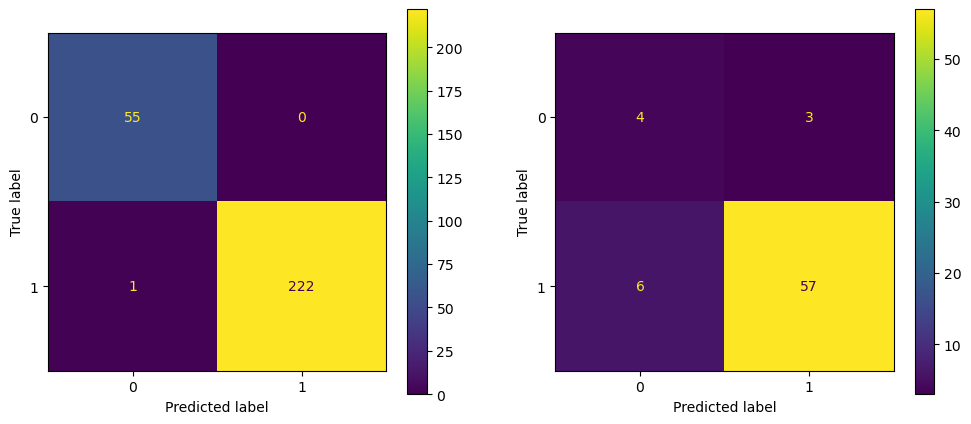

In [286]:
model_xgb_from_be_x4 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)

xgb_from_be_x4 = model_xgb_from_be_x4.fit(X4_train_spin_be_xgb, y4_train_spin)

cv_scores_xgb_from_be_x4 = cross_val_score(xgb_from_be_x4,X4_train_spin_be_xgb,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_from_be_x4 = cv_scores_xgb_from_be_x4.mean()

f1_train_xgb_from_be_x4 = f1_score(y4_train_spin,model_xgb_from_be_x4.predict(X4_train_spin_be_xgb), average='weighted')
f1_test_xgb_from_be_x4 = f1_score(y4_test_spin,model_xgb_from_be_x4.predict(X4_test_spin_be_xgb), average='weighted')
print(f1_train_xgb_from_be_x4,avg_f1_cv_xgb_from_be_x4,f1_test_xgb_from_be_x4)

fig,axes = plt.subplots(1,2,figsize=(12,5))

cm_train_xgb_from_be_x4 = confusion_matrix(y4_train_spin,xgb_from_be_x4.predict(X4_train_spin_be_xgb))
cm_test_xgb_from_be_x4 = confusion_matrix(y4_test_spin,xgb_from_be_x4.predict(X4_test_spin_be_xgb))

disp_train_xgb_from_be_x4 = ConfusionMatrixDisplay(cm_train_xgb_from_be_x4)
disp_test_xgb_from_be_x4 = ConfusionMatrixDisplay(cm_test_xgb_from_be_x4)

disp_train_xgb_from_be_x4.plot(ax=axes[0])
disp_test_xgb_from_be_x4.plot(ax=axes[1])

plt.show()

In [288]:
import optuna
import random

def objective_x4_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x4_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x4_be = model_be_x4_xgb.fit(X4_train_spin_be_xgb,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4_be = cross_val_score(xgb_spin_optuna_x4_be,X4_train_spin_be_xgb,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4_be = cv_scores_xgb_spin_optuna_x4_be.mean()

    # Return best F1 scores
    f1_train_x4_be = f1_score(y4_train_spin, model_be_x4_xgb.predict(X4_train_spin_be_xgb),average='weighted')
    f1_test_x4_be = f1_score(y4_test_spin, model_be_x4_xgb.predict(X4_test_spin_be_xgb),average='weighted')
    return f1_train_x4_be,avg_f1_cv_xgb_spin_optuna_x4_be,f1_test_x4_be
# return avg_f1_cv_et_spin_optunax4

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_be_x4_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_be_x4_xgb.optimize(objective_x4_be, n_trials=300)

[I 2025-03-08 19:47:49,120] A new study created in memory with name: no-name-839cf9b1-77b5-4401-92e3-f4cc6a02c14a
[I 2025-03-08 19:47:51,328] Trial 0 finished with values: [0.8087654273880799, 0.7517079125558377, 0.8526315789473684] and parameters: {'n_estimators': 83, 'max_depth': 23, 'learning_rate': 0.08008023680204873, 'subsample': 0.7862142700114332, 'colsample_bytree': 0.2606224914028889, 'gamma': 2.191919309371647, 'reg_alpha': 0.3772454922613062, 'reg_lambda': 1.502625013794904e-07, 'min_child_weight': 5, 'scale_pos_weight': 3, 'max_delta_step': 1.5913326079141565}.
[I 2025-03-08 19:47:51,452] Trial 1 finished with values: [0.7140969858843463, 0.7148068898429372, 0.8526315789473684] and parameters: {'n_estimators': 135, 'max_depth': 28, 'learning_rate': 0.18237542542476784, 'subsample': 0.13525955903163597, 'colsample_bytree': 0.6494811584641069, 'gamma': 5.405074693825044, 'reg_alpha': 8.023245565402421, 'reg_lambda': 0.10067156990092968, 'min_child_weight': 8, 'scale_pos_weig

In [289]:
best_models_x4_be_xgb = study_be_x4_xgb.best_trials
for i in range(len(best_models_x4_be_xgb)):
    print('\n',i)
    print('Trial number: ', best_models_x4_be_xgb[i].number)
    print('F1 scores: ', best_models_x4_be_xgb[i].values)
    print('Parameters: ', best_models_x4_be_xgb[i].params)


 0
Trial number:  145
F1 scores:  [0.9816858581554142, 0.8169024410857986, 0.9385416666666667]
Parameters:  {'n_estimators': 49, 'max_depth': 7, 'learning_rate': 0.12020481369070705, 'subsample': 0.7535153807080415, 'colsample_bytree': 0.8722309288623332, 'gamma': 0.19786903646275555, 'reg_alpha': 4.941139069476908e-06, 'reg_lambda': 0.4450720446220863, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 8.285099543391544}

 1
Trial number:  156
F1 scores:  [0.9626246371323993, 0.8287822285674944, 0.9142857142857143]
Parameters:  {'n_estimators': 127, 'max_depth': 43, 'learning_rate': 0.1473133650451516, 'subsample': 0.7602056048108446, 'colsample_bytree': 0.8741382911852174, 'gamma': 0.2203143081720349, 'reg_alpha': 2.5842587743738977e-05, 'reg_lambda': 1.578153767082922e-05, 'min_child_weight': 4, 'scale_pos_weight': 4, 'max_delta_step': 9.834320567554615}

 2
Trial number:  202
F1 scores:  [0.9467345688666458, 0.8326390344901149, 0.9261053906723197]
Parameters:  {'n_est

In [612]:
best_models_x4_be_xgb_pd = pd.DataFrame({'Trial number': [best_models_x4_be_xgb[i].number for i in range(len(best_models_x4_be_xgb))],
                                             'Train F1': [best_models_x4_be_xgb[i].values[0] for i in range(len(best_models_x4_be_xgb))],
                                             'Test F1': [best_models_x4_be_xgb[i].values[2] for i in range(len(best_models_x4_be_xgb))],
                                             'CV F1': [best_models_x4_be_xgb[i].values[1] for i in range(len(best_models_x4_be_xgb))],
                                             'n_estimators': [best_models_x4_be_xgb[i].params['n_estimators'] for i in range(len(best_models_x4_be_xgb))],
                                             'max_depth': [best_models_x4_be_xgb[i].params['max_depth'] for i in range(len(best_models_x4_be_xgb))],
                                             'learning_rate': [best_models_x4_be_xgb[i].params['learning_rate'] for i in range(len(best_models_x4_be_xgb))],
                                             'subsample': [best_models_x4_be_xgb[i].params['subsample'] for i in range(len(best_models_x4_be_xgb))],
                                             'colsample_bytree': [best_models_x4_be_xgb[i].params['colsample_bytree'] for i in range(len(best_models_x4_be_xgb))],
                                             'gamma': [best_models_x4_be_xgb[i].params['gamma'] for i in range(len(best_models_x4_be_xgb))],
                                             'reg_alpha': [best_models_x4_be_xgb[i].params['reg_alpha'] for i in range(len(best_models_x4_be_xgb))],
                                             'reg_lambda': [best_models_x4_be_xgb[i].params['reg_lambda'] for i in range(len(best_models_x4_be_xgb))],
                                             'min_child_weight': [best_models_x4_be_xgb[i].params['min_child_weight'] for i in range(len(best_models_x4_be_xgb))],
                                             'scale_pos_weight': [best_models_x4_be_xgb[i].params['scale_pos_weight'] for i in range(len(best_models_x4_be_xgb))],
                                             'max_delta_step': [best_models_x4_be_xgb[i].params['max_delta_step'] for i in range(len(best_models_x4_be_xgb))]
                                            })
best_models_x4_be_xgb_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X4_BE_HP_Optuna.xlsx')

In [ ]:
# 0
# Trial number:  145
# F1 scores:  [0.9816858581554142, 0.8169024410857986, 0.9385416666666667]
# Parameters:  {'n_estimators': 49, 'max_depth': 7, 'learning_rate': 0.12020481369070705, 'subsample': 0.7535153807080415, 'colsample_bytree': 0.8722309288623332, 'gamma': 0.19786903646275555, 'reg_alpha': 4.941139069476908e-06, 'reg_lambda': 0.4450720446220863, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 8.285099543391544}

#  1
# Trial number:  156
# F1 scores:  [0.9626246371323993, 0.8287822285674944, 0.9142857142857143]
# Parameters:  {'n_estimators': 127, 'max_depth': 43, 'learning_rate': 0.1473133650451516, 'subsample': 0.7602056048108446, 'colsample_bytree': 0.8741382911852174, 'gamma': 0.2203143081720349, 'reg_alpha': 2.5842587743738977e-05, 'reg_lambda': 1.578153767082922e-05, 'min_child_weight': 4, 'scale_pos_weight': 4, 'max_delta_step': 9.834320567554615}

#  2
# Trial number:  202
# F1 scores:  [0.9467345688666458, 0.8326390344901149, 0.9261053906723197]
# Parameters:  {'n_estimators': 127, 'max_depth': 7, 'learning_rate': 0.1473133650451516, 'subsample': 0.7535153807080415, 'colsample_bytree': 0.8741382911852174, 'gamma': 0.19786903646275555, 'reg_alpha': 4.941139069476908e-06, 'reg_lambda': 0.40811103697231726, 'min_child_weight': 4, 'scale_pos_weight': 4, 'max_delta_step': 8.285099543391544}

#  3
# Trial number:  242
# F1 scores:  [0.9963904007635588, 0.8307946145603371, 0.9029333333333333]
# Parameters:  {'n_estimators': 105, 'max_depth': 28, 'learning_rate': 0.2174154061612492, 'subsample': 0.7216093252840772, 'colsample_bytree': 0.8722309288623332, 'gamma': 0.19786903646275555, 'reg_alpha': 0.00020449511981304483, 'reg_lambda': 9.617265079160363e-06, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 9.712337509887854}

#  4
# Trial number:  245
# F1 scores:  [0.9963904007635588, 0.8471210852230812, 0.8919354838709677]
# Parameters:  {'n_estimators': 144, 'max_depth': 7, 'learning_rate': 0.12020481369070705, 'subsample': 0.823737424392932, 'colsample_bytree': 0.8722309288623332, 'gamma': 0.19786903646275555, 'reg_alpha': 4.941139069476908e-06, 'reg_lambda': 2.2145075134356238e-05, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 9.834320567554615}

#  5
# Trial number:  250
# F1 scores:  [0.9467345688666458, 0.8258653219192815, 0.9385416666666667]
# Parameters:  {'n_estimators': 150, 'max_depth': 33, 'learning_rate': 0.10945785921477051, 'subsample': 0.6309037740082162, 'colsample_bytree': 0.4324306924108219, 'gamma': 0.19786903646275555, 'reg_alpha': 4.941139069476908e-06, 'reg_lambda': 0.00017464803514274414, 'min_child_weight': 3, 'scale_pos_weight': 4, 'max_delta_step': 9.834320567554615}

#  6
# Trial number:  263
# F1 scores:  [0.966503672266191, 0.8182292148616315, 0.9323076923076924]
# Parameters:  {'n_estimators': 144, 'max_depth': 28, 'learning_rate': 0.2174154061612492, 'subsample': 0.6309037740082162, 'colsample_bytree': 0.4324306924108219, 'gamma': 0.19786903646275555, 'reg_alpha': 0.00020449511981304483, 'reg_lambda': 0.5516708985932615, 'min_child_weight': 3, 'scale_pos_weight': 5, 'max_delta_step': 9.834320567554615}

#  7
# Trial number:  298
# F1 scores:  [0.989093403586146, 0.8167024485120816, 0.9261053906723197]
# Parameters:  {'n_estimators': 87, 'max_depth': 24, 'learning_rate': 0.08023800709976492, 'subsample': 0.7136943319293676, 'colsample_bytree': 0.4324306924108219, 'gamma': 0.2203143081720349, 'reg_alpha': 0.01076739407357102, 'reg_lambda': 1.578153767082922e-05, 'min_child_weight': 1, 'scale_pos_weight': 4, 'max_delta_step': 8.39506160939616}

0.989093403586146 0.8167024485120816 0.9261053906723197


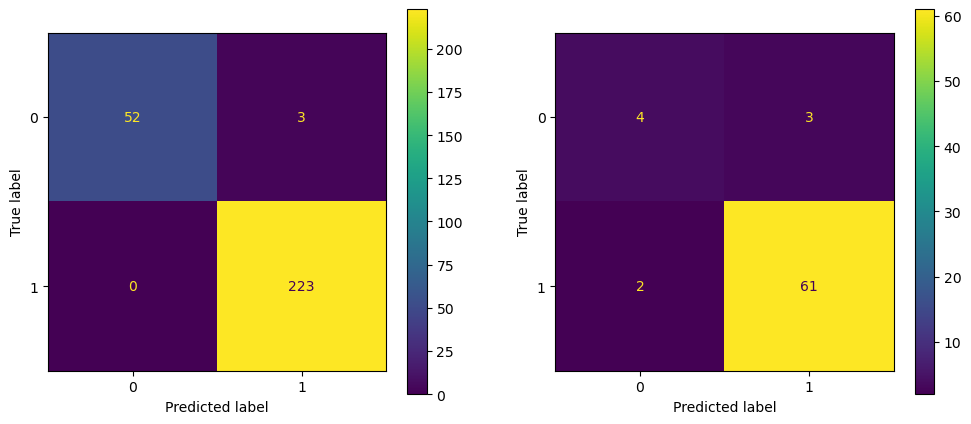

In [490]:
def detailed_objective_x4_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x4_xgb = xgb.XGBClassifier(n_estimators=best_models_x4_be_xgb[7].params['n_estimators'],
                                     max_depth=best_models_x4_be_xgb[7].params['max_depth'],
                                     learning_rate=best_models_x4_be_xgb[7].params['learning_rate'],
                                     subsample=best_models_x4_be_xgb[7].params['subsample'],
                                     colsample_bytree=best_models_x4_be_xgb[7].params['colsample_bytree'],
                                     gamma=best_models_x4_be_xgb[7].params['gamma'],
                                     reg_alpha=best_models_x4_be_xgb[7].params['reg_alpha'],
                                     reg_lambda=best_models_x4_be_xgb[7].params['reg_lambda'],
                                     min_child_weight=best_models_x4_be_xgb[7].params['min_child_weight'],
                                     scale_pos_weight=best_models_x4_be_xgb[7].params['scale_pos_weight'],
                                     max_delta_step=best_models_x4_be_xgb[7].params['max_delta_step'],
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x4_be = model_be_x4_xgb.fit(X4_train_spin_be_xgb,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4_be = cross_val_score(xgb_spin_optuna_x4_be,X4_train_spin_be_xgb,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4_be = cv_scores_xgb_spin_optuna_x4_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y4_train_spin,model_be_x4_xgb.predict(X4_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y4_test_spin,model_be_x4_xgb.predict(X4_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x4_be,f1_test_xgb_best_optuna_be)
    
    ## Exporting the results of best trial no 0(best),7
    y_pred_x4_be = model_be_x4_xgb.predict(X4_mu_be_xgb)
    out_file_x4_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x4_be': y_pred_x4_be})
    out_file_x4_be.to_excel('Results_Mag_States/y_pred_X4_be_Optuna_7.xlsx',index=False)    
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y4_train_spin,xgb_spin_optuna_x4_be.predict(X4_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y4_test_spin,xgb_spin_optuna_x4_be.predict(X4_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x4_be(study_be_x4_xgb.best_trials[7])

0.9467345688666458 0.8258653219192815 0.9385416666666667


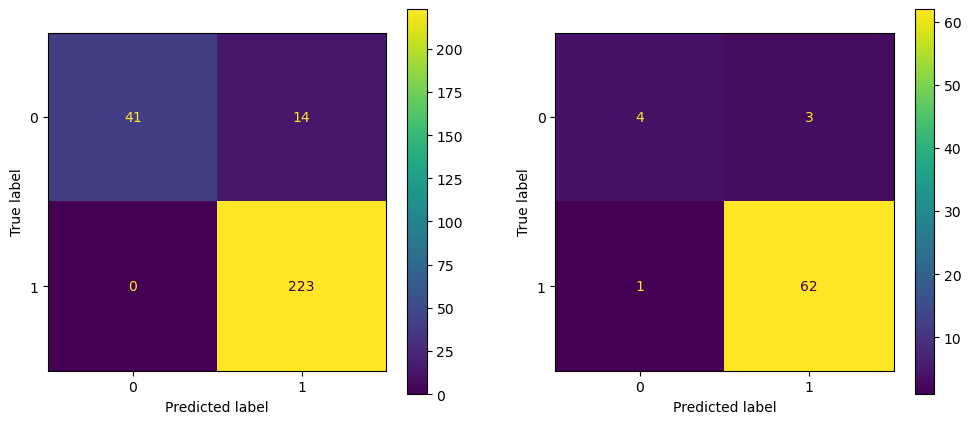

In [412]:
detailed_objective_x4_be(study_be_x4_xgb.best_trials[5])

0.9816858581554142 0.8169024410857986 0.9385416666666667


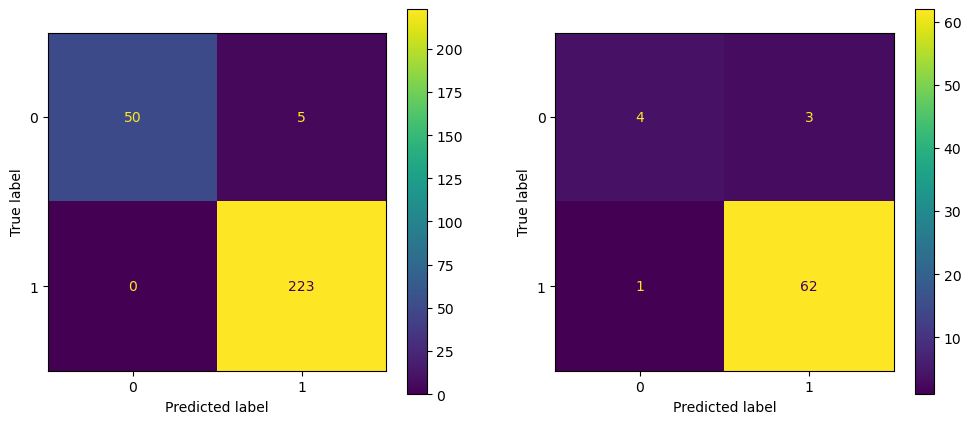

In [406]:
detailed_objective_x4_be(study_be_x4_xgb.best_trials[0])

In [ ]:
## for dataset X5

In [293]:
import optuna
import random
X5_train_spin,X5_test_spin,y5_train_spin,y5_test_spin = train_test_split(X5_mu,y_spin,test_size=0.20,random_state=82)

def objective_x5(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x5_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x5 = model_x5_xgb.fit(X5_train_spin,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5 = cross_val_score(xgb_spin_optuna_x5,X5_train_spin,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5 = cv_scores_xgb_spin_optuna_x5.mean()

    # Return best F1 scores
    f1_train_x5 = f1_score(y5_train_spin, model_x5_xgb.predict(X5_train_spin))
    f1_test_x5 = f1_score(y5_test_spin, model_x5_xgb.predict(X5_test_spin))
    return f1_train_x5,avg_f1_cv_xgb_spin_optuna_x5,f1_test_x5
# return avg_f1_cv_xgb_spin_optuna_x5

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_x5_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_x5_xgb.optimize(objective_x5, n_trials=300)

[I 2025-03-08 19:48:59,623] A new study created in memory with name: no-name-ceacf262-9a4e-4296-aeb6-46d1f25fe4d0
[I 2025-03-08 19:48:59,926] Trial 0 finished with values: [0.9293361884368309, 0.7682905222868442, 0.9354838709677419] and parameters: {'n_estimators': 79, 'max_depth': 35, 'learning_rate': 0.24510263500821772, 'subsample': 0.5603879087867542, 'colsample_bytree': 0.2152572575382664, 'gamma': 4.0680901453608715, 'reg_alpha': 7.630126969201056e-05, 'reg_lambda': 1.4951742418214483e-07, 'min_child_weight': 4, 'scale_pos_weight': 1, 'max_delta_step': 7.362658835767282}.
[I 2025-03-08 19:49:00,267] Trial 1 finished with values: [0.9065040650406504, 0.7290499802491797, 0.9545454545454546] and parameters: {'n_estimators': 118, 'max_depth': 46, 'learning_rate': 0.07518756545677466, 'subsample': 0.5893086795985892, 'colsample_bytree': 0.212364201829288, 'gamma': 8.62081793811061, 'reg_alpha': 2.657543486330105e-05, 'reg_lambda': 0.00040409049504258886, 'min_child_weight': 3, 'scale_

In [294]:
best_models_x5_xgb_optuna = study_x5_xgb.best_trials
best_models_x5_xgb_optuna

[FrozenTrial(number=4, state=1, values=[0.9933184855233853, 0.7899764019170098, 0.9612403100775194], datetime_start=datetime.datetime(2025, 3, 8, 19, 49, 0, 884237), datetime_complete=datetime.datetime(2025, 3, 8, 19, 49, 1, 368468), params={'n_estimators': 147, 'max_depth': 28, 'learning_rate': 0.13314871399035325, 'subsample': 0.7429255864361706, 'colsample_bytree': 0.46058548887219064, 'gamma': 1.224724798061717, 'reg_alpha': 0.03951783646330095, 'reg_lambda': 0.15173596862024044, 'min_child_weight': 2, 'scale_pos_weight': 10, 'max_delta_step': 8.304194381227227}, user_attrs={}, system_attrs={'nsga2:generation': 0}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=150, log=False, low=10, step=1), 'max_depth': IntDistribution(high=50, log=False, low=5, step=1), 'learning_rate': FloatDistribution(high=0.3, log=True, low=0.05, step=None), 'subsample': FloatDistribution(high=1.0, log=False, low=0.1, step=None), 'colsample_bytree': FloatDistribution(high=1.0, l

In [295]:
for i in range(len(best_models_x5_xgb_optuna)):
    print('\n',i)
    print('Trial number: ', best_models_x5_xgb_optuna[i].number)
    print('F1 scores: ', best_models_x5_xgb_optuna[i].values)
    print('Parameters: ', best_models_x5_xgb_optuna[i].params)


 0
Trial number:  4
F1 scores:  [0.9933184855233853, 0.7899764019170098, 0.9612403100775194]
Parameters:  {'n_estimators': 147, 'max_depth': 28, 'learning_rate': 0.13314871399035325, 'subsample': 0.7429255864361706, 'colsample_bytree': 0.46058548887219064, 'gamma': 1.224724798061717, 'reg_alpha': 0.03951783646330095, 'reg_lambda': 0.15173596862024044, 'min_child_weight': 2, 'scale_pos_weight': 10, 'max_delta_step': 8.304194381227227}

 1
Trial number:  68
F1 scores:  [0.9208333333333333, 0.7980033720034203, 0.96875]
Parameters:  {'n_estimators': 103, 'max_depth': 5, 'learning_rate': 0.0821577752953091, 'subsample': 0.7856602133560505, 'colsample_bytree': 0.4531098163196382, 'gamma': 3.4585245553544675, 'reg_alpha': 0.2308231721328385, 'reg_lambda': 0.3694517182613359, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 4.534926955023366}

 2
Trial number:  118
F1 scores:  [0.9509594882729211, 0.7864975374086589, 0.96875]
Parameters:  {'n_estimators': 63, 'max_depth': 8, 'l

In [613]:
best_models_x5_xgb_optuna_pd = pd.DataFrame({'Trial number': [best_models_x5_xgb_optuna[i].number for i in range(len(best_models_x5_xgb_optuna))],
                                             'Train F1': [best_models_x5_xgb_optuna[i].values[0] for i in range(len(best_models_x5_xgb_optuna))],
                                             'Test F1': [best_models_x5_xgb_optuna[i].values[2] for i in range(len(best_models_x5_xgb_optuna))],
                                             'CV F1': [best_models_x5_xgb_optuna[i].values[1] for i in range(len(best_models_x5_xgb_optuna))],
                                             'n_estimators': [best_models_x5_xgb_optuna[i].params['n_estimators'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'max_depth': [best_models_x5_xgb_optuna[i].params['max_depth'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'learning_rate': [best_models_x5_xgb_optuna[i].params['learning_rate'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'subsample': [best_models_x5_xgb_optuna[i].params['subsample'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'colsample_bytree': [best_models_x5_xgb_optuna[i].params['colsample_bytree'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'gamma': [best_models_x5_xgb_optuna[i].params['gamma'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'reg_alpha': [best_models_x5_xgb_optuna[i].params['reg_alpha'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'reg_lambda': [best_models_x5_xgb_optuna[i].params['reg_lambda'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'min_child_weight': [best_models_x5_xgb_optuna[i].params['min_child_weight'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'scale_pos_weight': [best_models_x5_xgb_optuna[i].params['scale_pos_weight'] for i in range(len(best_models_x5_xgb_optuna))],
                                             'max_delta_step': [best_models_x5_xgb_optuna[i].params['max_delta_step'] for i in range(len(best_models_x5_xgb_optuna))]
                                            })
best_models_x5_xgb_optuna_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X5_HP_Optuna.xlsx')

In [ ]:
# 0
# Trial number:  4
# F1 scores:  [0.9933184855233853, 0.7899764019170098, 0.9612403100775194]
# Parameters:  {'n_estimators': 147, 'max_depth': 28, 'learning_rate': 0.13314871399035325, 'subsample': 0.7429255864361706, 'colsample_bytree': 0.46058548887219064, 'gamma': 1.224724798061717, 'reg_alpha': 0.03951783646330095, 'reg_lambda': 0.15173596862024044, 'min_child_weight': 2, 'scale_pos_weight': 10, 'max_delta_step': 8.304194381227227}

#  1
# Trial number:  68
# F1 scores:  [0.9208333333333333, 0.7980033720034203, 0.96875]
# Parameters:  {'n_estimators': 103, 'max_depth': 5, 'learning_rate': 0.0821577752953091, 'subsample': 0.7856602133560505, 'colsample_bytree': 0.4531098163196382, 'gamma': 3.4585245553544675, 'reg_alpha': 0.2308231721328385, 'reg_lambda': 0.3694517182613359, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 4.534926955023366}

#  2
# Trial number:  118
# F1 scores:  [0.9509594882729211, 0.7864975374086589, 0.96875]
# Parameters:  {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.10342325245828143, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.8360321133687274, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 2.929524266395178}

#  3
# Trial number:  134
# F1 scores:  [0.9845474613686535, 0.785988412906099, 0.96875]
# Parameters:  {'n_estimators': 147, 'max_depth': 28, 'learning_rate': 0.23876549809563066, 'subsample': 0.5184056113290467, 'colsample_bytree': 0.46058548887219064, 'gamma': 1.224724798061717, 'reg_alpha': 0.0643751471630043, 'reg_lambda': 0.9728627604915258, 'min_child_weight': 2, 'scale_pos_weight': 10, 'max_delta_step': 8.304194381227227}

#  4
# Trial number:  172
# F1 scores:  [0.9955357142857143, 0.7773815959888662, 0.9606299212598425]
# Parameters:  {'n_estimators': 147, 'max_depth': 11, 'learning_rate': 0.12008063425476408, 'subsample': 0.7429255864361706, 'colsample_bytree': 0.23937189673037146, 'gamma': 1.224724798061717, 'reg_alpha': 0.03951783646330095, 'reg_lambda': 5.884773121924346e-05, 'min_child_weight': 2, 'scale_pos_weight': 1, 'max_delta_step': 8.304194381227227}

#  5
# Trial number:  175
# F1 scores:  [0.9429175475687104, 0.7906637235209086, 0.96875]
# Parameters:  {'n_estimators': 92, 'max_depth': 21, 'learning_rate': 0.25630677494282345, 'subsample': 0.9993771122584044, 'colsample_bytree': 0.3191847223167144, 'gamma': 1.224724798061717, 'reg_alpha': 0.10560362191571138, 'reg_lambda': 6.162088849936629e-06, 'min_child_weight': 5, 'scale_pos_weight': 8, 'max_delta_step': 4.365339483710966}

#  6
# Trial number:  181
# F1 scores:  [0.9429175475687104, 0.7971843039175457, 0.9612403100775194]
# Parameters:  {'n_estimators': 147, 'max_depth': 6, 'learning_rate': 0.06437976117475407, 'subsample': 0.7429255864361706, 'colsample_bytree': 0.46058548887219064, 'gamma': 2.925300070856035, 'reg_alpha': 0.010936904290471313, 'reg_lambda': 0.3694517182613359, 'min_child_weight': 1, 'scale_pos_weight': 2, 'max_delta_step': 5.902824354265014}

#  7
# Trial number:  182
# F1 scores:  [0.9591397849462365, 0.7995206562112791, 0.953125]
# Parameters:  {'n_estimators': 118, 'max_depth': 6, 'learning_rate': 0.10342325245828143, 'subsample': 0.5893086795985892, 'colsample_bytree': 0.8574867207938279, 'gamma': 1.8360321133687274, 'reg_alpha': 2.657543486330105e-05, 'reg_lambda': 0.1072143083225399, 'min_child_weight': 3, 'scale_pos_weight': 4, 'max_delta_step': 5.965229848505203}

#  8
# Trial number:  184
# F1 scores:  [0.9117647058823529, 0.8031602333011246, 0.96875]
# Parameters:  {'n_estimators': 62, 'max_depth': 11, 'learning_rate': 0.11694743611815034, 'subsample': 0.8240310498749946, 'colsample_bytree': 0.676434115438386, 'gamma': 3.0814308155056827, 'reg_alpha': 0.9447706438322393, 'reg_lambda': 9.80862191670601e-07, 'min_child_weight': 10, 'scale_pos_weight': 1, 'max_delta_step': 5.415779775169488}

#  9
# Trial number:  196
# F1 scores:  [0.9889135254988913, 0.760207620153665, 0.96875]
# Parameters:  {'n_estimators': 147, 'max_depth': 28, 'learning_rate': 0.23876549809563066, 'subsample': 0.5184056113290467, 'colsample_bytree': 0.46058548887219064, 'gamma': 1.224724798061717, 'reg_alpha': 0.062034929725059515, 'reg_lambda': 0.2854629263590963, 'min_child_weight': 2, 'scale_pos_weight': 10, 'max_delta_step': 8.304194381227227}

#  10
# Trial number:  218
# F1 scores:  [0.9446808510638298, 0.7901752783289512, 0.9612403100775194]
# Parameters:  {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.09277184518889808, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.224724798061717, 'reg_alpha': 8.571457966749456e-05, 'reg_lambda': 4.627339694983848e-07, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 2.929524266395178}

#  11
# Trial number:  220
# F1 scores:  [0.9509594882729211, 0.7864975374086589, 0.96875]
# Parameters:  {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.10342325245828143, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.8360321133687274, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 2.929524266395178}

#  12
# Trial number:  236
# F1 scores:  [0.9570815450643777, 0.7979829225091372, 0.9538461538461539]
# Parameters:  {'n_estimators': 127, 'max_depth': 22, 'learning_rate': 0.09202500138658565, 'subsample': 0.9993771122584044, 'colsample_bytree': 0.3191847223167144, 'gamma': 1.224724798061717, 'reg_alpha': 5.035065904980516e-07, 'reg_lambda': 1.7942660953061684e-08, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 3.13724405098436}

#  13
# Trial number:  258
# F1 scores:  [0.9509594882729211, 0.7864975374086589, 0.96875]
# Parameters:  {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.10342325245828143, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.8360321133687274, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 2.929524266395178}

#  14
# Trial number:  261
# F1 scores:  [0.91701244813278, 0.7389056246189937, 0.9767441860465116]
# Parameters:  {'n_estimators': 82, 'max_depth': 46, 'learning_rate': 0.06437976117475407, 'subsample': 0.5979342289804849, 'colsample_bytree': 0.8688738293562084, 'gamma': 4.016285934732418, 'reg_alpha': 5.138295892708307e-07, 'reg_lambda': 9.80862191670601e-07, 'min_child_weight': 10, 'scale_pos_weight': 1, 'max_delta_step': 7.432876115920269}

#  15
# Trial number:  272
# F1 scores:  [0.9550321199143469, 0.7998092881625594, 0.9538461538461539]
# Parameters:  {'n_estimators': 118, 'max_depth': 34, 'learning_rate': 0.09202500138658565, 'subsample': 0.9993771122584044, 'colsample_bytree': 0.3191847223167144, 'gamma': 1.224724798061717, 'reg_alpha': 5.035065904980516e-07, 'reg_lambda': 1.7942660953061684e-08, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 6.458682098816263}

#  16
# Trial number:  273
# F1 scores:  [0.9429175475687104, 0.7906637235209086, 0.96875]
# Parameters:  {'n_estimators': 92, 'max_depth': 21, 'learning_rate': 0.25630677494282345, 'subsample': 0.9993771122584044, 'colsample_bytree': 0.3191847223167144, 'gamma': 1.224724798061717, 'reg_alpha': 0.10560362191571138, 'reg_lambda': 6.162088849936629e-06, 'min_child_weight': 5, 'scale_pos_weight': 8, 'max_delta_step': 4.365339483710966}

#  17
# Trial number:  274
# F1 scores:  [0.9509594882729211, 0.7864975374086589, 0.96875]
# Parameters:  {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.10342325245828143, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.8360321133687274, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 2.929524266395178}

#  18
# Trial number:  280
# F1 scores:  [0.9933184855233853, 0.7933825238813801, 0.9375]
# Parameters:  {'n_estimators': 108, 'max_depth': 12, 'learning_rate': 0.10342325245828143, 'subsample': 0.7138128559796314, 'colsample_bytree': 0.8867585404664953, 'gamma': 0.983369671737816, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 4, 'max_delta_step': 2.929524266395178}

#  19
# Trial number:  290
# F1 scores:  [0.9163179916317992, 0.8054049366152697, 0.9606299212598425]
# Parameters:  {'n_estimators': 92, 'max_depth': 11, 'learning_rate': 0.09414686373991568, 'subsample': 0.8240310498749946, 'colsample_bytree': 0.4923409615605616, 'gamma': 3.0814308155056827, 'reg_alpha': 5.138295892708307e-07, 'reg_lambda': 0.3694517182613359, 'min_child_weight': 9, 'scale_pos_weight': 1, 'max_delta_step': 5.415779775169488}

#  20
# Trial number:  292
# F1 scores:  [0.9409282700421941, 0.7898994352465106, 0.9692307692307692]
# Parameters:  {'n_estimators': 118, 'max_depth': 6, 'learning_rate': 0.06437976117475407, 'subsample': 0.9993771122584044, 'colsample_bytree': 0.8574867207938279, 'gamma': 1.8360321133687274, 'reg_alpha': 2.657543486330105e-05, 'reg_lambda': 8.844282967828307e-06, 'min_child_weight': 3, 'scale_pos_weight': 4, 'max_delta_step': 5.965229848505203}

#  21
# Trial number:  296
# F1 scores:  [0.9955357142857143, 0.7874271094814139, 0.9375]
# Parameters:  {'n_estimators': 108, 'max_depth': 8, 'learning_rate': 0.2178953144103433, 'subsample': 0.812128600526043, 'colsample_bytree': 0.8867585404664953, 'gamma': 0.983369671737816, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.001137963424418354, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 7.536315062868408}

#  22
# Trial number:  297
# F1 scores:  [0.9632829373650108, 0.7638756583500539, 0.9763779527559056]
# Parameters:  {'n_estimators': 63, 'max_depth': 24, 'learning_rate': 0.13314871399035325, 'subsample': 0.47591158760604546, 'colsample_bytree': 0.6241752586938745, 'gamma': 1.8360321133687274, 'reg_alpha': 1.2598542351385082e-06, 'reg_lambda': 0.0011184182950195341, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 1.3209967503916675}
# Selection deleted


0.9889135254988913 0.760207620153665 0.96875


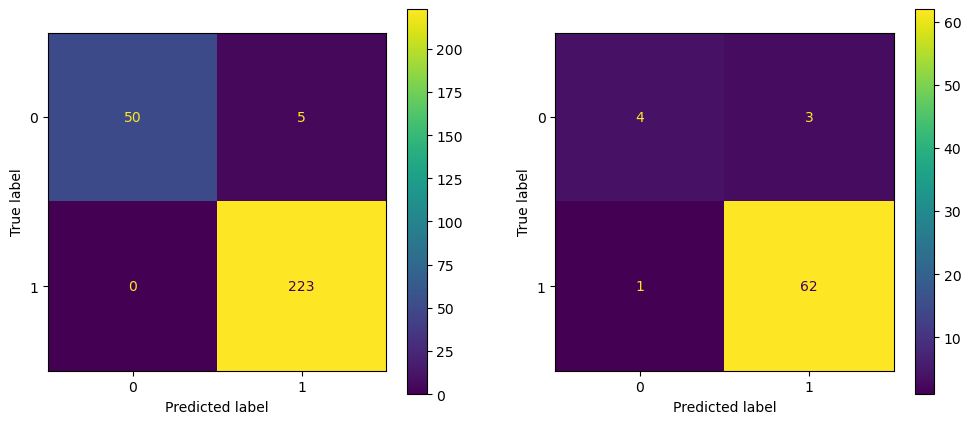

In [493]:
def detailed_objective_x5(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x5_xgb = xgb.XGBClassifier(n_estimators=best_models_x5_xgb_optuna[9].params['n_estimators'],
                                     max_depth=best_models_x5_xgb_optuna[9].params['max_depth'],
                                     learning_rate=best_models_x5_xgb_optuna[9].params['learning_rate'],
                                     subsample=best_models_x5_xgb_optuna[9].params['subsample'],
                                     colsample_bytree=best_models_x5_xgb_optuna[9].params['colsample_bytree'],
                                     gamma=best_models_x5_xgb_optuna[9].params['gamma'],
                                     reg_alpha=best_models_x5_xgb_optuna[9].params['reg_alpha'],
                                     reg_lambda=best_models_x5_xgb_optuna[9].params['reg_lambda'],
                                     min_child_weight=best_models_x5_xgb_optuna[9].params['min_child_weight'],
                                     scale_pos_weight=best_models_x5_xgb_optuna[9].params['scale_pos_weight'],
                                     max_delta_step=best_models_x5_xgb_optuna[9].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x5 = model_x5_xgb.fit(X5_train_spin,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5 = cross_val_score(xgb_spin_optuna_x5,X5_train_spin,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5 = cv_scores_xgb_spin_optuna_x5.mean()

    f1_train_x5_optuna = f1_score(y5_train_spin, model_x5_xgb.predict(X5_train_spin))
    f1_test_x5_optuna = f1_score(y5_test_spin, model_x5_xgb.predict(X5_test_spin))

    f1_train_best_optuna_x5 = f1_score(y5_train_spin,model_x5_xgb.predict(X5_train_spin))
    f1_test_best_optuna_x5 = f1_score(y5_test_spin,model_x5_xgb.predict(X5_test_spin))
    print(f1_train_best_optuna_x5,avg_f1_cv_xgb_spin_optuna_x5,f1_test_best_optuna_x5)

    ## Exporting the results of best trial no 3,4,9 (no best)
    y_pred_x5 = model_x5_xgb.predict(X5_mu)
    out_file_x5 = pd.DataFrame({'y_true': y_spin, 'y_pred_x5': y_pred_x5})
    out_file_x5.to_excel('Results_Mag_States/y_pred_X5_Optuna_9.xlsx',index=False)  
        
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x5 = confusion_matrix(y5_train_spin,xgb_spin_optuna_x5.predict(X5_train_spin))
    cm_test_best_optuna_x5 = confusion_matrix(y5_test_spin,xgb_spin_optuna_x5.predict(X5_test_spin))
    
    disp_train_best_optuna_x5 = ConfusionMatrixDisplay(cm_train_best_optuna_x5)
    disp_test_best_optuna_x5 = ConfusionMatrixDisplay(cm_test_best_optuna_x5)
    
    disp_train_best_optuna_x5.plot(ax=axes[0])
    disp_test_best_optuna_x5.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x5(study_x5_xgb.best_trials[9])

0.9955357142857143 0.7773815959888662 0.9606299212598425


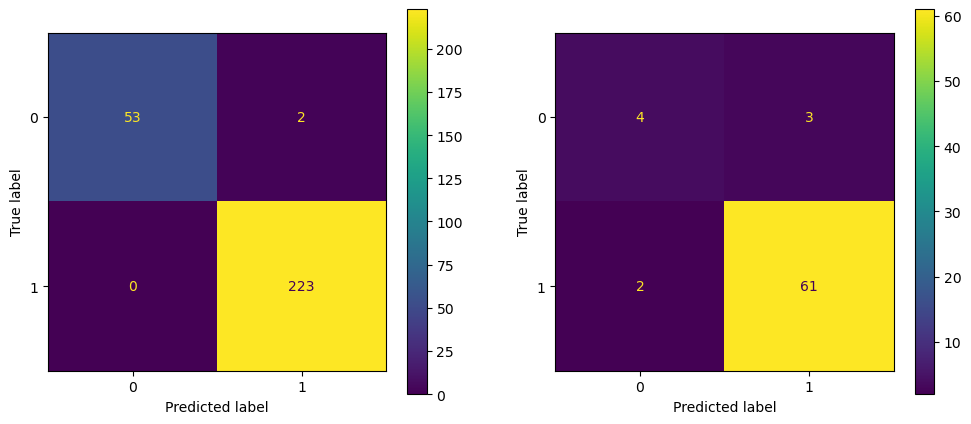

In [422]:
detailed_objective_x5(study_x5_xgb.best_trials[4])

0.9845474613686535 0.785988412906099 0.96875


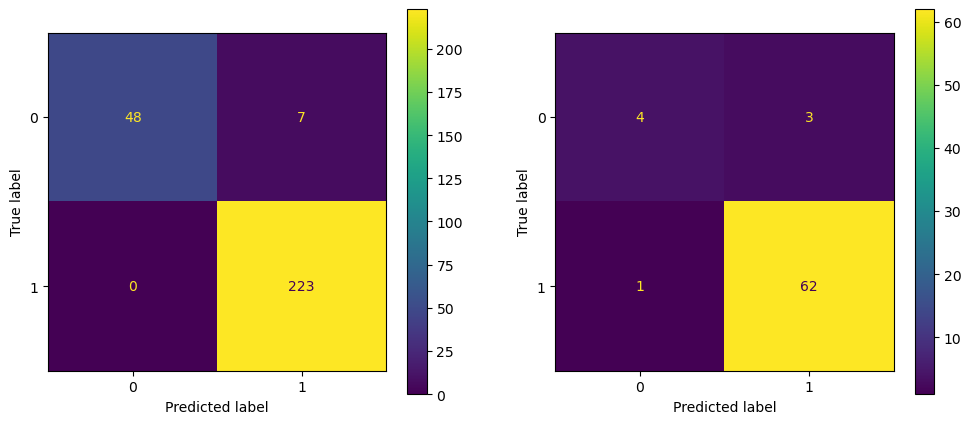

In [420]:
detailed_objective_x5(study_x5_xgb.best_trials[3])

0.9933184855233853 0.7899764019170098 0.9612403100775194


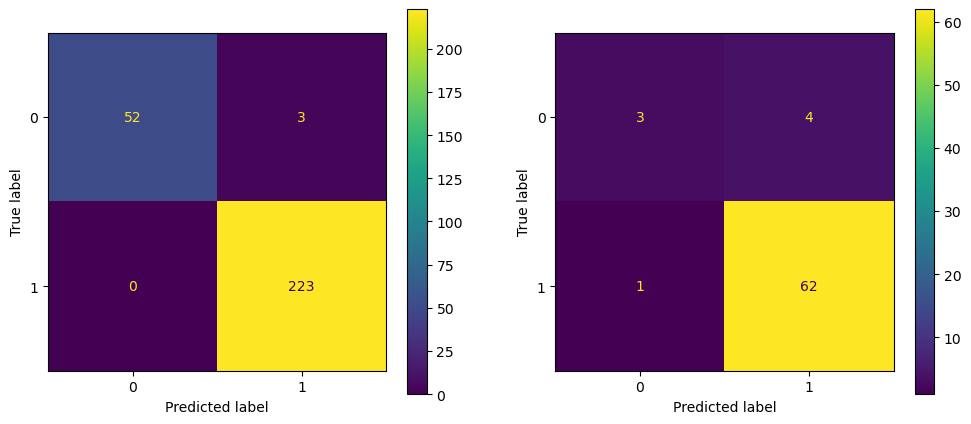

In [297]:
detailed_objective_x5(study_x5_xgb.best_trials[0])

In [298]:
X5_train_spin,X5_test_spin,y5_train_spin,y5_test_spin = train_test_split(X5_mu,y_spin,test_size=0.20,random_state=82)
xgb_spin_be_x5 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)
n_features = X5_train_spin.shape[1]

xgb_spin_sfs_x5 = sfs(xgb_spin_be_x5,forward=False,k_features=(1,n_features),scoring='f1_weighted',cv=cv,verbose=2,n_jobs=-1)

xgb_spin_sfs_x5 = xgb_spin_sfs_x5.fit(X5_train_spin, y5_train_spin)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 113 out of 113 | elapsed:    5.8s finished

[2025-03-08 19:51:12] Features: 112/1 -- score: 0.7857109864936459[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 112 out of 112 | elapsed:    5.1s finished

[2025-03-08 19:51:17] Features: 111/1 -- score: 0.797444803257652[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 111 out of 111 | elapsed:    5.2s finished

[2025-03-08 19:51:22] Features: 110/1 -- score: 0.8103869740088872[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 110

In [299]:
xgb_spin_sfs_x5.get_metric_dict()

{113: {'feature_idx': (0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18,
   19,
   20,
   21,
   22,
   23,
   24,
   25,
   26,
   27,
   28,
   29,
   30,
   31,
   32,
   33,
   34,
   35,
   36,
   37,
   38,
   39,
   40,
   41,
   42,
   43,
   44,
   45,
   46,
   47,
   48,
   49,
   50,
   51,
   52,
   53,
   54,
   55,
   56,
   57,
   58,
   59,
   60,
   61,
   62,
   63,
   64,
   65,
   66,
   67,
   68,
   69,
   70,
   71,
   72,
   73,
   74,
   75,
   76,
   77,
   78,
   79,
   80,
   81,
   82,
   83,
   84,
   85,
   86,
   87,
   88,
   89,
   90,
   91,
   92,
   93,
   94,
   95,
   96,
   97,
   98,
   99,
   100,
   101,
   102,
   103,
   104,
   105,
   106,
   107,
   108,
   109,
   110,
   111,
   112),
  'cv_scores': array([0.77996422, 0.78061224, 0.68074534, 0.79599567, 0.82456443]),
  'avg_score': 0.7723763818421494,
  'feature_names': ('max_vdw_radius',
   'min_vdw_radius',
   'avg

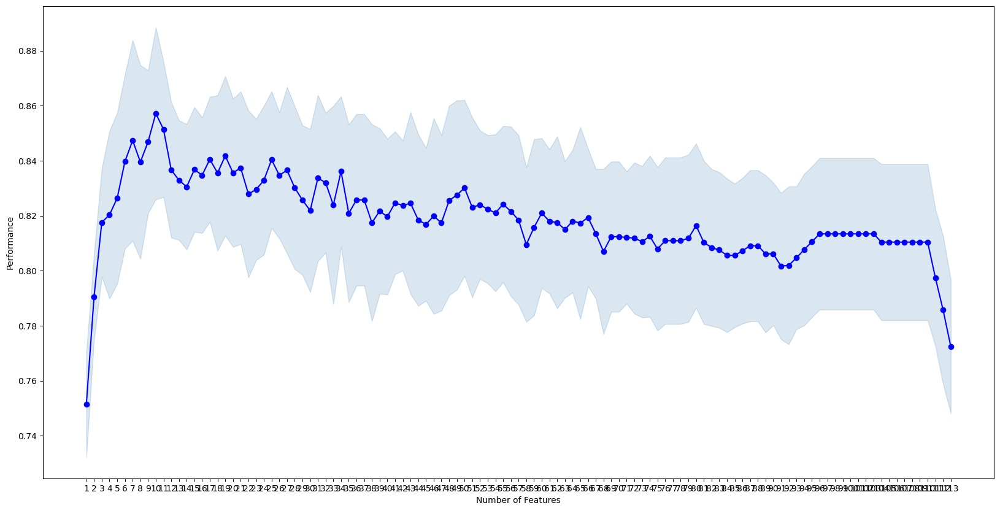

In [300]:
fig = plot_sfs(xgb_spin_sfs_x5.get_metric_dict(),kind='std_err',figsize=(20,10))
plt.show()

In [301]:
xgb_spin_sfs_x5.k_feature_idx_

(10, 14, 22, 40, 43, 52, 80, 89, 93, 112)

In [302]:
print(xgb_spin_sfs_x5.k_feature_names_)
print(len(xgb_spin_sfs_x5.k_feature_names_))

('max_diff_vdw_radius', 'delta_b14b58_avg_covalent_radius', 'delta_a12b58_avg_atomic_radius', 'avg_a12b14_val_electrons', 'std_unp_electrons', 'std_ion_energies', 'delta_a12x914_avg_atomic_mass', 'std_mendeleev_number', 'delta_bx1418bx58914_avg_mendeleev_number', 'avg_a12b58_heat_of_formation')
10


In [303]:
X5_mu_be_xgb = X5_mu[[i for i in xgb_spin_sfs_x5.k_feature_names_]]
X5_train_spin_be_xgb = X5_train_spin[[i for i in xgb_spin_sfs_x5.k_feature_names_]]
X5_test_spin_be_xgb = X5_test_spin[[i for i in xgb_spin_sfs_x5.k_feature_names_]]

In [304]:
def find_extra_element(tuple1,tuple2):
    set1 = set(tuple1)
    set2 = set(tuple2)
    
    extra_element = (set1 - set2).pop()
    return extra_element

for i in range(len(xgb_spin_sfs_x5.get_metric_dict())):
    j = i+1
    if j==X5_mu.shape[1]:
        eliminated_feature_index = 'None'
        eliminated_feature = 'None'
    else:
        eliminated_feature_index = find_extra_element(xgb_spin_sfs_x5.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x5.get_metric_dict()[j]['feature_idx'])
        eliminated_feature = X5_mu.columns[eliminated_feature_index]
    print(j,eliminated_feature_index,eliminated_feature,xgb_spin_sfs_x5.get_metric_dict()[j]['avg_score'],xgb_spin_sfs_x5.get_metric_dict()[j]['ci_bound'],xgb_spin_sfs_x5.get_metric_dict()[j]['std_dev'],xgb_spin_sfs_x5.get_metric_dict()[j]['std_err'])

1 80 delta_a12x914_avg_atomic_mass 0.7513418311568174 0.04891361183922295 0.03805645178155943 0.019028225890779713
2 40 avg_a12b14_val_electrons 0.79056884864045 0.04037707877027386 0.03141473903730362 0.01570736951865181
3 22 delta_a12b58_avg_atomic_radius 0.8175517092301237 0.05062948555607779 0.039391459827650355 0.019695729913825177
4 52 std_ion_energies 0.820324957320539 0.07835238067200773 0.060960814073917714 0.030480407036958857
5 10 max_diff_vdw_radius 0.8263814101432082 0.07988949916120767 0.06215674447993762 0.031078372239968805
6 93 delta_bx1418bx58914_avg_mendeleev_number 0.8396915028455127 0.08143015054441816 0.06335542359752278 0.03167771179876138
7 43 std_unp_electrons 0.8473551098804671 0.09381556963234612 0.07299170042499215 0.03649585021249607
8 14 delta_b14b58_avg_covalent_radius 0.839486022894331 0.0904672370667156 0.07038658393407779 0.035193291967038895
9 89 std_mendeleev_number 0.8468737286704495 0.06681209785441411 0.051982081977075545 0.025991040988537772
10 1

In [305]:
iteration_be_xgb_x5 = []
eliminated_feature_index_be_xgb_x5 = []
eliminated_feature_be_xgb_x5 = []
avg_cv_F1_score_be_xgb_x5 = []
ci_bound_be_xgb_x5 = []
std_dev_be_xgb_x5 = []
std_err_be_xgb_x5 = []

for i in range(len(xgb_spin_sfs_x5.get_metric_dict())):
    j = i+1
    iteration_be_xgb_x5.append(j)
    if j==X5_mu.shape[1]:
        eliminated_feature_index_be_xgb_x5.append('None')
        eliminated_feature_be_xgb_x5.append('None')
    else:
        elim_feat_index_for_feat_be_xgb_x5 = find_extra_element(xgb_spin_sfs_x5.get_metric_dict()[j+1]['feature_idx'],xgb_spin_sfs_x5.get_metric_dict()[j]['feature_idx'])
        eliminated_feature_index_be_xgb_x5.append(elim_feat_index_for_feat_be_xgb_x5)
        eliminated_feature_be_xgb_x5.append(X5_mu.columns[elim_feat_index_for_feat_be_xgb_x5])

    avg_cv_F1_score_be_xgb_x5.append(xgb_spin_sfs_x5.get_metric_dict()[j]['avg_score'])
    ci_bound_be_xgb_x5.append(xgb_spin_sfs_x5.get_metric_dict()[j]['ci_bound'])
    std_dev_be_xgb_x5.append(xgb_spin_sfs_x5.get_metric_dict()[j]['std_dev'])
    std_err_be_xgb_x5.append(xgb_spin_sfs_x5.get_metric_dict()[j]['std_err'])

In [306]:
training_history_be_xgb_x5 = pd.DataFrame({
    'iteration':iteration_be_xgb_x5,
    'eliminated_feature_index': eliminated_feature_index_be_xgb_x5,
    'eliminated_feature': eliminated_feature_be_xgb_x5,
    'avg_cv_F1_score': avg_cv_F1_score_be_xgb_x5,
    'ci_bound_be': ci_bound_be_xgb_x5,
    'std_dev_be': std_dev_be_xgb_x5,
    'std_err_be': std_err_be_xgb_x5
})

training_history_be_xgb_x5.to_csv('Results_Mag_States/XGB_X5_training_history.csv',index=False)

0.9964150392410033 0.8571765082646419 0.8919354838709677


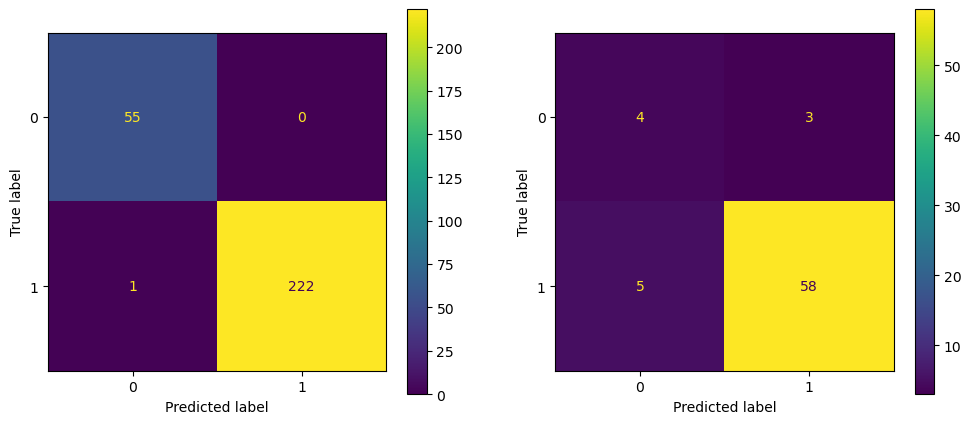

In [307]:
model_xgb_from_be_x5 = xgb.XGBClassifier(random_state=82)
cv = KFold(n_splits=5,shuffle=True,random_state=82)

xgb_from_be_x5 = model_xgb_from_be_x5.fit(X5_train_spin_be_xgb, y5_train_spin)

cv_scores_xgb_from_be_x5 = cross_val_score(xgb_from_be_x5,X5_train_spin_be_xgb,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_from_be_x5 = cv_scores_xgb_from_be_x5.mean()

f1_train_xgb_from_be_x5 = f1_score(y5_train_spin,model_xgb_from_be_x5.predict(X5_train_spin_be_xgb), average='weighted')
f1_test_xgb_from_be_x5 = f1_score(y5_test_spin,model_xgb_from_be_x5.predict(X5_test_spin_be_xgb), average='weighted')
print(f1_train_xgb_from_be_x5,avg_f1_cv_xgb_from_be_x5,f1_test_xgb_from_be_x5)

fig,axes = plt.subplots(1,2,figsize=(12,5))

cm_train_xgb_from_be_x5 = confusion_matrix(y5_train_spin,xgb_from_be_x5.predict(X5_train_spin_be_xgb))
cm_test_xgb_from_be_x5 = confusion_matrix(y5_test_spin,xgb_from_be_x5.predict(X5_test_spin_be_xgb))

disp_train_xgb_from_be_x5 = ConfusionMatrixDisplay(cm_train_xgb_from_be_x5)
disp_test_xgb_from_be_x5 = ConfusionMatrixDisplay(cm_test_xgb_from_be_x5)

disp_train_xgb_from_be_x5.plot(ax=axes[0])
disp_test_xgb_from_be_x5.plot(ax=axes[1])

plt.show()

In [309]:
import optuna
import random

def objective_x5_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x5_xgb = xgb.XGBClassifier(n_estimators=n_estimators,max_depth=max_depth,learning_rate=learning_rate,subsample=subsample,
                                     colsample_bytree=colsample_bytree,gamma=gamma,reg_alpha=reg_alpha,reg_lambda=reg_lambda,
                                     min_child_weight=min_child_weight,scale_pos_weight=scale_pos_weight,max_delta_step=max_delta_step,
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x5_be = model_be_x5_xgb.fit(X5_train_spin_be_xgb,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5_be = cross_val_score(xgb_spin_optuna_x5_be,X5_train_spin_be_xgb,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5_be = cv_scores_xgb_spin_optuna_x5_be.mean()

    # Return best F1 scores
    f1_train_x5_be = f1_score(y5_train_spin, model_be_x5_xgb.predict(X5_train_spin_be_xgb),average='weighted')
    f1_test_x5_be = f1_score(y5_test_spin, model_be_x5_xgb.predict(X5_test_spin_be_xgb),average='weighted')
    return f1_train_x5_be,avg_f1_cv_xgb_spin_optuna_x5_be,f1_test_x5_be
# return avg_f1_cv_et_spin_optunax5

# Run Optuna optimization
#study = optuna.create_study(direction='minimize') # for minimizing loss
study_be_x5_xgb = optuna.create_study(directions = ['maximize','maximize','maximize'])
study_be_x5_xgb.optimize(objective_x5_be, n_trials=300)

[I 2025-03-08 20:01:45,759] A new study created in memory with name: no-name-3564123c-2abb-4265-8a9f-85a5c5c23b01
[I 2025-03-08 20:01:49,637] Trial 0 finished with values: [0.782802721237644, 0.7458580356406419, 0.8984615384615385] and parameters: {'n_estimators': 32, 'max_depth': 7, 'learning_rate': 0.22422507139271533, 'subsample': 0.666423969615367, 'colsample_bytree': 0.7655810204215128, 'gamma': 1.8564828948688272, 'reg_alpha': 1.968169883907647, 'reg_lambda': 0.00012722185025850396, 'min_child_weight': 9, 'scale_pos_weight': 2, 'max_delta_step': 5.769421249701601}.
[I 2025-03-08 20:01:51,588] Trial 1 finished with values: [0.8087654273880799, 0.7818456371687803, 0.9100932994062766] and parameters: {'n_estimators': 44, 'max_depth': 43, 'learning_rate': 0.23045264781943833, 'subsample': 0.76247650871163, 'colsample_bytree': 0.6590821930147807, 'gamma': 3.057289569375606, 'reg_alpha': 0.02907866232570755, 'reg_lambda': 0.14549756635193276, 'min_child_weight': 6, 'scale_pos_weight': 

In [310]:
best_models_x5_be_xgb = study_be_x5_xgb.best_trials
for i in range(len(best_models_x5_be_xgb)):
    print('\n',i)
    print('Trial number: ', best_models_x5_be_xgb[i].number)
    print('F1 scores: ', best_models_x5_be_xgb[i].values)
    print('Parameters: ', best_models_x5_be_xgb[i].params)


 0
Trial number:  145
F1 scores:  [0.9779379355603333, 0.793899246581017, 0.9261053906723197]
Parameters:  {'n_estimators': 63, 'max_depth': 33, 'learning_rate': 0.07225101822587998, 'subsample': 0.9490505040680469, 'colsample_bytree': 0.7906246891530062, 'gamma': 0.1804231901524378, 'reg_alpha': 1.0011924037903022e-05, 'reg_lambda': 0.0012555171747170787, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 1.0786198726009366}

 1
Trial number:  151
F1 scores:  [0.9259160271924254, 0.8193805750409068, 0.9385416666666667]
Parameters:  {'n_estimators': 111, 'max_depth': 25, 'learning_rate': 0.23045264781943833, 'subsample': 0.6366966920406492, 'colsample_bytree': 0.9220045494893871, 'gamma': 2.1477869380514516, 'reg_alpha': 3.401214988311908e-08, 'reg_lambda': 5.387667387247355e-07, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 0.8307272259391985}

 2
Trial number:  187
F1 scores:  [0.9816858581554142, 0.836262582960121, 0.8965475469412478]
Parameters:  {'

In [614]:
best_models_x5_be_xgb_pd = pd.DataFrame({'Trial number': [best_models_x5_be_xgb[i].number for i in range(len(best_models_x5_be_xgb))],
                                             'Train F1': [best_models_x5_be_xgb[i].values[0] for i in range(len(best_models_x5_be_xgb))],
                                             'Test F1': [best_models_x5_be_xgb[i].values[2] for i in range(len(best_models_x5_be_xgb))],
                                             'CV F1': [best_models_x5_be_xgb[i].values[1] for i in range(len(best_models_x5_be_xgb))],
                                             'n_estimators': [best_models_x5_be_xgb[i].params['n_estimators'] for i in range(len(best_models_x5_be_xgb))],
                                             'max_depth': [best_models_x5_be_xgb[i].params['max_depth'] for i in range(len(best_models_x5_be_xgb))],
                                             'learning_rate': [best_models_x5_be_xgb[i].params['learning_rate'] for i in range(len(best_models_x5_be_xgb))],
                                             'subsample': [best_models_x5_be_xgb[i].params['subsample'] for i in range(len(best_models_x5_be_xgb))],
                                             'colsample_bytree': [best_models_x5_be_xgb[i].params['colsample_bytree'] for i in range(len(best_models_x5_be_xgb))],
                                             'gamma': [best_models_x5_be_xgb[i].params['gamma'] for i in range(len(best_models_x5_be_xgb))],
                                             'reg_alpha': [best_models_x5_be_xgb[i].params['reg_alpha'] for i in range(len(best_models_x5_be_xgb))],
                                             'reg_lambda': [best_models_x5_be_xgb[i].params['reg_lambda'] for i in range(len(best_models_x5_be_xgb))],
                                             'min_child_weight': [best_models_x5_be_xgb[i].params['min_child_weight'] for i in range(len(best_models_x5_be_xgb))],
                                             'scale_pos_weight': [best_models_x5_be_xgb[i].params['scale_pos_weight'] for i in range(len(best_models_x5_be_xgb))],
                                             'max_delta_step': [best_models_x5_be_xgb[i].params['max_delta_step'] for i in range(len(best_models_x5_be_xgb))]
                                            })
best_models_x5_be_xgb_pd.to_excel('Results_Mag_States/XGBoost_Classifier_X5_BE_HP_Optuna.xlsx')

In [615]:
#  0
# Trial number:  145
# F1 scores:  [0.9779379355603333, 0.793899246581017, 0.9261053906723197]
# Parameters:  {'n_estimators': 63, 'max_depth': 33, 'learning_rate': 0.07225101822587998, 'subsample': 0.9490505040680469, 'colsample_bytree': 0.7906246891530062, 'gamma': 0.1804231901524378, 'reg_alpha': 1.0011924037903022e-05, 'reg_lambda': 0.0012555171747170787, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 1.0786198726009366}

#  1
# Trial number:  151
# F1 scores:  [0.9259160271924254, 0.8193805750409068, 0.9385416666666667]
# Parameters:  {'n_estimators': 111, 'max_depth': 25, 'learning_rate': 0.23045264781943833, 'subsample': 0.6366966920406492, 'colsample_bytree': 0.9220045494893871, 'gamma': 2.1477869380514516, 'reg_alpha': 3.401214988311908e-08, 'reg_lambda': 5.387667387247355e-07, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 0.8307272259391985}

#  2
# Trial number:  187
# F1 scores:  [0.9816858581554142, 0.836262582960121, 0.8965475469412478]
# Parameters:  {'n_estimators': 77, 'max_depth': 33, 'learning_rate': 0.16342634133878978, 'subsample': 0.9490505040680469, 'colsample_bytree': 0.7906246891530062, 'gamma': 0.1804231901524378, 'reg_alpha': 0.31664105028146533, 'reg_lambda': 0.0309113781400845, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 3.5016951620442347}

#  3
# Trial number:  206
# F1 scores:  [0.9128312734427841, 0.8103168233161091, 0.9517970401691331]
# Parameters:  {'n_estimators': 129, 'max_depth': 27, 'learning_rate': 0.2753374487559717, 'subsample': 0.26768266112974726, 'colsample_bytree': 0.4519575028103403, 'gamma': 2.0003502923816807, 'reg_alpha': 0.5530694453720676, 'reg_lambda': 4.3618155478757197e-08, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 1.5151684959648304}

#  4
# Trial number:  213
# F1 scores:  [0.989093403586146, 0.8331043726868975, 0.9142857142857143]
# Parameters:  {'n_estimators': 77, 'max_depth': 33, 'learning_rate': 0.16342634133878978, 'subsample': 0.9490505040680469, 'colsample_bytree': 0.7906246891530062, 'gamma': 0.1804231901524378, 'reg_alpha': 0.01964661540858804, 'reg_lambda': 0.0309113781400845, 'min_child_weight': 2, 'scale_pos_weight': 9, 'max_delta_step': 3.5016951620442347}

#  5
# Trial number:  214
# F1 scores:  [0.966503672266191, 0.7957559905716017, 0.919661733615222]
# Parameters:  {'n_estimators': 63, 'max_depth': 33, 'learning_rate': 0.07225101822587998, 'subsample': 0.9490505040680469, 'colsample_bytree': 0.4966784065014276, 'gamma': 0.1804231901524378, 'reg_alpha': 1.0011924037903022e-05, 'reg_lambda': 0.0012555171747170787, 'min_child_weight': 1, 'scale_pos_weight': 10, 'max_delta_step': 1.0786198726009366}

#  6
# Trial number:  254
# F1 scores:  [0.9172468872338552, 0.8396804337047341, 0.9078125]
# Parameters:  {'n_estimators': 129, 'max_depth': 17, 'learning_rate': 0.16348860156697537, 'subsample': 0.43447014380751003, 'colsample_bytree': 0.4519575028103403, 'gamma': 2.0003502923816807, 'reg_alpha': 4.3367428874598415e-08, 'reg_lambda': 0.0019480186010421834, 'min_child_weight': 1, 'scale_pos_weight': 3, 'max_delta_step': 1.5151684959648304}

#  7
# Trial number:  267
# F1 scores:  [0.9963904007635588, 0.8260734040877136, 0.9029333333333333]
# Parameters:  {'n_estimators': 100, 'max_depth': 27, 'learning_rate': 0.2753374487559717, 'subsample': 0.855822887126064, 'colsample_bytree': 0.7655810204215128, 'gamma': 0.1804231901524378, 'reg_alpha': 4.3367428874598415e-08, 'reg_lambda': 0.0012555171747170787, 'min_child_weight': 2, 'scale_pos_weight': 2, 'max_delta_step': 7.414592788797844}

#  8
# Trial number:  272
# F1 scores:  [0.938544439386319, 0.7999941495914643, 0.9261053906723197]
# Parameters:  {'n_estimators': 147, 'max_depth': 20, 'learning_rate': 0.23676983512001218, 'subsample': 0.5298700700979188, 'colsample_bytree': 0.802098218747343, 'gamma': 2.1477869380514516, 'reg_alpha': 0.015805869826750044, 'reg_lambda': 0.08492686668886779, 'min_child_weight': 2, 'scale_pos_weight': 7, 'max_delta_step': 5.416233431603539}

0.989093403586146 0.8331043726868975 0.9142857142857143


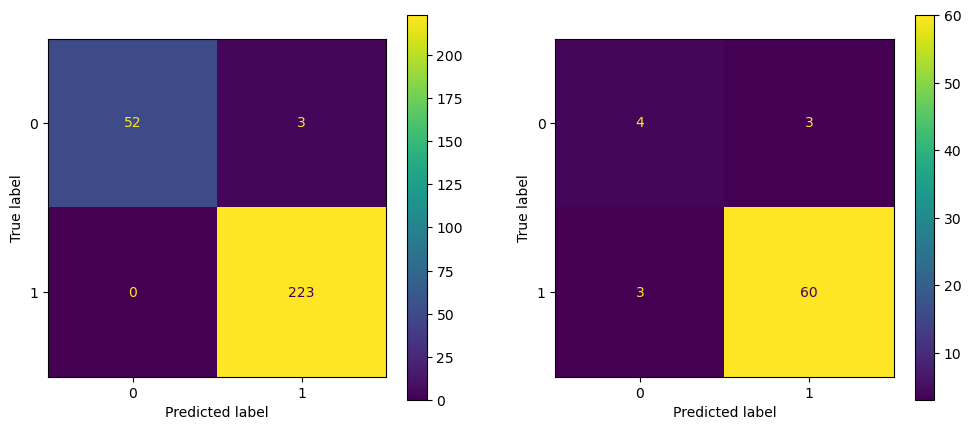

In [498]:
def detailed_objective_x5_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x5_xgb = xgb.XGBClassifier(n_estimators=best_models_x5_be_xgb[4].params['n_estimators'],
                                     max_depth=best_models_x5_be_xgb[4].params['max_depth'],
                                     learning_rate=best_models_x5_be_xgb[4].params['learning_rate'],
                                     subsample=best_models_x5_be_xgb[4].params['subsample'],
                                     colsample_bytree=best_models_x5_be_xgb[4].params['colsample_bytree'],
                                     gamma=best_models_x5_be_xgb[4].params['gamma'],
                                     reg_alpha=best_models_x5_be_xgb[4].params['reg_alpha'],
                                     reg_lambda=best_models_x5_be_xgb[4].params['reg_lambda'],
                                     min_child_weight=best_models_x5_be_xgb[4].params['min_child_weight'],
                                     scale_pos_weight=best_models_x5_be_xgb[4].params['scale_pos_weight'],
                                     max_delta_step=best_models_x5_be_xgb[4].params['max_delta_step'],
                                     random_state=random_state)
    # Train model
    xgb_spin_optuna_x5_be = model_be_x5_xgb.fit(X5_train_spin_be_xgb,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5_be = cross_val_score(xgb_spin_optuna_x5_be,X5_train_spin_be_xgb,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5_be = cv_scores_xgb_spin_optuna_x5_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y5_train_spin,model_be_x5_xgb.predict(X5_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y5_test_spin,model_be_x5_xgb.predict(X5_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x5_be,f1_test_xgb_best_optuna_be)
    
    ## Exporting the results of best trial no 0,4 (no best)
    y_pred_x5_be = model_be_x5_xgb.predict(X5_mu_be_xgb)
    out_file_x5_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x5_be': y_pred_x5_be})
    out_file_x5_be.to_excel('Results_Mag_States/y_pred_X5_be_Optuna_4.xlsx',index=False)     

    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y5_train_spin,xgb_spin_optuna_x5_be.predict(X5_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y5_test_spin,xgb_spin_optuna_x5_be.predict(X5_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

detailed_objective_x5_be(study_be_x5_xgb.best_trials[4])

0.938544439386319 0.7999941495914643 0.9261053906723197


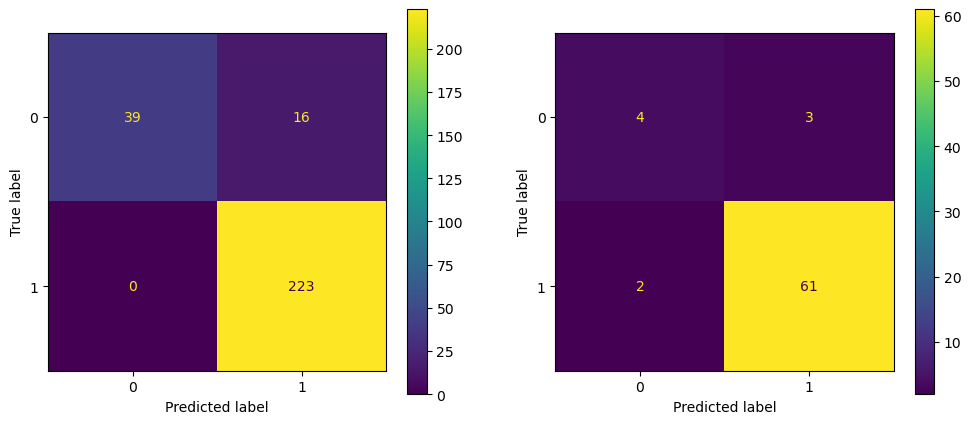

In [497]:
detailed_objective_x5_be(study_be_x5_xgb.best_trials[8])

0.9779379355603333 0.793899246581017 0.9261053906723197


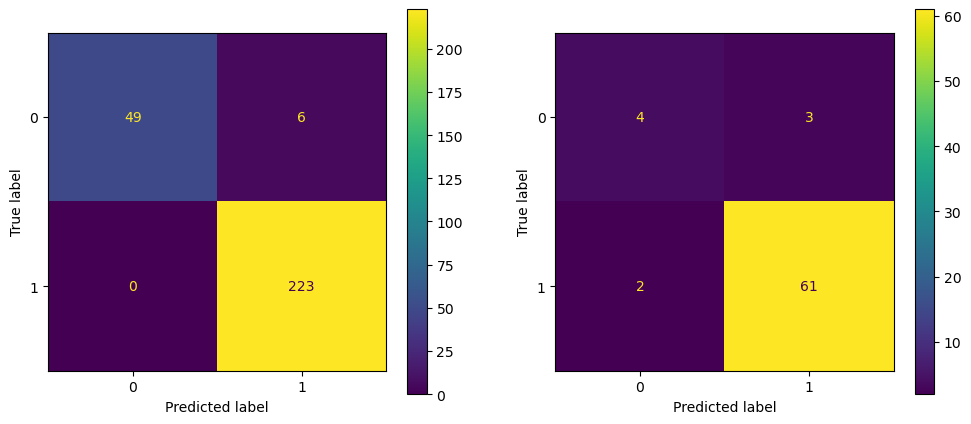

In [312]:
detailed_objective_x5_be(study_be_x5_xgb.best_trials[0])

In [455]:
## AUC using the best models

In [456]:
## Using X1

In [501]:
model_test.predict_proba(X1_test_spin)[:,1]

array([0.9983059 , 0.99652475, 0.6109374 , 0.99911386, 0.9950741 ,
       0.72502154, 0.9989017 , 0.9998629 , 0.9925518 , 0.9975738 ,
       0.99958974, 0.9989029 , 0.99358785, 0.99736756, 0.9952911 ,
       0.9332856 , 0.9989008 , 0.8678203 , 0.22934711, 0.9979444 ,
       0.99597025, 0.9997081 , 0.999129  , 0.9984036 , 0.84121615,
       0.9858086 , 0.66372794, 0.988213  , 0.9991591 , 0.20320031,
       0.98625284, 0.9994709 , 0.9915609 , 0.99840754, 0.99731076,
       0.99962103, 0.99964964, 0.9807582 , 0.02422539, 0.00973925,
       0.98721826, 0.99967504, 0.9994166 , 0.9990658 , 0.9961138 ,
       0.17986034, 0.08762192, 0.9391406 , 0.12816921, 0.9991179 ,
       0.9948309 , 0.99881506, 0.96197987, 0.99368894, 0.99960977,
       0.9998599 , 0.9971016 , 0.9992925 , 0.99934787, 0.9980558 ,
       0.02552964, 0.99822   , 0.9987882 , 0.99965775, 0.49951565,
       0.23282789, 0.49021122, 0.96897584, 0.9921182 , 0.09759317],
      dtype=float32)

In [502]:
model_test.predict_proba(X1_test_spin)

array([[1.6940832e-03, 9.9830592e-01],
       [3.4752488e-03, 9.9652475e-01],
       [3.8906258e-01, 6.1093742e-01],
       [8.8614225e-04, 9.9911386e-01],
       [4.9259067e-03, 9.9507409e-01],
       [2.7497846e-01, 7.2502154e-01],
       [1.0982752e-03, 9.9890172e-01],
       [1.3709068e-04, 9.9986291e-01],
       [7.4481964e-03, 9.9255180e-01],
       [2.4262071e-03, 9.9757379e-01],
       [4.1025877e-04, 9.9958974e-01],
       [1.0970831e-03, 9.9890292e-01],
       [6.4121485e-03, 9.9358785e-01],
       [2.6324391e-03, 9.9736756e-01],
       [4.7088861e-03, 9.9529111e-01],
       [6.6714406e-02, 9.3328559e-01],
       [1.0992289e-03, 9.9890077e-01],
       [1.3217968e-01, 8.6782032e-01],
       [7.7065289e-01, 2.2934711e-01],
       [2.0555854e-03, 9.9794441e-01],
       [4.0297508e-03, 9.9597025e-01],
       [2.9188395e-04, 9.9970812e-01],
       [8.7100267e-04, 9.9912900e-01],
       [1.5963912e-03, 9.9840361e-01],
       [1.5878385e-01, 8.4121615e-01],
       [1.4191389e-02, 9.

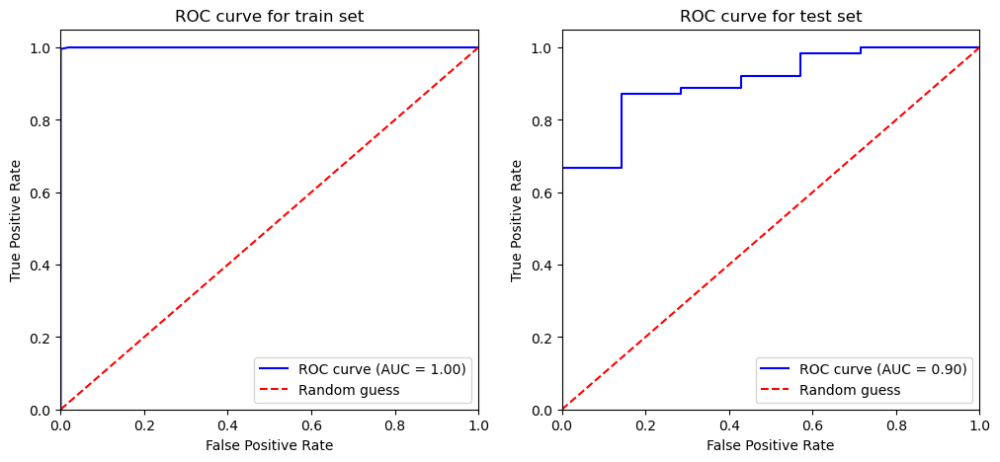

In [516]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Initialize and train the XGBoost classifier
model_test = XGBClassifier(random_state=42)
model_test.fit(X1_train_spin, y1_train_spin)

# Make predictions on the test set
y1_pred_proba_train = model_test.predict_proba(X1_train_spin)[:, 1]

y1_pred_proba_test = model_test.predict_proba(X1_test_spin)[:, 1]

# Calculate the false positive rate, true positive rate, and thresholds
fpr_train, tpr_train, thresholds_train = roc_curve(y1_train_spin, y1_pred_proba_train)
fpr_test, tpr_test, thresholds_test = roc_curve(y1_test_spin, y1_pred_proba_test)

# Calculate the area under the ROC curve (AUC)
roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

# Plot the ROC curve
fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
ax1.plot(fpr_train, tpr_train, color='blue', label=f'ROC curve (AUC = {roc_auc_train:.2f})')
ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
ax1.set_xlim([0.0, 1.0])
ax1.set_ylim([0.0, 1.05])
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.set_title('ROC curve for train set')
ax1.legend(loc="lower right")

ax2.plot(fpr_test, tpr_test, color='blue', label=f'ROC curve (AUC = {roc_auc_test:.2f})')
ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
ax2.set_xlim([0.0, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('ROC curve for test set')
ax2.legend(loc="lower right")

plt.show()

0.9911111111111112 0.7696401739571266 0.9682539682539683


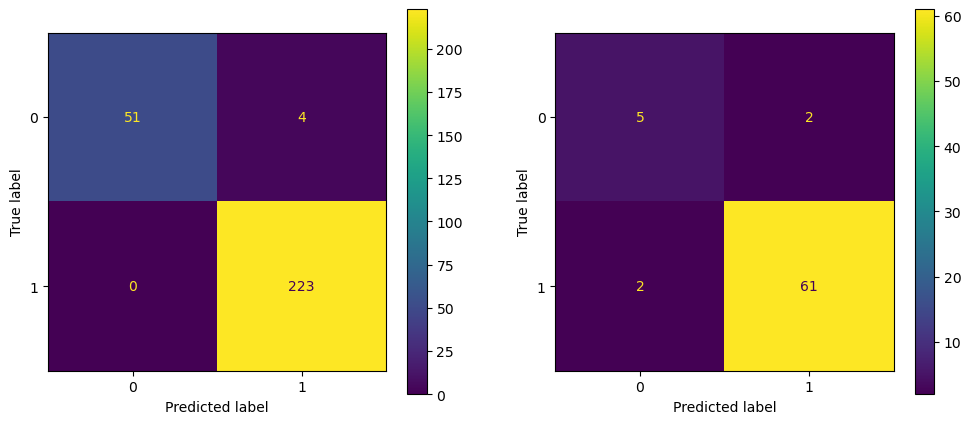

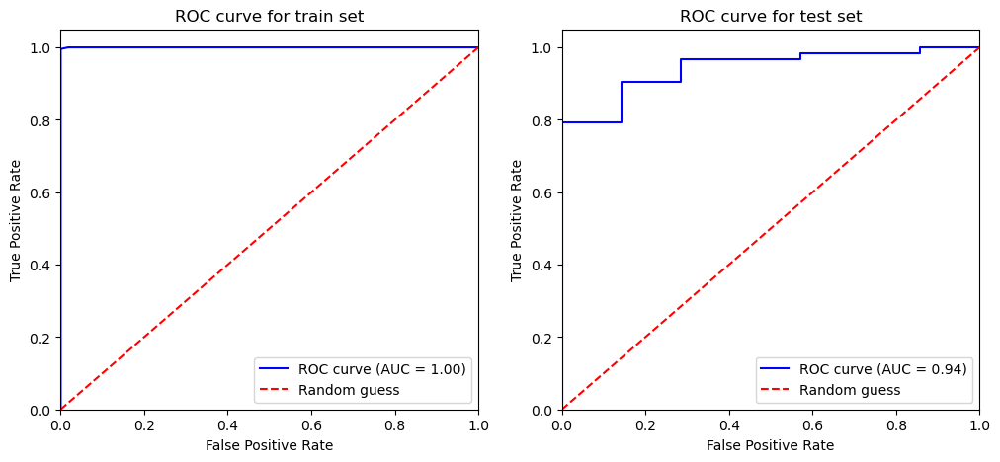

In [518]:
def detailed_objective_ROC_AUC_x1(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x1_xgb = xgb.XGBClassifier(n_estimators=best_models_x1_xgb_optuna[16].params['n_estimators'],
                                     max_depth=best_models_x1_xgb_optuna[16].params['max_depth'],
                                     learning_rate=best_models_x1_xgb_optuna[16].params['learning_rate'],
                                     subsample=best_models_x1_xgb_optuna[16].params['subsample'],
                                     colsample_bytree=best_models_x1_xgb_optuna[16].params['colsample_bytree'],
                                     gamma=best_models_x1_xgb_optuna[16].params['gamma'],
                                     reg_alpha=best_models_x1_xgb_optuna[16].params['reg_alpha'],
                                     reg_lambda=best_models_x1_xgb_optuna[16].params['reg_lambda'],
                                     min_child_weight=best_models_x1_xgb_optuna[16].params['min_child_weight'],
                                     scale_pos_weight=best_models_x1_xgb_optuna[16].params['scale_pos_weight'],
                                     max_delta_step=best_models_x1_xgb_optuna[16].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x1 = model_x1_xgb.fit(X1_train_spin,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1 = cross_val_score(xgb_spin_optuna_x1,X1_train_spin,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1 = cv_scores_xgb_spin_optuna_x1.mean()

    f1_train_x1_optuna = f1_score(y1_train_spin, model_x1_xgb.predict(X1_train_spin))
    f1_test_x1_optuna = f1_score(y1_test_spin, model_x1_xgb.predict(X1_test_spin))

    f1_train_best_optuna_x1 = f1_score(y1_train_spin,model_x1_xgb.predict(X1_train_spin))
    f1_test_best_optuna_x1 = f1_score(y1_test_spin,model_x1_xgb.predict(X1_test_spin))
    print(f1_train_best_optuna_x1,avg_f1_cv_xgb_spin_optuna_x1,f1_test_best_optuna_x1)

    ## Exporting the results of best trial no 16
    
    # y_pred_x1 = model_x1_xgb.predict(X1_mu)
    # out_file_x1 = pd.DataFrame({'y_true': y_spin, 'y_pred_x1': y_pred_x1})
    # out_file_x1.to_excel('Results_Mag_States/y_pred_X1_Optuna_16.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x1 = confusion_matrix(y1_train_spin,xgb_spin_optuna_x1.predict(X1_train_spin))
    cm_test_best_optuna_x1 = confusion_matrix(y1_test_spin,xgb_spin_optuna_x1.predict(X1_test_spin))
    
    disp_train_best_optuna_x1 = ConfusionMatrixDisplay(cm_train_best_optuna_x1)
    disp_test_best_optuna_x1 = ConfusionMatrixDisplay(cm_test_best_optuna_x1)
    
    disp_train_best_optuna_x1.plot(ax=axes[0])
    disp_test_best_optuna_x1.plot(ax=axes[1])    
    plt.show()

    ## ROC curve

    y1_pred_proba_train_xgb_x1 = xgb_spin_optuna_x1.predict_proba(X1_train_spin)[:, 1]
    y1_pred_proba_test_xgb_x1 = xgb_spin_optuna_x1.predict_proba(X1_test_spin)[:, 1]
    
    fpr_train_xgb_x1, tpr_train_xgb_x1, thresholds_train_xgb_x1 = roc_curve(y1_train_spin, y1_pred_proba_train_xgb_x1)
    fpr_test_xgb_x1, tpr_test_xgb_x1, thresholds_test_xgb_x1 = roc_curve(y1_test_spin, y1_pred_proba_test_xgb_x1)
    
    roc_auc_train_xgb_x1 = auc(fpr_train_xgb_x1, tpr_train_xgb_x1)
    roc_auc_test_xgb_x1 = auc(fpr_test_xgb_x1, tpr_test_xgb_x1)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x1, tpr_train_xgb_x1, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x1:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x1, tpr_test_xgb_x1, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x1:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

detailed_objective_ROC_AUC_x1(study_x1_xgb.best_trials[16])

0.978105968055744 0.8160159318686672 0.9142857142857143


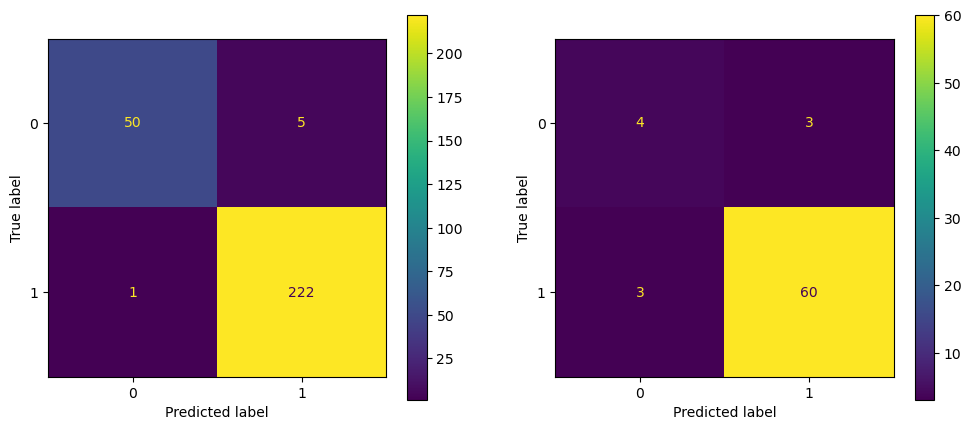

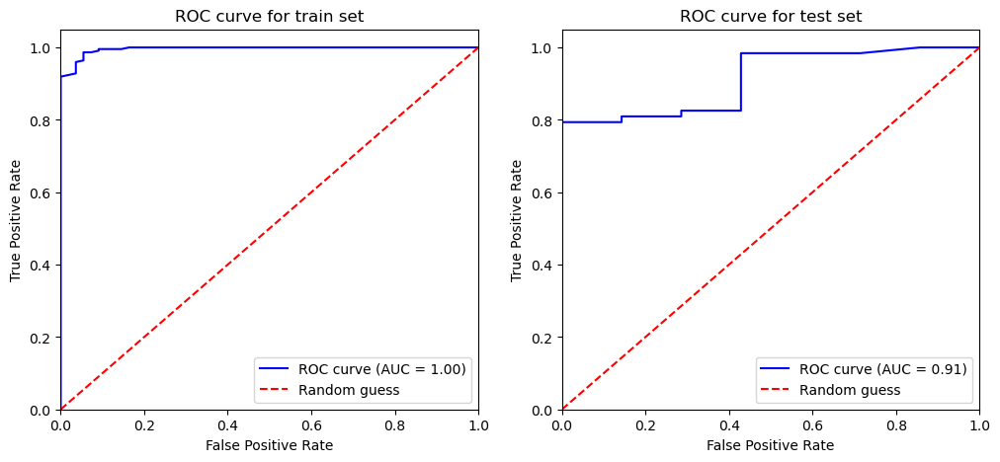

In [522]:
def detailed_objective_ROC_AUC_x1_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x1_xgb = xgb.XGBClassifier(n_estimators=best_models_x1_be_xgb[4].params['n_estimators'],
                                     max_depth=best_models_x1_be_xgb[4].params['max_depth'],
                                     learning_rate=best_models_x1_be_xgb[4].params['learning_rate'],
                                     subsample=best_models_x1_be_xgb[4].params['subsample'],
                                     colsample_bytree=best_models_x1_be_xgb[4].params['colsample_bytree'],
                                     gamma=best_models_x1_be_xgb[4].params['gamma'],
                                     reg_alpha=best_models_x1_be_xgb[4].params['reg_alpha'],
                                     reg_lambda=best_models_x1_be_xgb[4].params['reg_lambda'],
                                     min_child_weight=best_models_x1_be_xgb[4].params['min_child_weight'],
                                     scale_pos_weight=best_models_x1_be_xgb[4].params['scale_pos_weight'],
                                     max_delta_step=best_models_x1_be_xgb[4].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x1_be = model_be_x1_xgb.fit(X1_train_spin_be_xgb,y1_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x1_be = cross_val_score(xgb_spin_optuna_x1_be,X1_train_spin_be_xgb,y1_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x1_be = cv_scores_xgb_spin_optuna_x1_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y1_train_spin,model_be_x1_xgb.predict(X1_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y1_test_spin,model_be_x1_xgb.predict(X1_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x1_be,f1_test_xgb_best_optuna_be)
     
    ## Exporting the results of best trial no 4
    # y_pred_x1_be = model_be_x1_xgb.predict(X1_mu_be_xgb)
    # out_file_x1_be = pd.DataFrame({'y_true': y_spin, 'y_pred_x1_be': y_pred_x1_be})
    # out_file_x1_be.to_excel('Results_Mag_States/y_pred_X1_be_Optuna_4.xlsx',index=False)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y1_train_spin,xgb_spin_optuna_x1_be.predict(X1_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y1_test_spin,xgb_spin_optuna_x1_be.predict(X1_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

    ## ROC curve

    y1_pred_proba_train_xgb_x1_be = xgb_spin_optuna_x1_be.predict_proba(X1_train_spin_be_xgb)[:, 1]
    y1_pred_proba_test_xgb_x1_be = xgb_spin_optuna_x1_be.predict_proba(X1_test_spin_be_xgb)[:, 1]
    
    fpr_train_xgb_x1_be, tpr_train_xgb_x1_be, thresholds_train_xgb_x1_be = roc_curve(y1_train_spin, y1_pred_proba_train_xgb_x1_be)
    fpr_test_xgb_x1_be, tpr_test_xgb_x1_be, thresholds_test_xgb_x1_be = roc_curve(y1_test_spin, y1_pred_proba_test_xgb_x1_be)
    
    roc_auc_train_xgb_x1_be = auc(fpr_train_xgb_x1_be, tpr_train_xgb_x1_be)
    roc_auc_test_xgb_x1_be = auc(fpr_test_xgb_x1_be, tpr_test_xgb_x1_be)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x1_be, tpr_train_xgb_x1_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x1_be:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x1_be, tpr_test_xgb_x1_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x1_be:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

detailed_objective_ROC_AUC_x1_be(study_be_x1_xgb.best_trials[4])

In [523]:
## For X2

In [531]:
def detailed_objective_ROC_AUC_x2(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x2_xgb = xgb.XGBClassifier(n_estimators=best_models_x2_xgb_optuna[7].params['n_estimators'],
                                     max_depth=best_models_x2_xgb_optuna[7].params['max_depth'],
                                     learning_rate=best_models_x2_xgb_optuna[7].params['learning_rate'],
                                     subsample=best_models_x2_xgb_optuna[7].params['subsample'],
                                     colsample_bytree=best_models_x2_xgb_optuna[7].params['colsample_bytree'],
                                     gamma=best_models_x2_xgb_optuna[7].params['gamma'],
                                     reg_alpha=best_models_x2_xgb_optuna[7].params['reg_alpha'],
                                     reg_lambda=best_models_x2_xgb_optuna[7].params['reg_lambda'],
                                     min_child_weight=best_models_x2_xgb_optuna[7].params['min_child_weight'],
                                     scale_pos_weight=best_models_x2_xgb_optuna[7].params['scale_pos_weight'],
                                     max_delta_step=best_models_x2_xgb_optuna[7].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x2 = model_x2_xgb.fit(X2_train_spin,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2 = cross_val_score(xgb_spin_optuna_x2,X2_train_spin,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2 = cv_scores_xgb_spin_optuna_x2.mean()

    f1_train_x2_optuna = f1_score(y2_train_spin, model_x2_xgb.predict(X2_train_spin))
    f1_test_x2_optuna = f1_score(y2_test_spin, model_x2_xgb.predict(X2_test_spin))

    f1_train_best_optuna_x2 = f1_score(y2_train_spin,model_x2_xgb.predict(X2_train_spin))
    f1_test_best_optuna_x2 = f1_score(y2_test_spin,model_x2_xgb.predict(X2_test_spin))
    print(f1_train_best_optuna_x2,avg_f1_cv_xgb_spin_optuna_x2,f1_test_best_optuna_x2)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x2 = confusion_matrix(y2_train_spin,xgb_spin_optuna_x2.predict(X2_train_spin))
    cm_test_best_optuna_x2 = confusion_matrix(y2_test_spin,xgb_spin_optuna_x2.predict(X2_test_spin))
    
    disp_train_best_optuna_x2 = ConfusionMatrixDisplay(cm_train_best_optuna_x2)
    disp_test_best_optuna_x2 = ConfusionMatrixDisplay(cm_test_best_optuna_x2)
    
    disp_train_best_optuna_x2.plot(ax=axes[0])
    disp_test_best_optuna_x2.plot(ax=axes[1])    
    plt.show()

    ## ROC curve

    y2_pred_proba_train_xgb_x2 = xgb_spin_optuna_x2.predict_proba(X2_train_spin)[:, 1]
    y2_pred_proba_test_xgb_x2 = xgb_spin_optuna_x2.predict_proba(X2_test_spin)[:, 1]
    
    fpr_train_xgb_x2, tpr_train_xgb_x2, thresholds_train_xgb_x2 = roc_curve(y2_train_spin, y2_pred_proba_train_xgb_x2)
    fpr_test_xgb_x2, tpr_test_xgb_x2, thresholds_test_xgb_x2 = roc_curve(y2_test_spin, y2_pred_proba_test_xgb_x2)
    
    roc_auc_train_xgb_x2 = auc(fpr_train_xgb_x2, tpr_train_xgb_x2)
    roc_auc_test_xgb_x2 = auc(fpr_test_xgb_x2, tpr_test_xgb_x2)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x2, tpr_train_xgb_x2, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x2:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x2, tpr_test_xgb_x2, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x2:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

#detailed_objective_ROC_AUC_x2(study_x2_xgb.best_trials[7])

0.9845474613686535 0.7952820987860502 0.96875


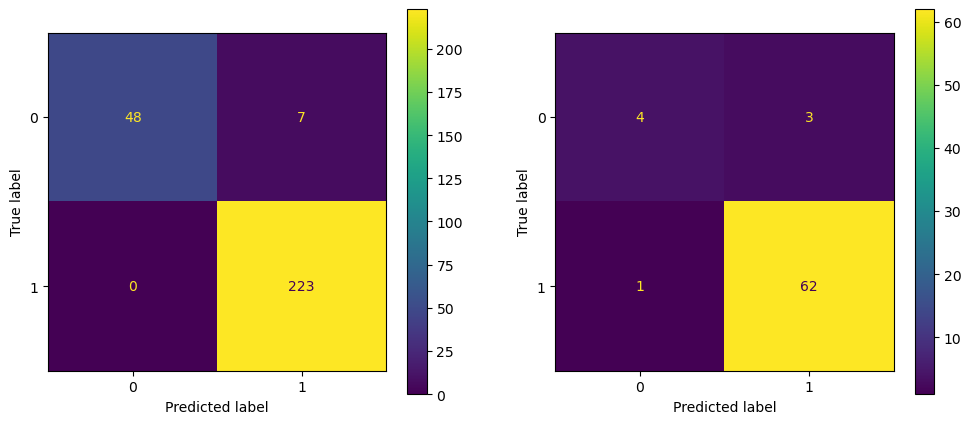

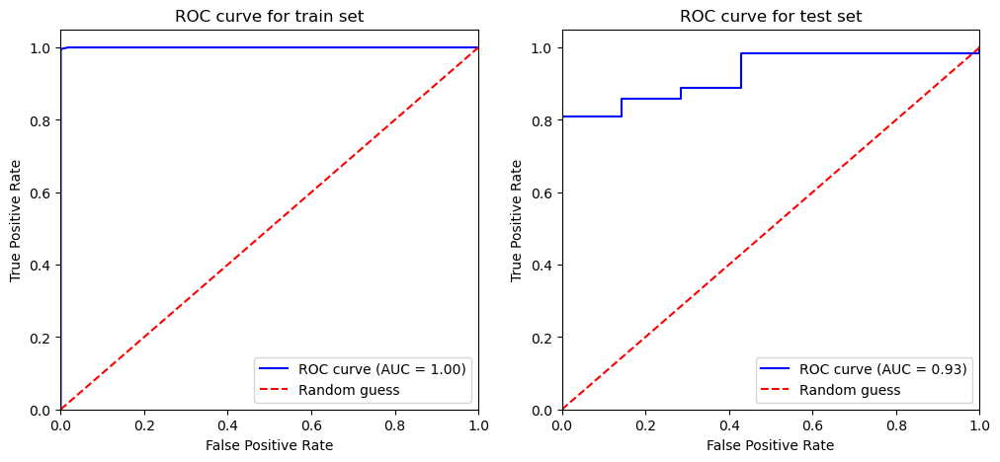

In [532]:
detailed_objective_ROC_AUC_x2(study_x2_xgb.best_trials[7])

0.9867256637168141 0.7942194324792682 0.96875


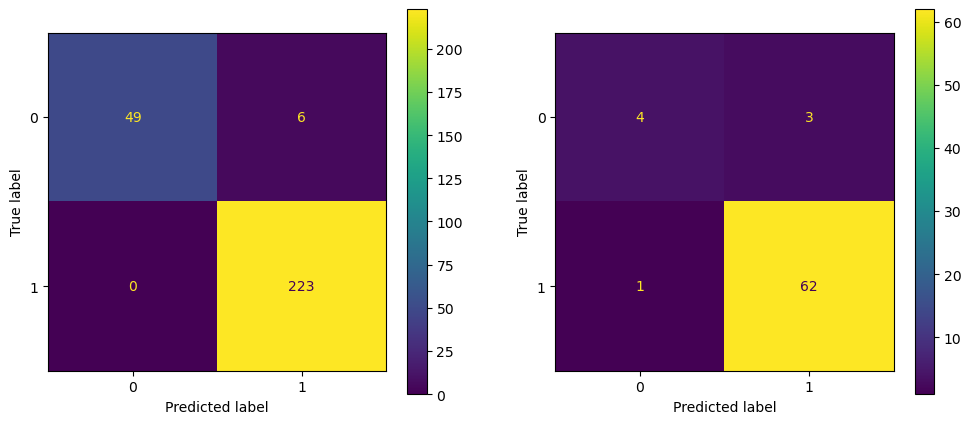

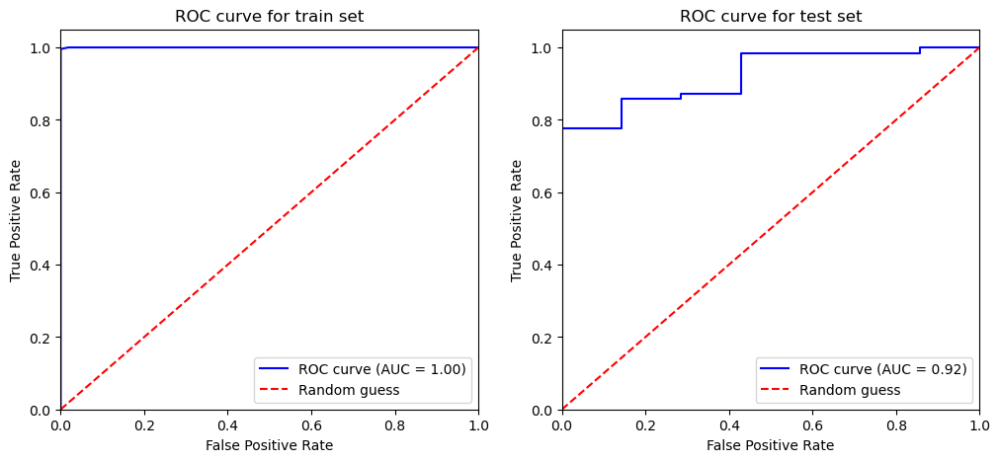

In [530]:
detailed_objective_ROC_AUC_x2(study_x2_xgb.best_trials[6])

0.9977628635346756 0.7879172556733121 0.96875


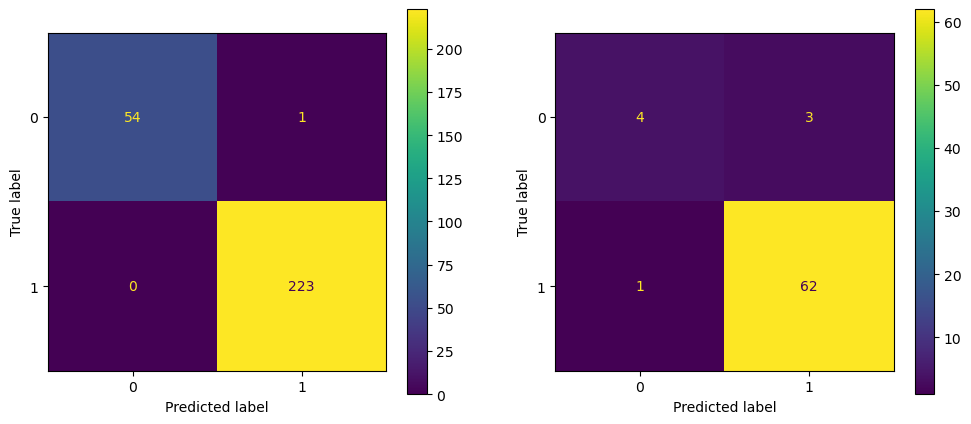

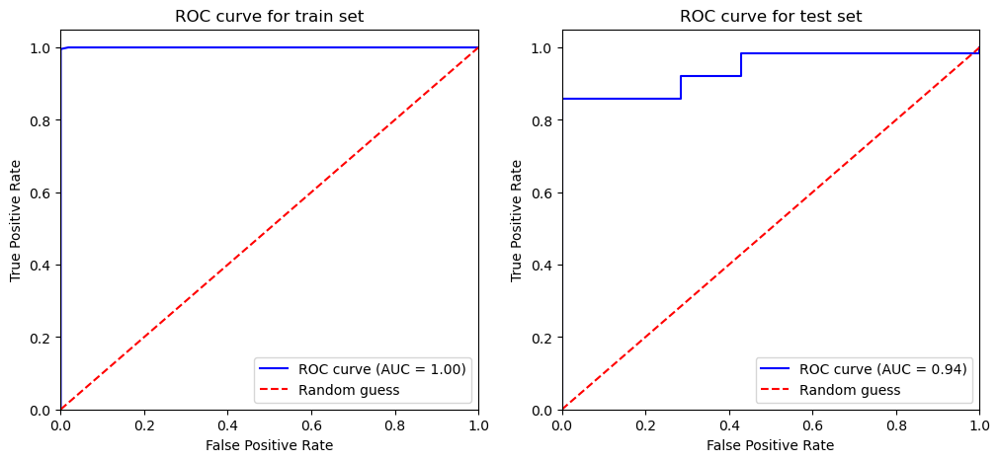

In [528]:
detailed_objective_ROC_AUC_x2(study_x2_xgb.best_trials[4])

0.9911111111111112 0.7885834384054731 0.96875


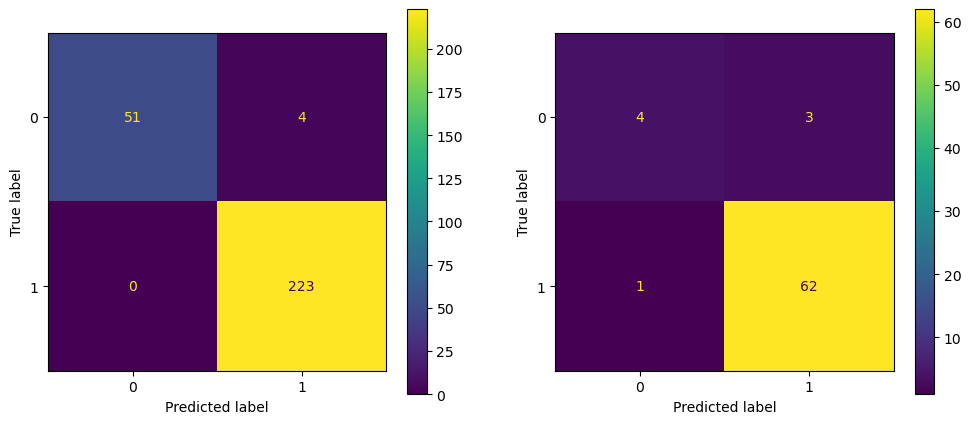

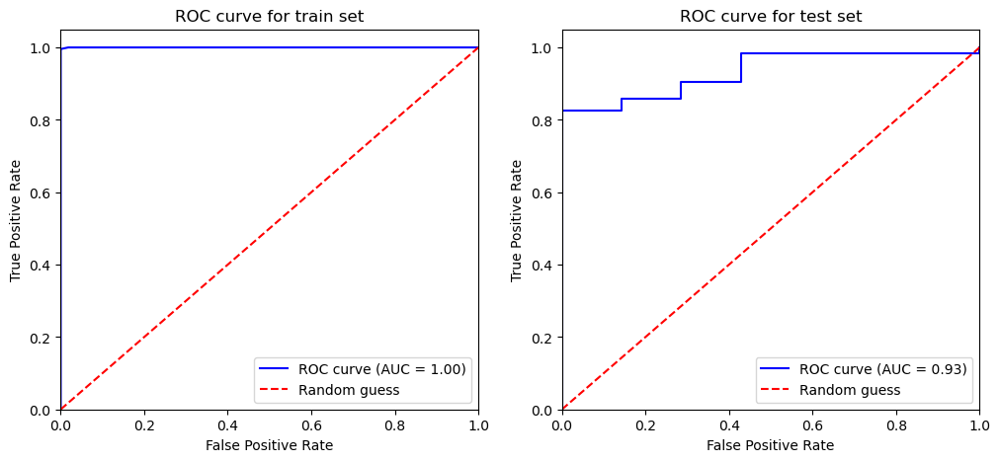

In [526]:
detailed_objective_ROC_AUC_x2(study_x2_xgb.best_trials[2])

In [537]:
def detailed_objective_ROC_AUC_x2_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x2_xgb = xgb.XGBClassifier(n_estimators=best_models_x2_be_xgb[1].params['n_estimators'],
                                     max_depth=best_models_x2_be_xgb[1].params['max_depth'],
                                     learning_rate=best_models_x2_be_xgb[1].params['learning_rate'],
                                     subsample=best_models_x2_be_xgb[1].params['subsample'],
                                     colsample_bytree=best_models_x2_be_xgb[1].params['colsample_bytree'],
                                     gamma=best_models_x2_be_xgb[1].params['gamma'],
                                     reg_alpha=best_models_x2_be_xgb[1].params['reg_alpha'],
                                     reg_lambda=best_models_x2_be_xgb[1].params['reg_lambda'],
                                     min_child_weight=best_models_x2_be_xgb[1].params['min_child_weight'],
                                     scale_pos_weight=best_models_x2_be_xgb[1].params['scale_pos_weight'],
                                     max_delta_step=best_models_x2_be_xgb[1].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x2_be = model_be_x2_xgb.fit(X2_train_spin_be_xgb,y2_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x2_be = cross_val_score(xgb_spin_optuna_x2_be,X2_train_spin_be_xgb,y2_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x2_be = cv_scores_xgb_spin_optuna_x2_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y2_train_spin,model_be_x2_xgb.predict(X2_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y2_test_spin,model_be_x2_xgb.predict(X2_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x2_be,f1_test_xgb_best_optuna_be)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y2_train_spin,xgb_spin_optuna_x2_be.predict(X2_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y2_test_spin,xgb_spin_optuna_x2_be.predict(X2_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

    ## ROC curve

    y2_pred_proba_train_xgb_x2_be = xgb_spin_optuna_x2_be.predict_proba(X2_train_spin_be_xgb)[:, 1]
    y2_pred_proba_test_xgb_x2_be = xgb_spin_optuna_x2_be.predict_proba(X2_test_spin_be_xgb)[:, 1]
    
    fpr_train_xgb_x2_be, tpr_train_xgb_x2_be, thresholds_train_xgb_x2_be = roc_curve(y2_train_spin, y2_pred_proba_train_xgb_x2_be)
    fpr_test_xgb_x2_be, tpr_test_xgb_x2_be, thresholds_test_xgb_x2_be = roc_curve(y2_test_spin, y2_pred_proba_test_xgb_x2_be)
    
    roc_auc_train_xgb_x2_be = auc(fpr_train_xgb_x2_be, tpr_train_xgb_x2_be)
    roc_auc_test_xgb_x2_be = auc(fpr_test_xgb_x2_be, tpr_test_xgb_x2_be)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x2_be, tpr_train_xgb_x2_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x2_be:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x2_be, tpr_test_xgb_x2_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x2_be:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

## detailed_objective_ROC_AUC_x2_be(study_be_x2_xgb.best_trials[1])

0.9963904007635588 0.821250659142523 0.9385416666666667


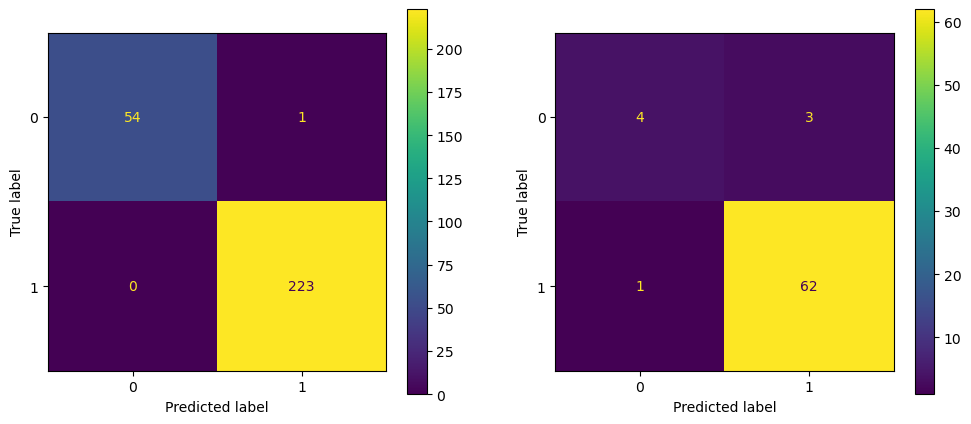

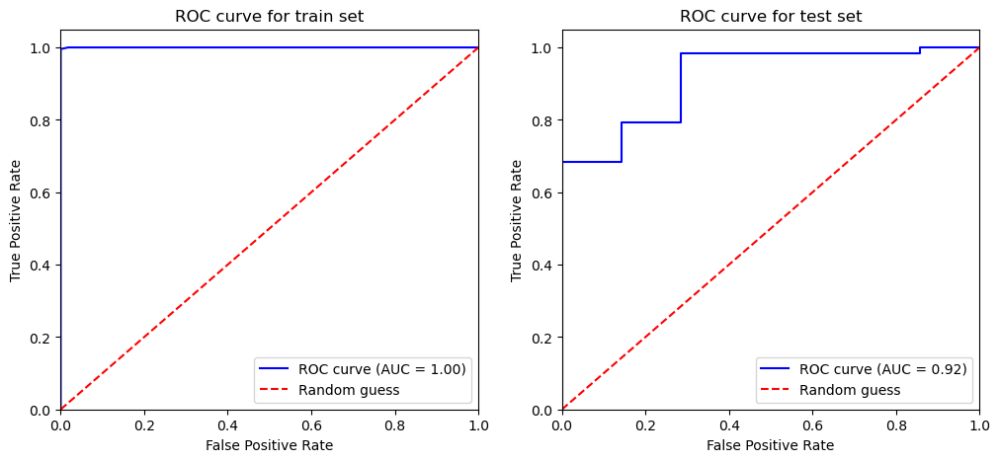

In [538]:
detailed_objective_ROC_AUC_x2_be(study_be_x2_xgb.best_trials[1])

0.9964150392410033 0.8263344931927202 0.9189516129032258


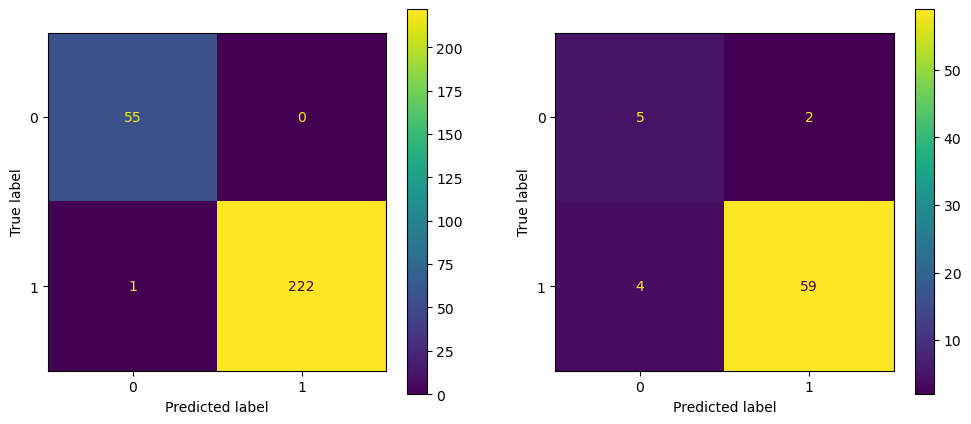

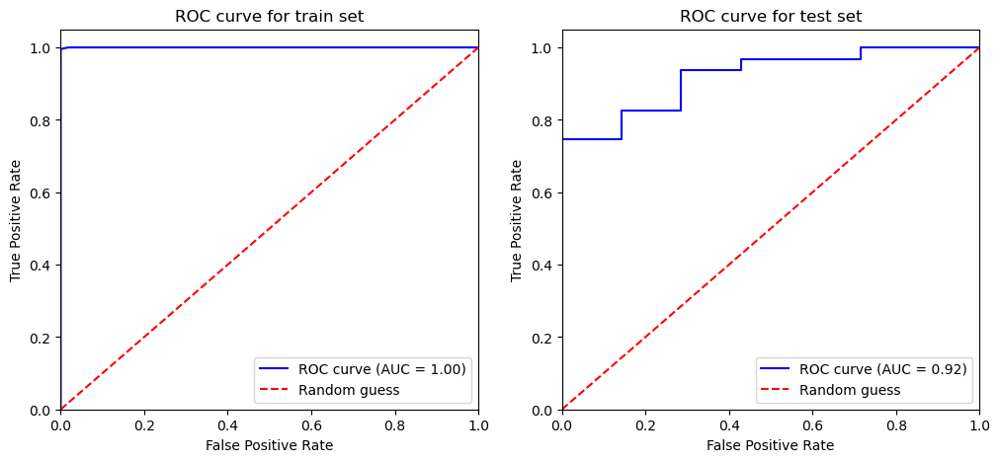

In [536]:
detailed_objective_ROC_AUC_x2_be(study_be_x2_xgb.best_trials[5])

0.9963904007635588 0.8204850278278204 0.9428571428571428


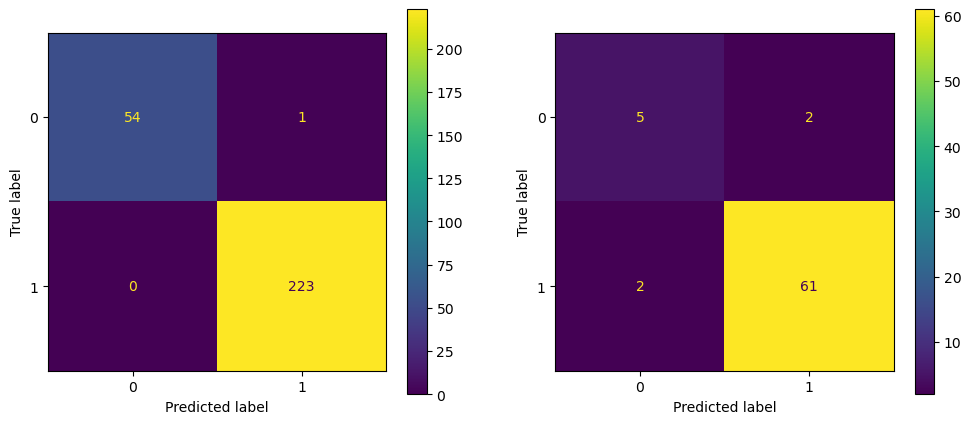

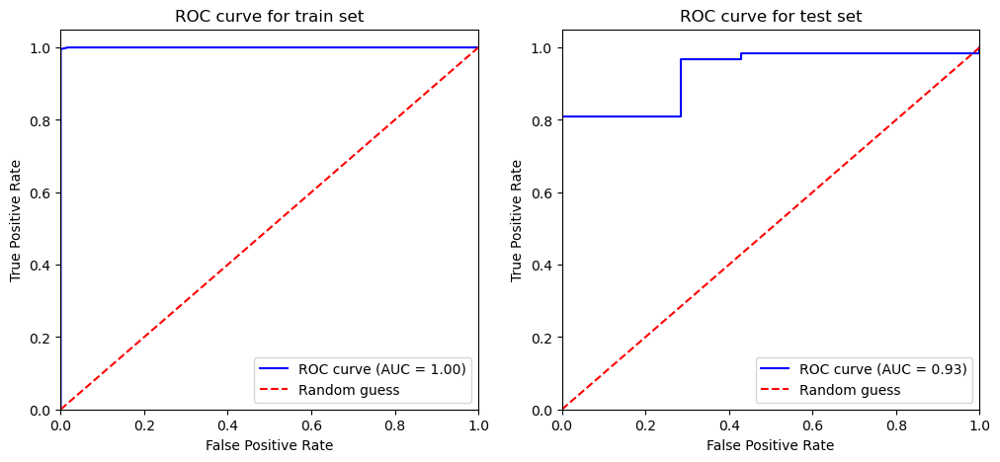

In [534]:
detailed_objective_ROC_AUC_x2_be(study_be_x2_xgb.best_trials[7])

In [539]:
## X3 dataset

In [546]:
def detailed_objective_ROC_AUC_x3(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x3_xgb = xgb.XGBClassifier(n_estimators=best_models_x3_xgb_optuna[0].params['n_estimators'],
                                     max_depth=best_models_x3_xgb_optuna[0].params['max_depth'],
                                     learning_rate=best_models_x3_xgb_optuna[0].params['learning_rate'],
                                     subsample=best_models_x3_xgb_optuna[0].params['subsample'],
                                     colsample_bytree=best_models_x3_xgb_optuna[0].params['colsample_bytree'],
                                     gamma=best_models_x3_xgb_optuna[0].params['gamma'],
                                     reg_alpha=best_models_x3_xgb_optuna[0].params['reg_alpha'],
                                     reg_lambda=best_models_x3_xgb_optuna[0].params['reg_lambda'],
                                     min_child_weight=best_models_x3_xgb_optuna[0].params['min_child_weight'],
                                     scale_pos_weight=best_models_x3_xgb_optuna[0].params['scale_pos_weight'],
                                     max_delta_step=best_models_x3_xgb_optuna[0].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x3 = model_x3_xgb.fit(X3_train_spin,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3 = cross_val_score(xgb_spin_optuna_x3,X3_train_spin,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3 = cv_scores_xgb_spin_optuna_x3.mean()

    f1_train_x3_optuna = f1_score(y3_train_spin, model_x3_xgb.predict(X3_train_spin))
    f1_test_x3_optuna = f1_score(y3_test_spin, model_x3_xgb.predict(X3_test_spin))

    f1_train_best_optuna_x3 = f1_score(y3_train_spin,model_x3_xgb.predict(X3_train_spin))
    f1_test_best_optuna_x3 = f1_score(y3_test_spin,model_x3_xgb.predict(X3_test_spin))
    print(f1_train_best_optuna_x3,avg_f1_cv_xgb_spin_optuna_x3,f1_test_best_optuna_x3)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x3 = confusion_matrix(y3_train_spin,xgb_spin_optuna_x3.predict(X3_train_spin))
    cm_test_best_optuna_x3 = confusion_matrix(y3_test_spin,xgb_spin_optuna_x3.predict(X3_test_spin))
    
    disp_train_best_optuna_x3 = ConfusionMatrixDisplay(cm_train_best_optuna_x3)
    disp_test_best_optuna_x3 = ConfusionMatrixDisplay(cm_test_best_optuna_x3)
    
    disp_train_best_optuna_x3.plot(ax=axes[0])
    disp_test_best_optuna_x3.plot(ax=axes[1])    
    plt.show()

    ## ROC curve

    y3_pred_proba_train_xgb_x3 = xgb_spin_optuna_x3.predict_proba(X3_train_spin)[:, 1]
    y3_pred_proba_test_xgb_x3 = xgb_spin_optuna_x3.predict_proba(X3_test_spin)[:, 1]
    
    fpr_train_xgb_x3, tpr_train_xgb_x3, thresholds_train_xgb_x3 = roc_curve(y3_train_spin, y3_pred_proba_train_xgb_x3)
    fpr_test_xgb_x3, tpr_test_xgb_x3, thresholds_test_xgb_x3 = roc_curve(y3_test_spin, y3_pred_proba_test_xgb_x3)
    
    roc_auc_train_xgb_x3 = auc(fpr_train_xgb_x3, tpr_train_xgb_x3)
    roc_auc_test_xgb_x3 = auc(fpr_test_xgb_x3, tpr_test_xgb_x3)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x3, tpr_train_xgb_x3, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x3:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x3, tpr_test_xgb_x3, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x3:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

#detailed_objective_ROC_AUC_x3(study_x3_xgb.best_trials[0])

0.9955357142857143 0.7807075682423059 0.9606299212598425


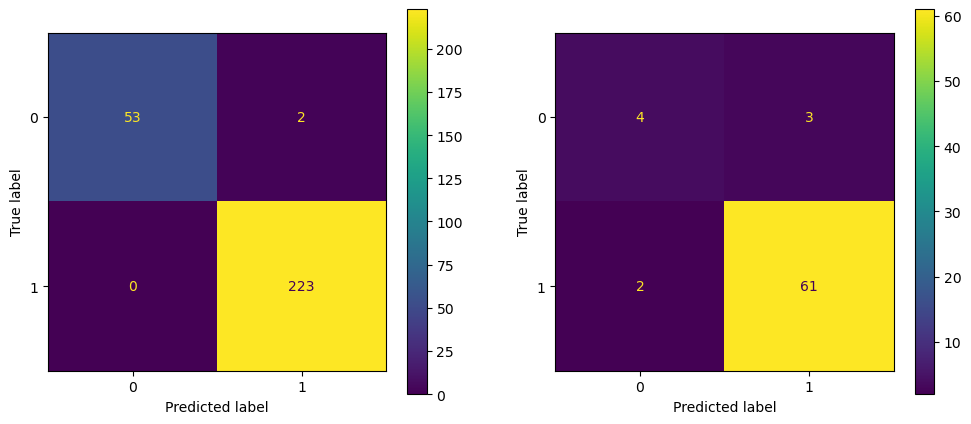

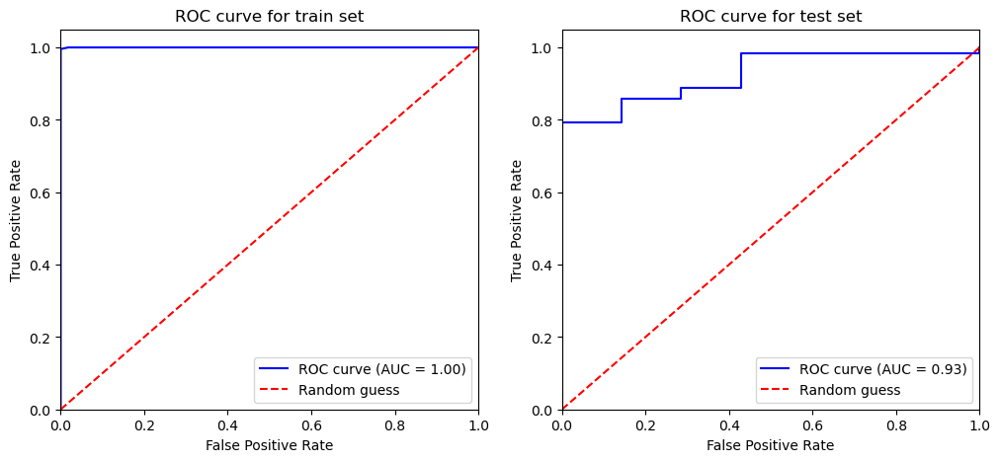

In [547]:
detailed_objective_ROC_AUC_x3(study_x3_xgb.best_trials[0])

0.9977628635346756 0.7899218496113578 0.9523809523809523


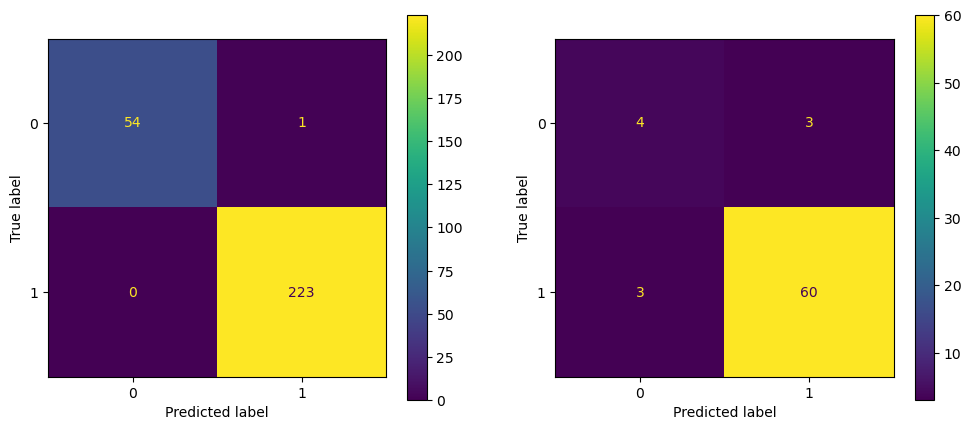

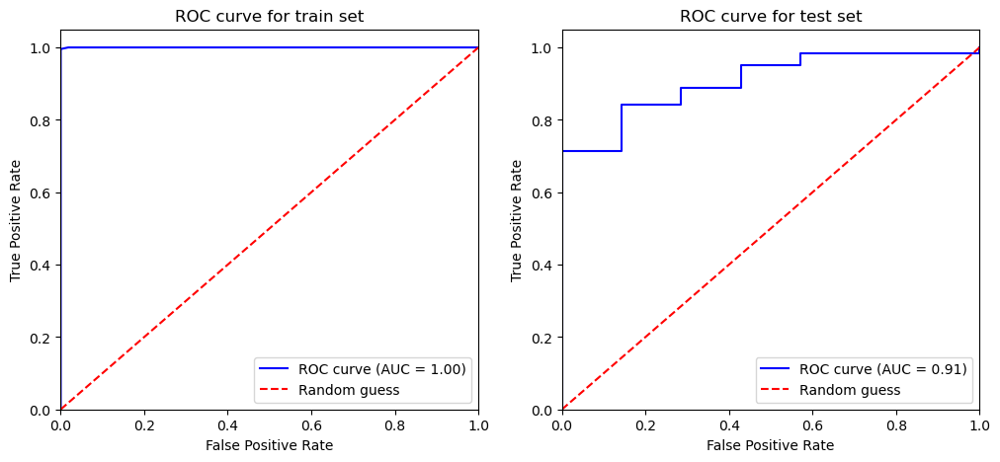

In [545]:
detailed_objective_ROC_AUC_x3(study_x3_xgb.best_trials[2])

0.9955156950672646 0.763506881448208 0.9682539682539683


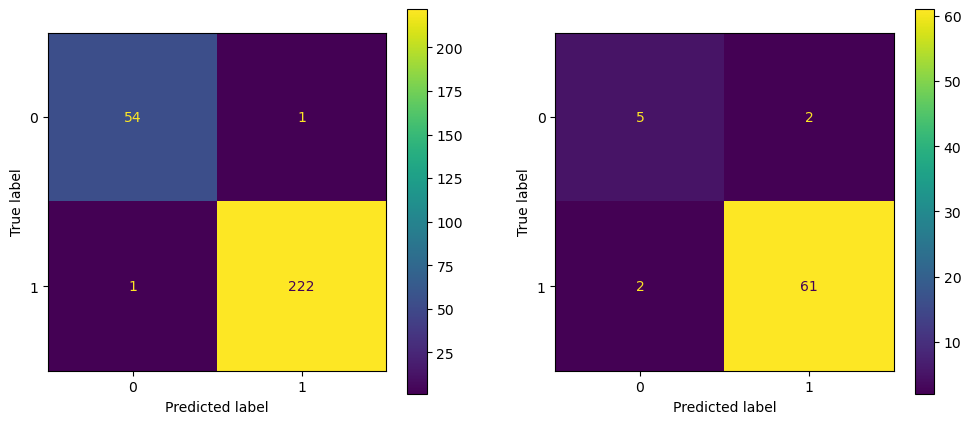

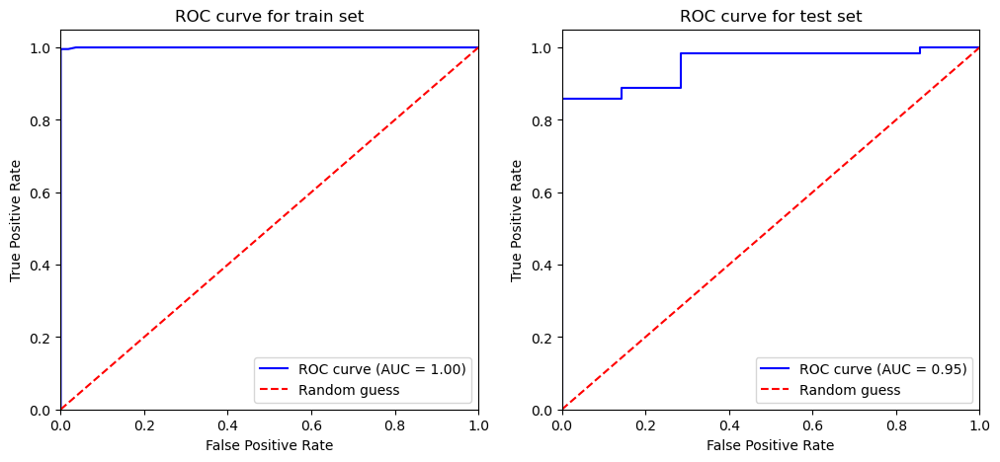

In [541]:
detailed_objective_ROC_AUC_x3(study_x3_xgb.best_trials[7])

0.9933184855233853 0.7978809930823119 0.96875


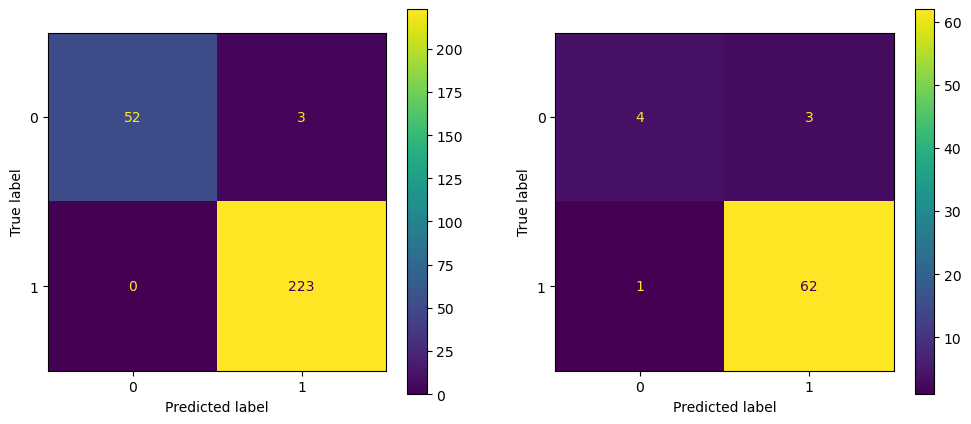

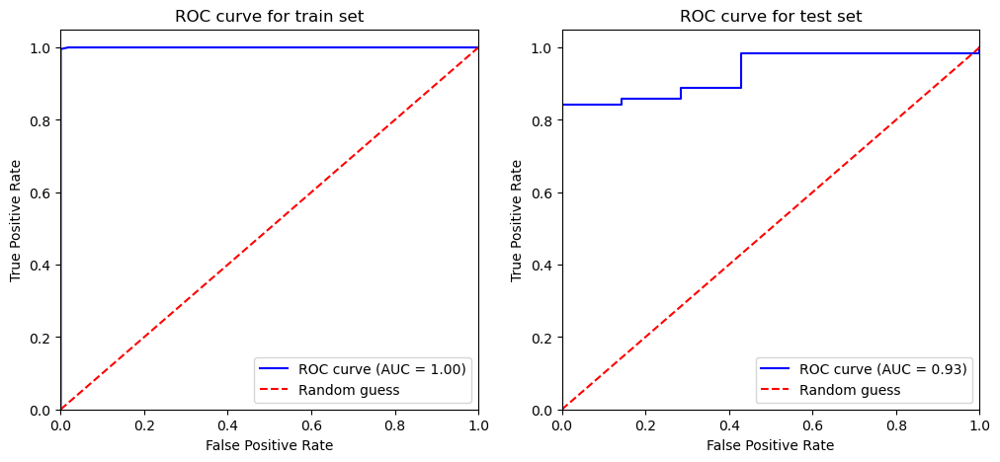

In [543]:
detailed_objective_ROC_AUC_x3(study_x3_xgb.best_trials[8])

In [554]:
def detailed_objective_ROC_AUC_x3_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x3_xgb = xgb.XGBClassifier(n_estimators=best_models_x3_be_xgb[0].params['n_estimators'],
                                     max_depth=best_models_x3_be_xgb[0].params['max_depth'],
                                     learning_rate=best_models_x3_be_xgb[0].params['learning_rate'],
                                     subsample=best_models_x3_be_xgb[0].params['subsample'],
                                     colsample_bytree=best_models_x3_be_xgb[0].params['colsample_bytree'],
                                     gamma=best_models_x3_be_xgb[0].params['gamma'],
                                     reg_alpha=best_models_x3_be_xgb[0].params['reg_alpha'],
                                     reg_lambda=best_models_x3_be_xgb[0].params['reg_lambda'],
                                     min_child_weight=best_models_x3_be_xgb[0].params['min_child_weight'],
                                     scale_pos_weight=best_models_x3_be_xgb[0].params['scale_pos_weight'],
                                     max_delta_step=best_models_x3_be_xgb[0].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x3_be = model_be_x3_xgb.fit(X3_train_spin_be_xgb,y3_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x3_be = cross_val_score(xgb_spin_optuna_x3_be,X3_train_spin_be_xgb,y3_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x3_be = cv_scores_xgb_spin_optuna_x3_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y3_train_spin,model_be_x3_xgb.predict(X3_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y3_test_spin,model_be_x3_xgb.predict(X3_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x3_be,f1_test_xgb_best_optuna_be)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y3_train_spin,xgb_spin_optuna_x3_be.predict(X3_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y3_test_spin,xgb_spin_optuna_x3_be.predict(X3_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

    ## ROC curve

    y3_pred_proba_train_xgb_x3_be = xgb_spin_optuna_x3_be.predict_proba(X3_train_spin_be_xgb)[:, 1]
    y3_pred_proba_test_xgb_x3_be = xgb_spin_optuna_x3_be.predict_proba(X3_test_spin_be_xgb)[:, 1]
    
    fpr_train_xgb_x3_be, tpr_train_xgb_x3_be, thresholds_train_xgb_x3_be = roc_curve(y3_train_spin, y3_pred_proba_train_xgb_x3_be)
    fpr_test_xgb_x3_be, tpr_test_xgb_x3_be, thresholds_test_xgb_x3_be = roc_curve(y3_test_spin, y3_pred_proba_test_xgb_x3_be)
    
    roc_auc_train_xgb_x3_be = auc(fpr_train_xgb_x3_be, tpr_train_xgb_x3_be)
    roc_auc_test_xgb_x3_be = auc(fpr_test_xgb_x3_be, tpr_test_xgb_x3_be)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x3_be, tpr_train_xgb_x3_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x3_be:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x3_be, tpr_test_xgb_x3_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x3_be:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

## detailed_objective_ROC_AUC_x3_be(study_be_x3_xgb.best_trials[0])

0.9963904007635588 0.8287199606149545 0.9142857142857143


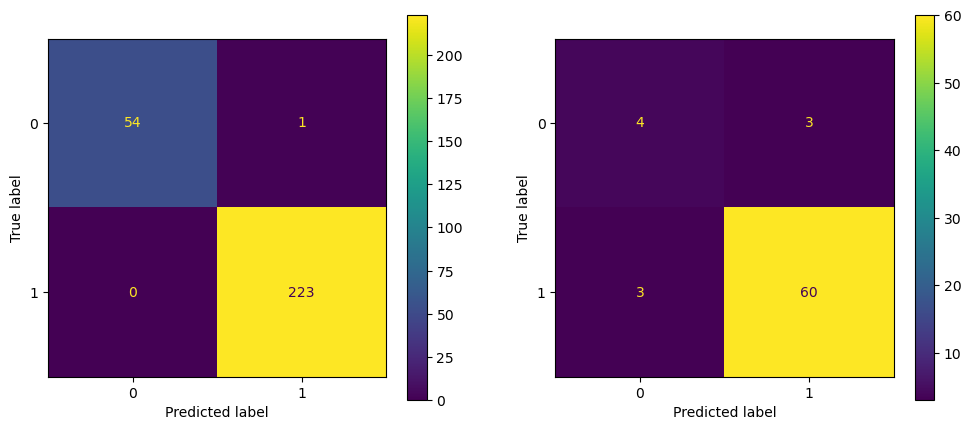

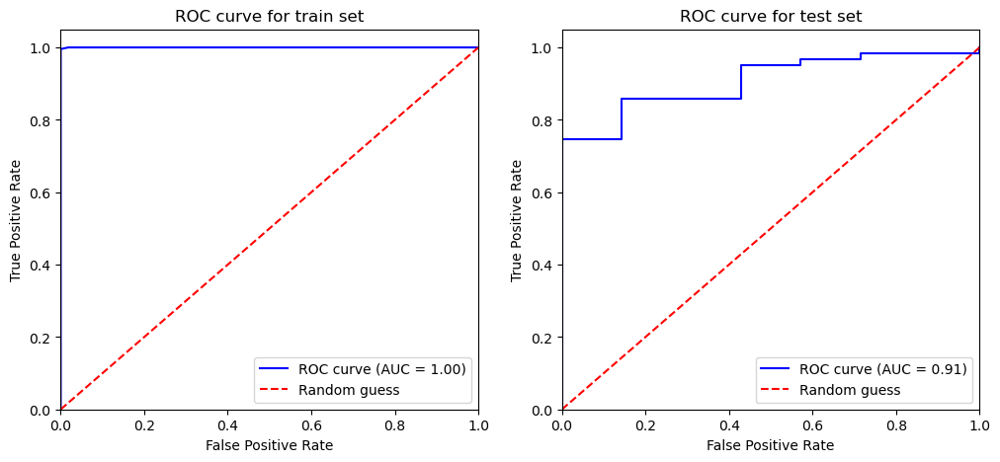

In [555]:
detailed_objective_ROC_AUC_x3_be(study_be_x3_xgb.best_trials[0])

0.9854039787038296 0.784981812469637 0.9261053906723197


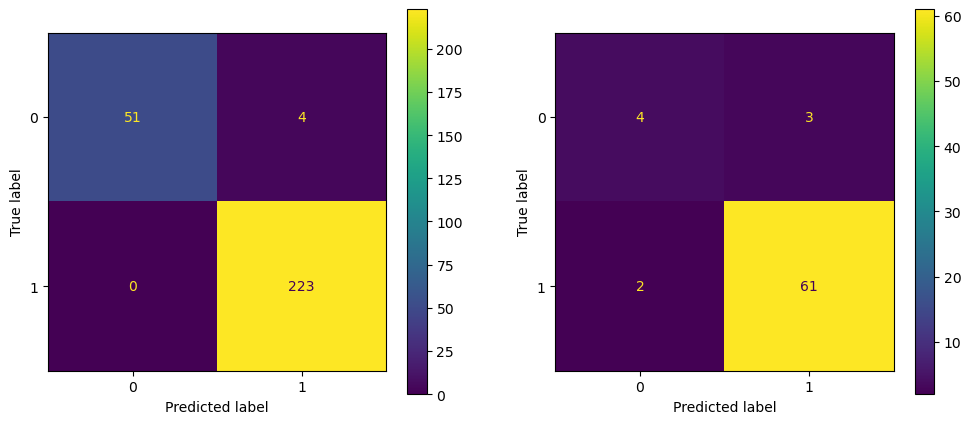

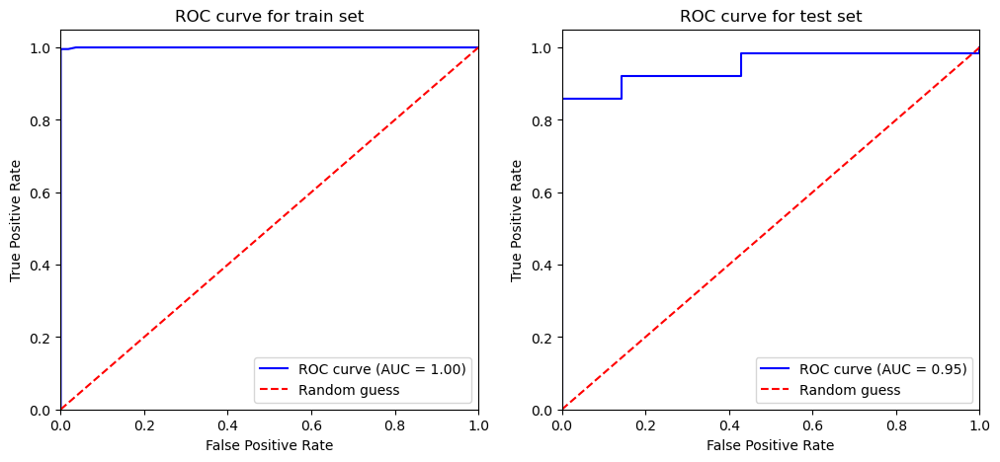

In [549]:
detailed_objective_ROC_AUC_x3_be(study_be_x3_xgb.best_trials[1])

0.9779379355603333 0.7968532822382313 0.9385416666666667


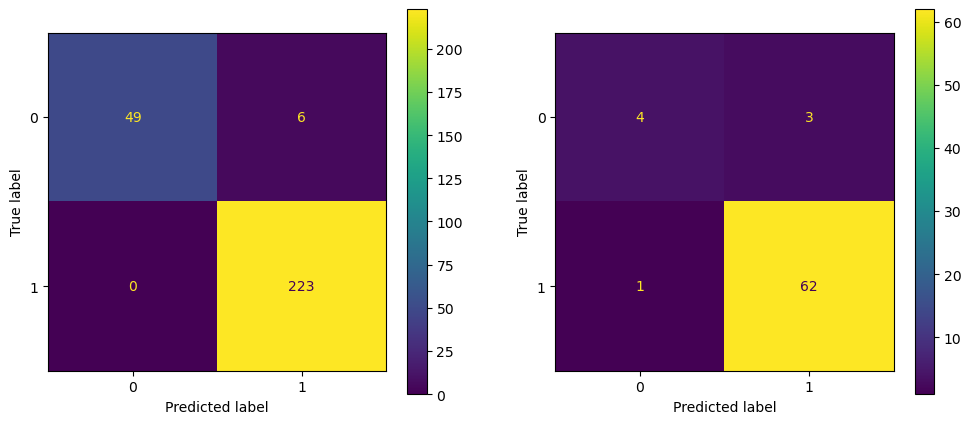

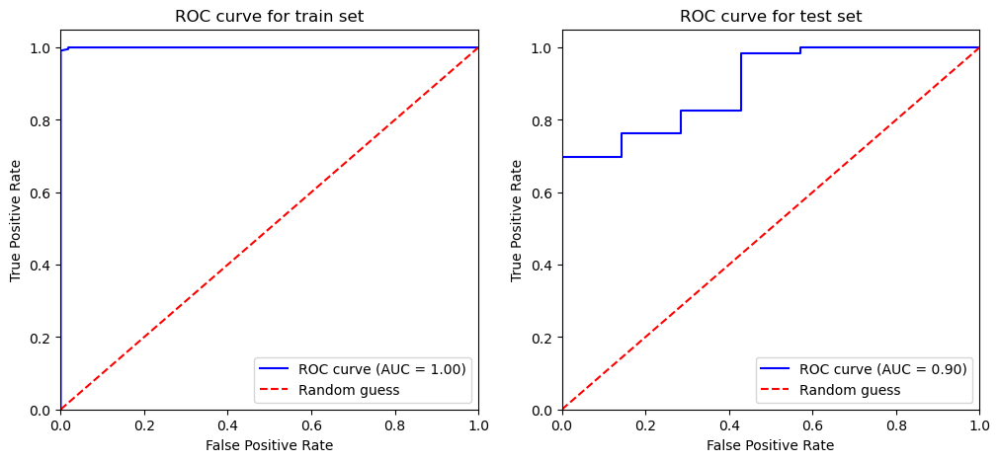

In [551]:
detailed_objective_ROC_AUC_x3_be(study_be_x3_xgb.best_trials[4])

0.9703480542852579 0.8107330833655528 0.9385416666666667


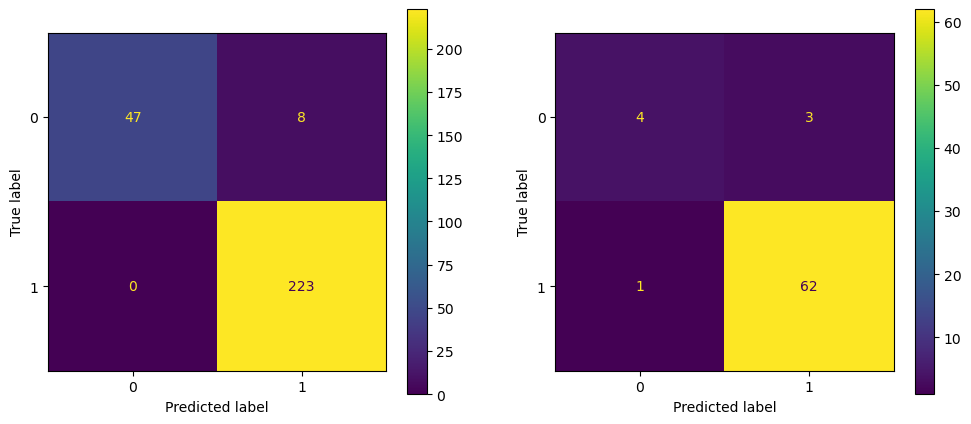

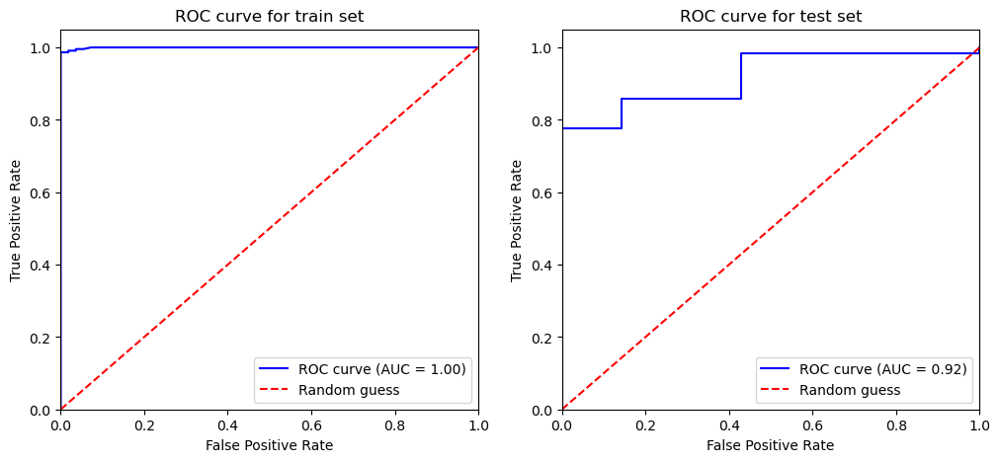

In [553]:
detailed_objective_ROC_AUC_x3_be(study_be_x3_xgb.best_trials[5])

In [556]:
## X4 dataset

0.9977628635346756 0.7934497851981756 0.96875


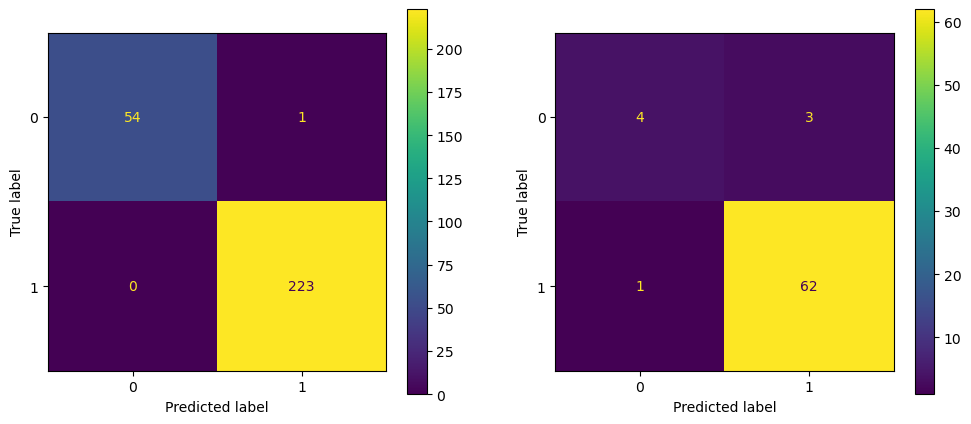

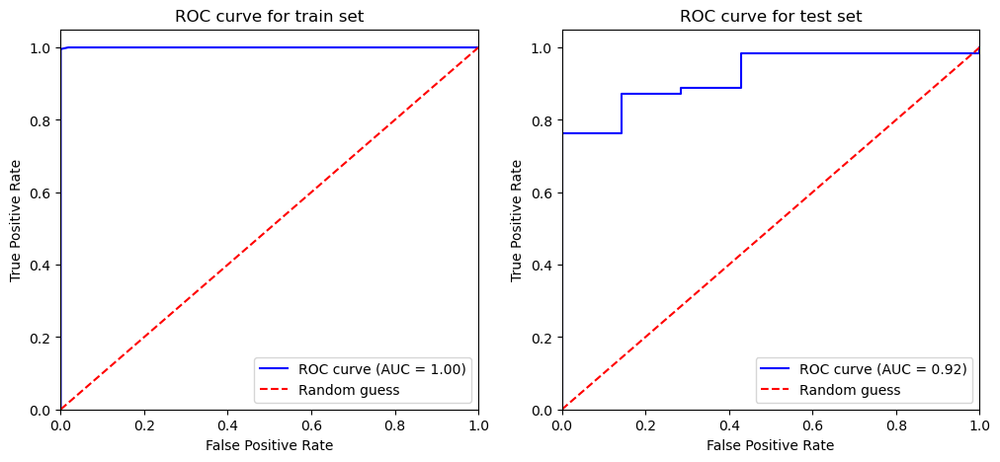

In [558]:
def detailed_objective_ROC_AUC_x4(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x4_xgb = xgb.XGBClassifier(n_estimators=best_models_x4_xgb_optuna[3].params['n_estimators'],
                                     max_depth=best_models_x4_xgb_optuna[3].params['max_depth'],
                                     learning_rate=best_models_x4_xgb_optuna[3].params['learning_rate'],
                                     subsample=best_models_x4_xgb_optuna[3].params['subsample'],
                                     colsample_bytree=best_models_x4_xgb_optuna[3].params['colsample_bytree'],
                                     gamma=best_models_x4_xgb_optuna[3].params['gamma'],
                                     reg_alpha=best_models_x4_xgb_optuna[3].params['reg_alpha'],
                                     reg_lambda=best_models_x4_xgb_optuna[3].params['reg_lambda'],
                                     min_child_weight=best_models_x4_xgb_optuna[3].params['min_child_weight'],
                                     scale_pos_weight=best_models_x4_xgb_optuna[3].params['scale_pos_weight'],
                                     max_delta_step=best_models_x4_xgb_optuna[3].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x4 = model_x4_xgb.fit(X4_train_spin,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4 = cross_val_score(xgb_spin_optuna_x4,X4_train_spin,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4 = cv_scores_xgb_spin_optuna_x4.mean()

    f1_train_x4_optuna = f1_score(y4_train_spin, model_x4_xgb.predict(X4_train_spin))
    f1_test_x4_optuna = f1_score(y4_test_spin, model_x4_xgb.predict(X4_test_spin))

    f1_train_best_optuna_x4 = f1_score(y4_train_spin,model_x4_xgb.predict(X4_train_spin))
    f1_test_best_optuna_x4 = f1_score(y4_test_spin,model_x4_xgb.predict(X4_test_spin))
    print(f1_train_best_optuna_x4,avg_f1_cv_xgb_spin_optuna_x4,f1_test_best_optuna_x4)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x4 = confusion_matrix(y4_train_spin,xgb_spin_optuna_x4.predict(X4_train_spin))
    cm_test_best_optuna_x4 = confusion_matrix(y4_test_spin,xgb_spin_optuna_x4.predict(X4_test_spin))
    
    disp_train_best_optuna_x4 = ConfusionMatrixDisplay(cm_train_best_optuna_x4)
    disp_test_best_optuna_x4 = ConfusionMatrixDisplay(cm_test_best_optuna_x4)
    
    disp_train_best_optuna_x4.plot(ax=axes[0])
    disp_test_best_optuna_x4.plot(ax=axes[1])    
    plt.show()

    ## ROC curve

    y4_pred_proba_train_xgb_x4 = xgb_spin_optuna_x4.predict_proba(X4_train_spin)[:, 1]
    y4_pred_proba_test_xgb_x4 = xgb_spin_optuna_x4.predict_proba(X4_test_spin)[:, 1]
    
    fpr_train_xgb_x4, tpr_train_xgb_x4, thresholds_train_xgb_x4 = roc_curve(y4_train_spin, y4_pred_proba_train_xgb_x4)
    fpr_test_xgb_x4, tpr_test_xgb_x4, thresholds_test_xgb_x4 = roc_curve(y4_test_spin, y4_pred_proba_test_xgb_x4)
    
    roc_auc_train_xgb_x4 = auc(fpr_train_xgb_x4, tpr_train_xgb_x4)
    roc_auc_test_xgb_x4 = auc(fpr_test_xgb_x4, tpr_test_xgb_x4)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x4, tpr_train_xgb_x4, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x4:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x4, tpr_test_xgb_x4, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x4:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

detailed_objective_ROC_AUC_x4(study_x4_xgb.best_trials[3])

In [561]:
def detailed_objective_ROC_AUC_x4_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x4_xgb = xgb.XGBClassifier(n_estimators=best_models_x4_be_xgb[7].params['n_estimators'],
                                     max_depth=best_models_x4_be_xgb[7].params['max_depth'],
                                     learning_rate=best_models_x4_be_xgb[7].params['learning_rate'],
                                     subsample=best_models_x4_be_xgb[7].params['subsample'],
                                     colsample_bytree=best_models_x4_be_xgb[7].params['colsample_bytree'],
                                     gamma=best_models_x4_be_xgb[7].params['gamma'],
                                     reg_alpha=best_models_x4_be_xgb[7].params['reg_alpha'],
                                     reg_lambda=best_models_x4_be_xgb[7].params['reg_lambda'],
                                     min_child_weight=best_models_x4_be_xgb[7].params['min_child_weight'],
                                     scale_pos_weight=best_models_x4_be_xgb[7].params['scale_pos_weight'],
                                     max_delta_step=best_models_x4_be_xgb[7].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x4_be = model_be_x4_xgb.fit(X4_train_spin_be_xgb,y4_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x4_be = cross_val_score(xgb_spin_optuna_x4_be,X4_train_spin_be_xgb,y4_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x4_be = cv_scores_xgb_spin_optuna_x4_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y4_train_spin,model_be_x4_xgb.predict(X4_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y4_test_spin,model_be_x4_xgb.predict(X4_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x4_be,f1_test_xgb_best_optuna_be)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y4_train_spin,xgb_spin_optuna_x4_be.predict(X4_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y4_test_spin,xgb_spin_optuna_x4_be.predict(X4_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

    ## ROC curve

    y4_pred_proba_train_xgb_x4_be = xgb_spin_optuna_x4_be.predict_proba(X4_train_spin_be_xgb)[:, 1]
    y4_pred_proba_test_xgb_x4_be = xgb_spin_optuna_x4_be.predict_proba(X4_test_spin_be_xgb)[:, 1]
    
    fpr_train_xgb_x4_be, tpr_train_xgb_x4_be, thresholds_train_xgb_x4_be = roc_curve(y4_train_spin, y4_pred_proba_train_xgb_x4_be)
    fpr_test_xgb_x4_be, tpr_test_xgb_x4_be, thresholds_test_xgb_x4_be = roc_curve(y4_test_spin, y4_pred_proba_test_xgb_x4_be)
    
    roc_auc_train_xgb_x4_be = auc(fpr_train_xgb_x4_be, tpr_train_xgb_x4_be)
    roc_auc_test_xgb_x4_be = auc(fpr_test_xgb_x4_be, tpr_test_xgb_x4_be)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x4_be, tpr_train_xgb_x4_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x4_be:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x4_be, tpr_test_xgb_x4_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x4_be:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

## detailed_objective_ROC_AUC_x4_be(study_be_x4_xgb.best_trials[7])

0.9816858581554142 0.8169024410857986 0.9385416666666667


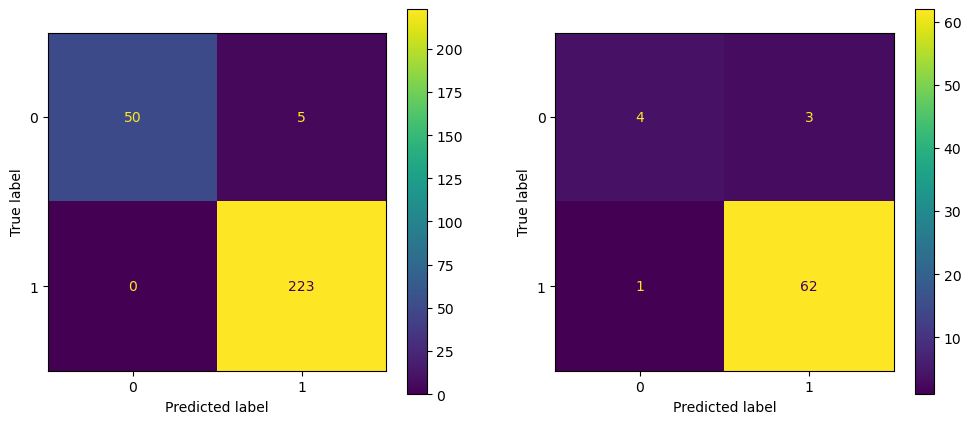

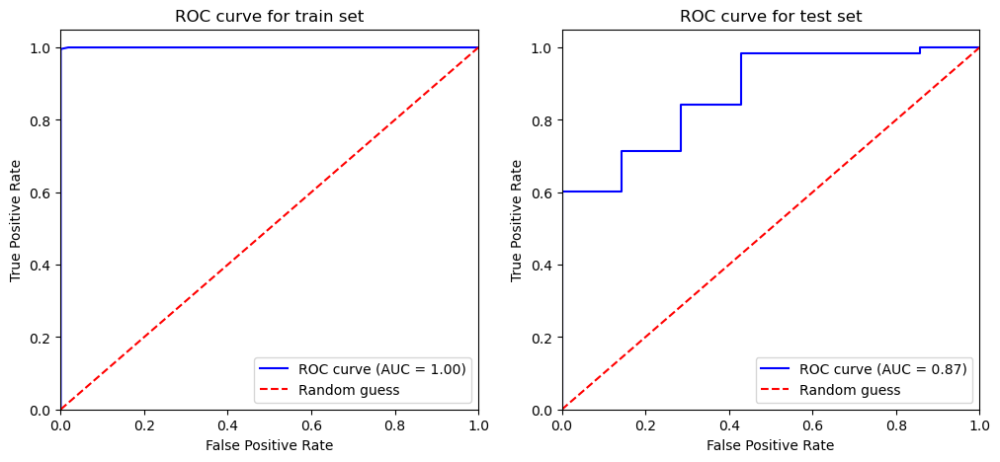

In [560]:
detailed_objective_ROC_AUC_x4_be(study_be_x4_xgb.best_trials[0])

0.989093403586146 0.8167024485120816 0.9261053906723197


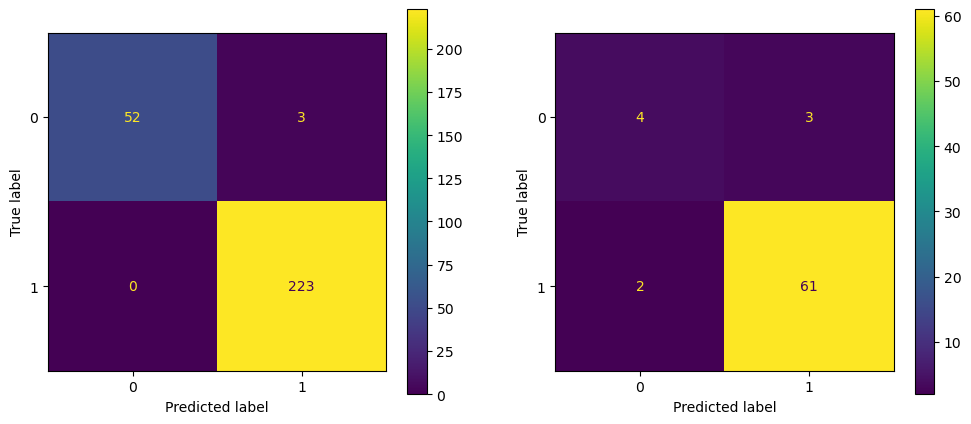

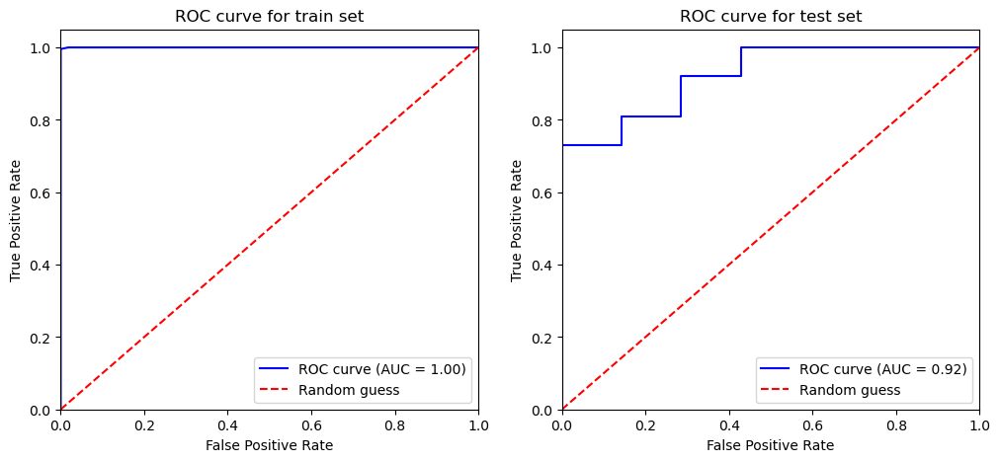

In [562]:
detailed_objective_ROC_AUC_x4_be(study_be_x4_xgb.best_trials[7])

In [563]:
## X5 dataset

In [568]:
def detailed_objective_ROC_AUC_x5(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_x5_xgb = xgb.XGBClassifier(n_estimators=best_models_x5_xgb_optuna[9].params['n_estimators'],
                                     max_depth=best_models_x5_xgb_optuna[9].params['max_depth'],
                                     learning_rate=best_models_x5_xgb_optuna[9].params['learning_rate'],
                                     subsample=best_models_x5_xgb_optuna[9].params['subsample'],
                                     colsample_bytree=best_models_x5_xgb_optuna[9].params['colsample_bytree'],
                                     gamma=best_models_x5_xgb_optuna[9].params['gamma'],
                                     reg_alpha=best_models_x5_xgb_optuna[9].params['reg_alpha'],
                                     reg_lambda=best_models_x5_xgb_optuna[9].params['reg_lambda'],
                                     min_child_weight=best_models_x5_xgb_optuna[9].params['min_child_weight'],
                                     scale_pos_weight=best_models_x5_xgb_optuna[9].params['scale_pos_weight'],
                                     max_delta_step=best_models_x5_xgb_optuna[9].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x5 = model_x5_xgb.fit(X5_train_spin,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5 = cross_val_score(xgb_spin_optuna_x5,X5_train_spin,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5 = cv_scores_xgb_spin_optuna_x5.mean()

    f1_train_x5_optuna = f1_score(y5_train_spin, model_x5_xgb.predict(X5_train_spin))
    f1_test_x5_optuna = f1_score(y5_test_spin, model_x5_xgb.predict(X5_test_spin))

    f1_train_best_optuna_x5 = f1_score(y5_train_spin,model_x5_xgb.predict(X5_train_spin))
    f1_test_best_optuna_x5 = f1_score(y5_test_spin,model_x5_xgb.predict(X5_test_spin))
    print(f1_train_best_optuna_x5,avg_f1_cv_xgb_spin_optuna_x5,f1_test_best_optuna_x5)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    
    cm_train_best_optuna_x5 = confusion_matrix(y5_train_spin,xgb_spin_optuna_x5.predict(X5_train_spin))
    cm_test_best_optuna_x5 = confusion_matrix(y5_test_spin,xgb_spin_optuna_x5.predict(X5_test_spin))
    
    disp_train_best_optuna_x5 = ConfusionMatrixDisplay(cm_train_best_optuna_x5)
    disp_test_best_optuna_x5 = ConfusionMatrixDisplay(cm_test_best_optuna_x5)
    
    disp_train_best_optuna_x5.plot(ax=axes[0])
    disp_test_best_optuna_x5.plot(ax=axes[1])    
    plt.show()

    ## ROC curve

    y5_pred_proba_train_xgb_x5 = xgb_spin_optuna_x5.predict_proba(X5_train_spin)[:, 1]
    y5_pred_proba_test_xgb_x5 = xgb_spin_optuna_x5.predict_proba(X5_test_spin)[:, 1]
    
    fpr_train_xgb_x5, tpr_train_xgb_x5, thresholds_train_xgb_x5 = roc_curve(y5_train_spin, y5_pred_proba_train_xgb_x5)
    fpr_test_xgb_x5, tpr_test_xgb_x5, thresholds_test_xgb_x5 = roc_curve(y5_test_spin, y5_pred_proba_test_xgb_x5)
    
    roc_auc_train_xgb_x5 = auc(fpr_train_xgb_x5, tpr_train_xgb_x5)
    roc_auc_test_xgb_x5 = auc(fpr_test_xgb_x5, tpr_test_xgb_x5)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x5, tpr_train_xgb_x5, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x5:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x5, tpr_test_xgb_x5, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x5:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

# detailed_objective_ROC_AUC_x5(study_x5_xgb.best_trials[9])

0.9845474613686535 0.785988412906099 0.96875


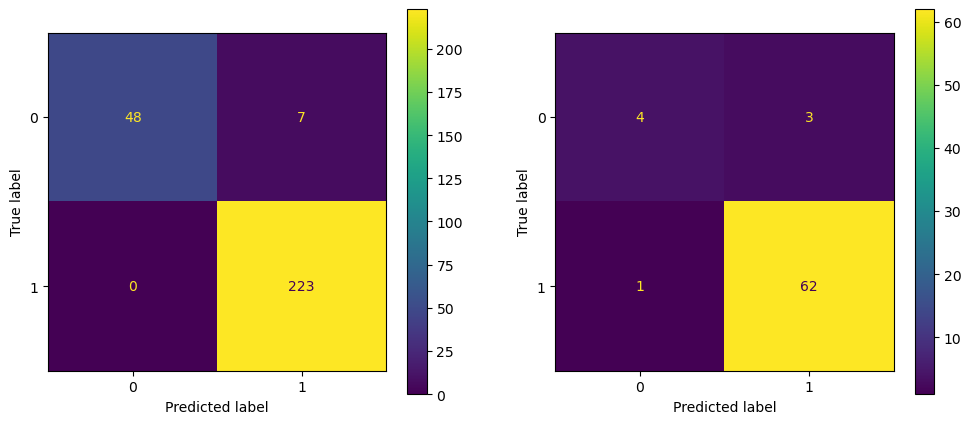

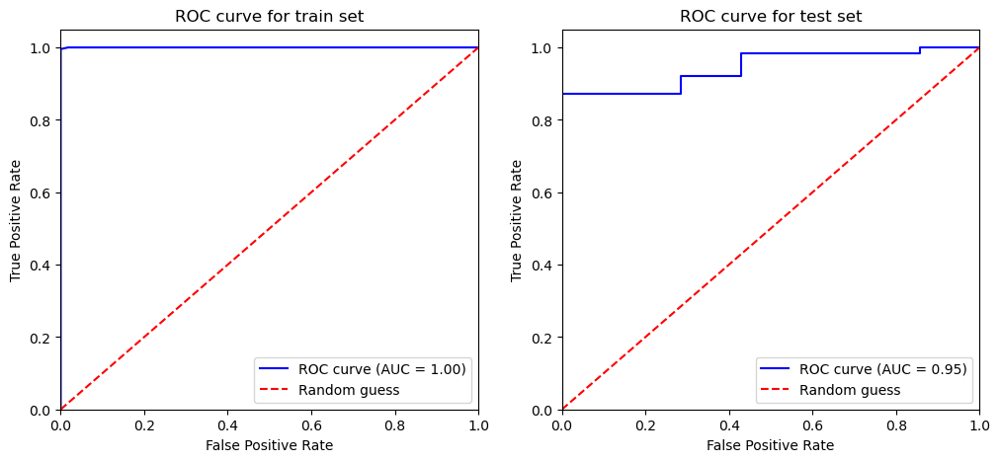

In [565]:
detailed_objective_ROC_AUC_x5(study_x5_xgb.best_trials[3])

0.9955357142857143 0.7773815959888662 0.9606299212598425


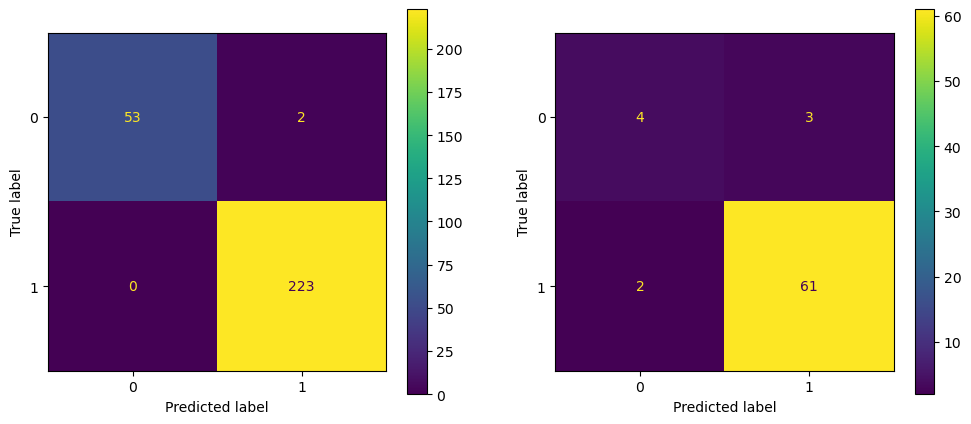

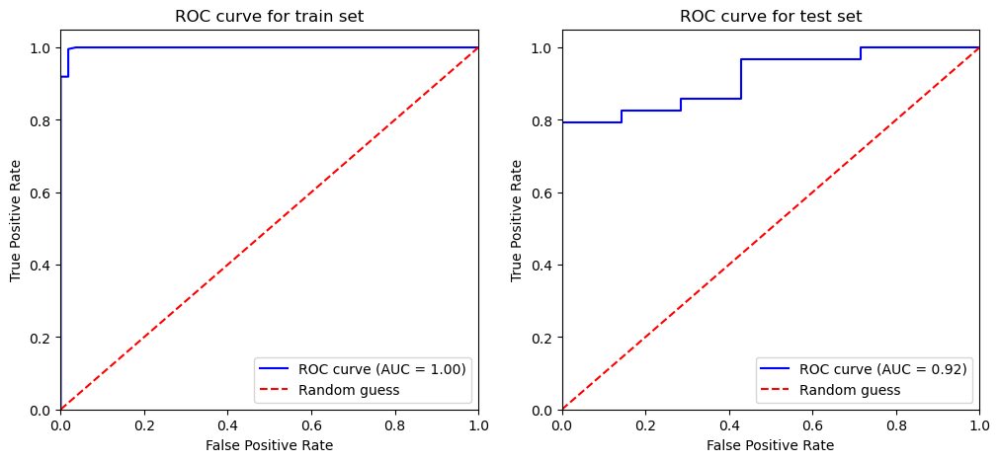

In [567]:
detailed_objective_ROC_AUC_x5(study_x5_xgb.best_trials[4])

0.9889135254988913 0.760207620153665 0.96875


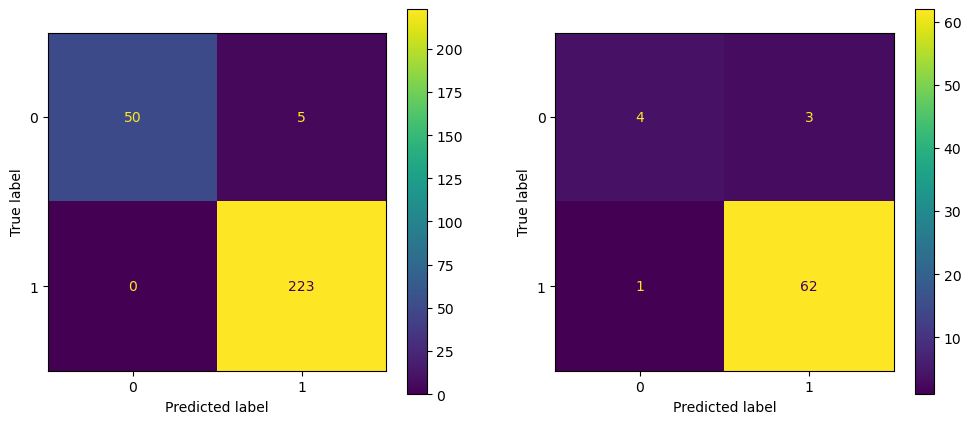

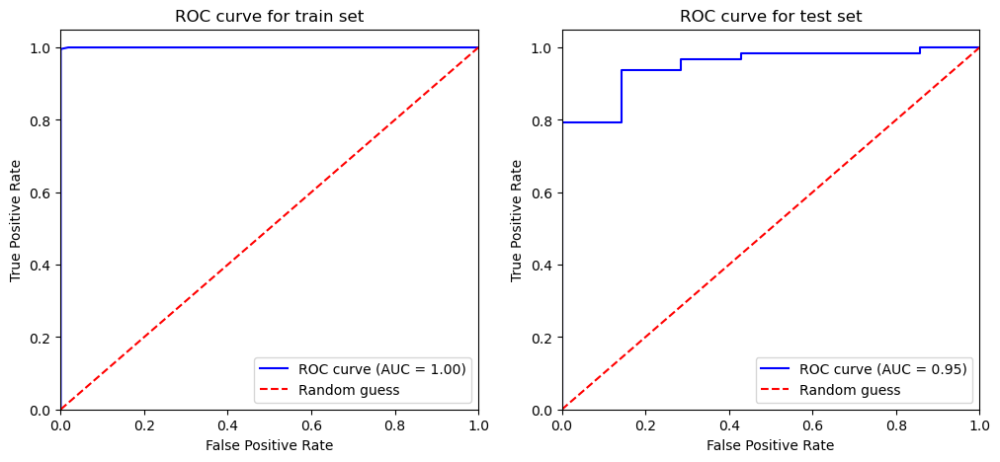

In [569]:
detailed_objective_ROC_AUC_x5(study_x5_xgb.best_trials[9])

In [572]:
def detailed_objective_ROC_AUC_x5_be(trial):
    n_estimators = trial.suggest_int('n_estimators',10,150)
    max_depth = trial.suggest_int('max_depth',5,50)
    learning_rate = trial.suggest_float('learning_rate', 0.05, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.1, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    gamma = trial.suggest_float('gamma', 0, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1e-8, 10, log=True)
    reg_lambda = trial.suggest_float('reg_lambda', 1e-8, 10, log=True)
    min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    scale_pos_weight = trial.suggest_int('scale_pos_weight', 1, 10)
    max_delta_step = trial.suggest_float('max_delta_step', 0, 10)
    random_state = 82

    model_be_x5_xgb = xgb.XGBClassifier(n_estimators=best_models_x5_be_xgb[0].params['n_estimators'],
                                     max_depth=best_models_x5_be_xgb[0].params['max_depth'],
                                     learning_rate=best_models_x5_be_xgb[0].params['learning_rate'],
                                     subsample=best_models_x5_be_xgb[0].params['subsample'],
                                     colsample_bytree=best_models_x5_be_xgb[0].params['colsample_bytree'],
                                     gamma=best_models_x5_be_xgb[0].params['gamma'],
                                     reg_alpha=best_models_x5_be_xgb[0].params['reg_alpha'],
                                     reg_lambda=best_models_x5_be_xgb[0].params['reg_lambda'],
                                     min_child_weight=best_models_x5_be_xgb[0].params['min_child_weight'],
                                     scale_pos_weight=best_models_x5_be_xgb[0].params['scale_pos_weight'],
                                     max_delta_step=best_models_x5_be_xgb[0].params['max_delta_step'],
                                     random_state=random_state)

    # Train model
    xgb_spin_optuna_x5_be = model_be_x5_xgb.fit(X5_train_spin_be_xgb,y5_train_spin)

    cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
    cv_scores_xgb_spin_optuna_x5_be = cross_val_score(xgb_spin_optuna_x5_be,X5_train_spin_be_xgb,y5_train_spin,cv=cv,scoring='f1_weighted',n_jobs=-1)
    avg_f1_cv_xgb_spin_optuna_x5_be = cv_scores_xgb_spin_optuna_x5_be.mean()

    f1_train_xgb_best_optuna_be = f1_score(y5_train_spin,model_be_x5_xgb.predict(X5_train_spin_be_xgb), average='weighted')
    f1_test_xgb_best_optuna_be = f1_score(y5_test_spin,model_be_x5_xgb.predict(X5_test_spin_be_xgb), average='weighted')
    print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_spin_optuna_x5_be,f1_test_xgb_best_optuna_be)
    
    fig,axes = plt.subplots(1,2,figsize=(12,5))
    cm_train_xgb_best_optuna_be = confusion_matrix(y5_train_spin,xgb_spin_optuna_x5_be.predict(X5_train_spin_be_xgb))
    cm_test_xgb_best_optuna_be = confusion_matrix(y5_test_spin,xgb_spin_optuna_x5_be.predict(X5_test_spin_be_xgb))
    
    disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
    disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)
    
    disp_train_xgb_best_optuna_be.plot(ax=axes[0])
    disp_test_xgb_best_optuna_be.plot(ax=axes[1])
    
    plt.show()

    ## ROC curve

    y5_pred_proba_train_xgb_x5_be = xgb_spin_optuna_x5_be.predict_proba(X5_train_spin_be_xgb)[:, 1]
    y5_pred_proba_test_xgb_x5_be = xgb_spin_optuna_x5_be.predict_proba(X5_test_spin_be_xgb)[:, 1]
    
    fpr_train_xgb_x5_be, tpr_train_xgb_x5_be, thresholds_train_xgb_x5_be = roc_curve(y5_train_spin, y5_pred_proba_train_xgb_x5_be)
    fpr_test_xgb_x5_be, tpr_test_xgb_x5_be, thresholds_test_xgb_x5_be = roc_curve(y5_test_spin, y5_pred_proba_test_xgb_x5_be)
    
    roc_auc_train_xgb_x5_be = auc(fpr_train_xgb_x5_be, tpr_train_xgb_x5_be)
    roc_auc_test_xgb_x5_be = auc(fpr_test_xgb_x5_be, tpr_test_xgb_x5_be)
    
    fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
    ax1.plot(fpr_train_xgb_x5_be, tpr_train_xgb_x5_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x5_be:.2f})')
    ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('ROC curve for train set')
    ax1.legend(loc="lower right")
    
    ax2.plot(fpr_test_xgb_x5_be, tpr_test_xgb_x5_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x5_be:.2f})')
    ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('False Positive Rate')
    ax2.set_ylabel('True Positive Rate')
    ax2.set_title('ROC curve for test set')
    ax2.legend(loc="lower right")

    plt.show()

## detailed_objective_ROC_AUC_x5_be(study_be_x5_xgb.best_trials[0])

0.9779379355603333 0.793899246581017 0.9261053906723197


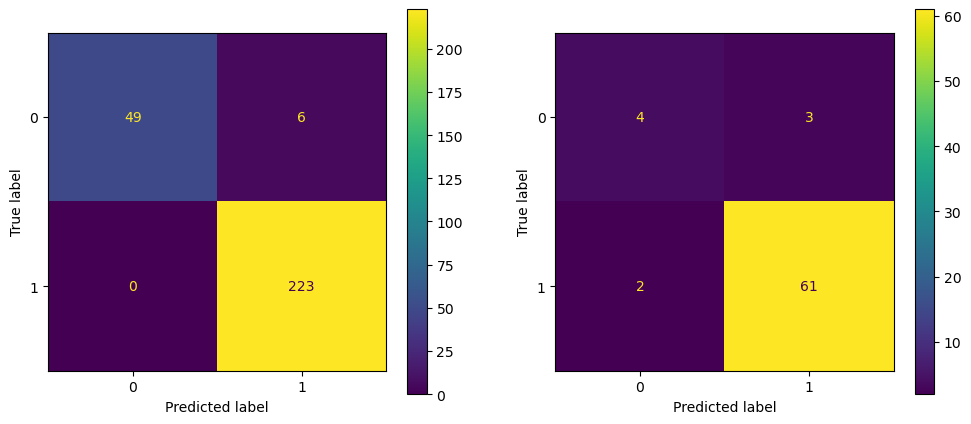

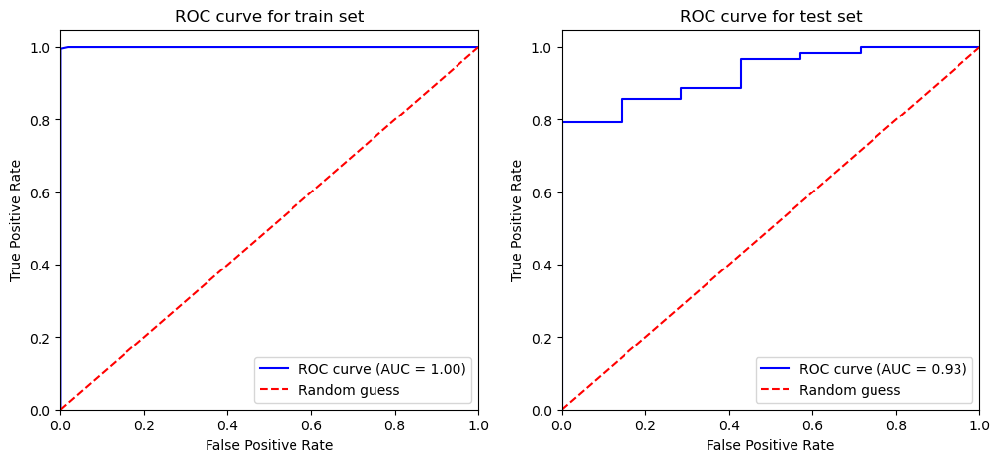

In [573]:
detailed_objective_ROC_AUC_x5_be(study_be_x5_xgb.best_trials[0])

0.989093403586146 0.8331043726868975 0.9142857142857143


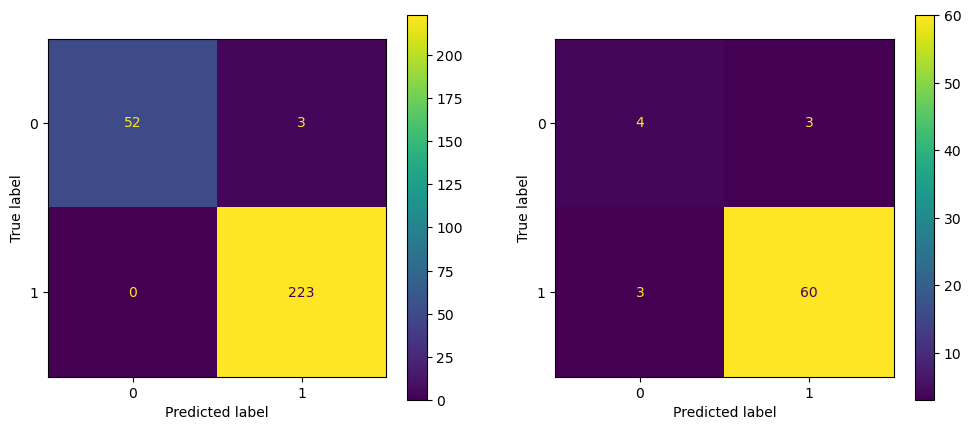

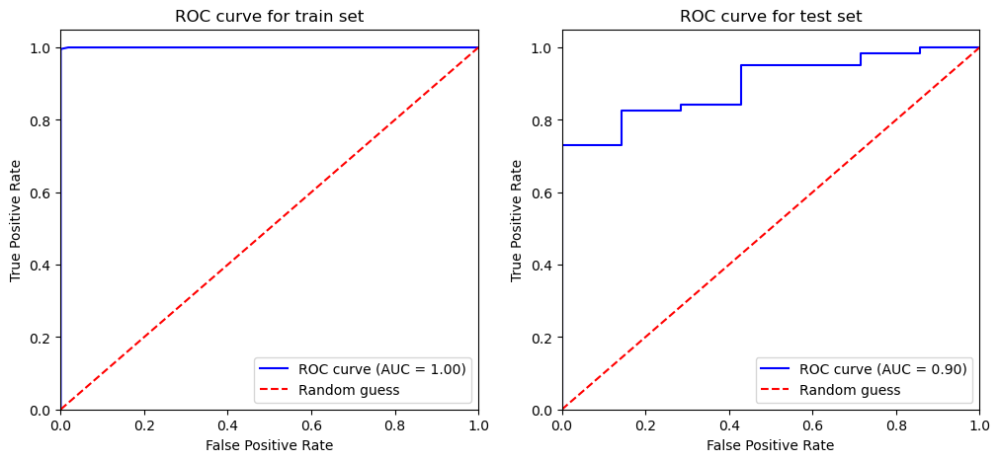

In [571]:
detailed_objective_ROC_AUC_x5_be(study_be_x5_xgb.best_trials[4])

In [574]:
## Extract X and Y values

In [575]:
## For X1

In [618]:
X1_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/X1_train_spin.xlsx',index=False)
X1_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/X1_test_spin.xlsx',index=False)
y1_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/y1_train_spin.xlsx',index=False)
y1_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/y1_test_spin.xlsx',index=False)
X1_mu.to_excel('Results_Mag_States/train_test_XGBoost/X1_features.xlsx',index=False)

In [578]:
## For X2

In [619]:
X2_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/X2_train_spin.xlsx',index=False)
X2_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/X2_test_spin.xlsx',index=False)
y2_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/y2_train_spin.xlsx',index=False)
y2_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/y2_test_spin.xlsx',index=False)
X2_mu.to_excel('Results_Mag_States/train_test_XGBoost/X2_features.xlsx',index=False)

In [580]:
## For X3

In [620]:
X3_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/X3_train_spin.xlsx',index=False)
X3_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/X3_test_spin.xlsx',index=False)
y3_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/y3_train_spin.xlsx',index=False)
y3_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/y3_test_spin.xlsx',index=False)
X3_mu.to_excel('Results_Mag_States/train_test_XGBoost/X3_features.xlsx',index=False)

In [582]:
## For X4

In [621]:
X4_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/X4_train_spin.xlsx',index=False)
X4_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/X4_test_spin.xlsx',index=False)
y4_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/y4_train_spin.xlsx',index=False)
y4_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/y4_test_spin.xlsx',index=False)
X4_mu.to_excel('Results_Mag_States/train_test_XGBoost/X4_features.xlsx',index=False)

In [584]:
## For X5

In [622]:
X5_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/X5_train_spin.xlsx',index=False)
X5_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/X5_test_spin.xlsx',index=False)
y5_train_spin.to_excel('Results_Mag_States/train_test_XGBoost/y5_train_spin.xlsx',index=False)
y5_test_spin.to_excel('Results_Mag_States/train_test_XGBoost/y5_test_spin.xlsx',index=False)
X5_mu.to_excel('Results_Mag_States/train_test_XGBoost/X5_features.xlsx',index=False)

In [1]:
## X2 7 BE is the best. Using this model to predict the 785 candidates

In [11]:
import optuna
import random
X2_train = pd.read_excel('Results_Mag_States/train_test_XGBoost/X2_train_spin.xlsx')
X2_test = pd.read_excel('Results_Mag_States/train_test_XGBoost/X2_test_spin.xlsx')
y2_train = pd.read_excel('Results_Mag_States/train_test_XGBoost/y2_train_spin.xlsx')
y2_test = pd.read_excel('Results_Mag_States/train_test_XGBoost/y2_test_spin.xlsx')

In [12]:
features_BE_X2 = ['delta_a12b58_avg_vdw_radius', 'delta_a12x18_avg_covalent_radius', 'delta_a12b14_avg_covalent_radius', 'max_diff_covalent_radius',
                  'std_atomic_volume', 'delta_a12b14_avg_dipole_polarizability', 'delta_a1a2_dipole_polarizability', 'avg_a12x914_dipole_polarizability',
                  'std_unp_electrons', 'delta_a12b58_avg_ion_energies', 'delta_a1a2_electronegativity', 'avg_electron_affinity',
                  'avg_a12x18_electron_affinity', 'avg_a1a2_metallic_radius', 'delta_a12x914_avg_metallic_radius', 'avg_mendeleev_number', 
                  'delta_b18x114_avg_mendeleev_number', 'delta_a12b58_avg_mendeleev_number', 'std_lattice_constant']

In [13]:
X2_train_be_xgb = X2_train[features_BE_X2]
X2_test_be_xgb = X2_test[features_BE_X2]
X2_mu_be_xgb = X2_mu[features_BE_X2]

0.9963904007635588 0.8204850278278204 0.9428571428571428


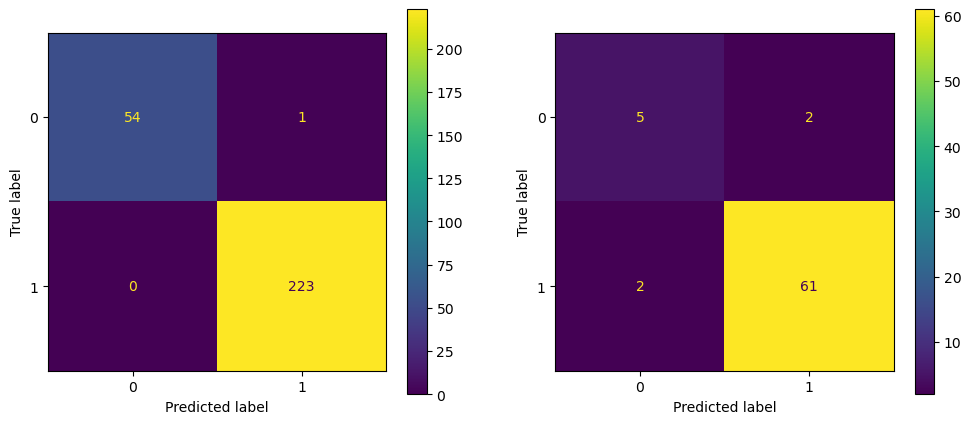

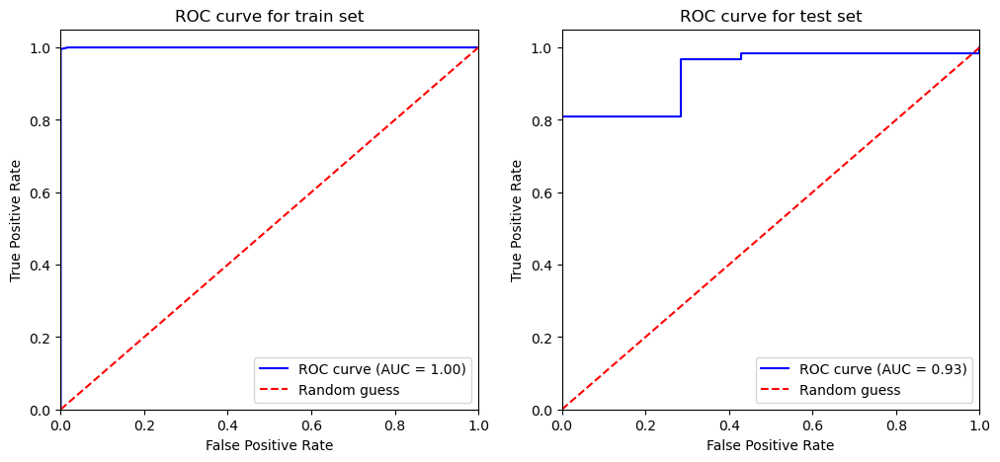

In [14]:
from sklearn.metrics import roc_curve, auc
random_state = 82
model_be_x2_xgb_best = xgb.XGBClassifier(n_estimators=79,
                                         max_depth=5,
                                         learning_rate=0.28602616140086423,
                                         subsample=0.7031075414051545,
                                         colsample_bytree=0.24761494276933105,
                                         gamma=0.18859157145677985,
                                         reg_alpha=0.0004957325749822106,
                                         reg_lambda=6.068771287683056e-08,
                                         min_child_weight=1,
                                         scale_pos_weight=1,
                                         max_delta_step=0.9118467768979377,
                                         random_state=random_state)

# Train model
xgb_optuna_x2_be_best = model_be_x2_xgb_best.fit(X2_train_be_xgb,y2_train)
cv = KFold(n_splits=5,shuffle=True,random_state=random_state)
cv_scores_xgb_optuna_x2_be = cross_val_score(xgb_optuna_x2_be_best,X2_train_be_xgb,y2_train,cv=cv,scoring='f1_weighted',n_jobs=-1)
avg_f1_cv_xgb_optuna_x2_be = cv_scores_xgb_optuna_x2_be.mean()
f1_train_xgb_best_optuna_be = f1_score(y2_train,model_be_x2_xgb_best.predict(X2_train_be_xgb), average='weighted')
f1_test_xgb_best_optuna_be = f1_score(y2_test,model_be_x2_xgb_best.predict(X2_test_be_xgb), average='weighted')
print(f1_train_xgb_best_optuna_be,avg_f1_cv_xgb_optuna_x2_be,f1_test_xgb_best_optuna_be)

fig,axes = plt.subplots(1,2,figsize=(12,5))
cm_train_xgb_best_optuna_be = confusion_matrix(y2_train,xgb_optuna_x2_be_best.predict(X2_train_be_xgb))
cm_test_xgb_best_optuna_be = confusion_matrix(y2_test,xgb_optuna_x2_be_best.predict(X2_test_be_xgb))

disp_train_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_train_xgb_best_optuna_be)
disp_test_xgb_best_optuna_be = ConfusionMatrixDisplay(cm_test_xgb_best_optuna_be)

disp_train_xgb_best_optuna_be.plot(ax=axes[0])
disp_test_xgb_best_optuna_be.plot(ax=axes[1])

plt.show()
## ROC curve
y2_pred_proba_train_xgb_x2_be = xgb_optuna_x2_be_best.predict_proba(X2_train_be_xgb)[:, 1]
y2_pred_proba_test_xgb_x2_be = xgb_optuna_x2_be_best.predict_proba(X2_test_be_xgb)[:, 1]

fpr_train_xgb_x2_be, tpr_train_xgb_x2_be, thresholds_train_xgb_x2_be = roc_curve(y2_train, y2_pred_proba_train_xgb_x2_be)
fpr_test_xgb_x2_be, tpr_test_xgb_x2_be, thresholds_test_xgb_x2_be = roc_curve(y2_test, y2_pred_proba_test_xgb_x2_be)

roc_auc_train_xgb_x2_be = auc(fpr_train_xgb_x2_be, tpr_train_xgb_x2_be)
roc_auc_test_xgb_x2_be = auc(fpr_test_xgb_x2_be, tpr_test_xgb_x2_be)

fig,(ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
ax1.plot(fpr_train_xgb_x2_be, tpr_train_xgb_x2_be, color='blue', label=f'ROC curve (AUC = {roc_auc_train_xgb_x2_be:.2f})')
ax1.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
ax1.set_xlim([0.0, 1.0])
ax1.set_ylim([0.0, 1.05])
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.set_title('ROC curve for train set')
ax1.legend(loc="lower right")

ax2.plot(fpr_test_xgb_x2_be, tpr_test_xgb_x2_be, color='blue', label=f'ROC curve (AUC = {roc_auc_test_xgb_x2_be:.2f})')
ax2.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random guess')
ax2.set_xlim([0.0, 1.0])
ax2.set_ylim([0.0, 1.05])
ax2.set_xlabel('False Positive Rate')
ax2.set_ylabel('True Positive Rate')
ax2.set_title('ROC curve for test set')
ax2.legend(loc="lower right")
plt.show()

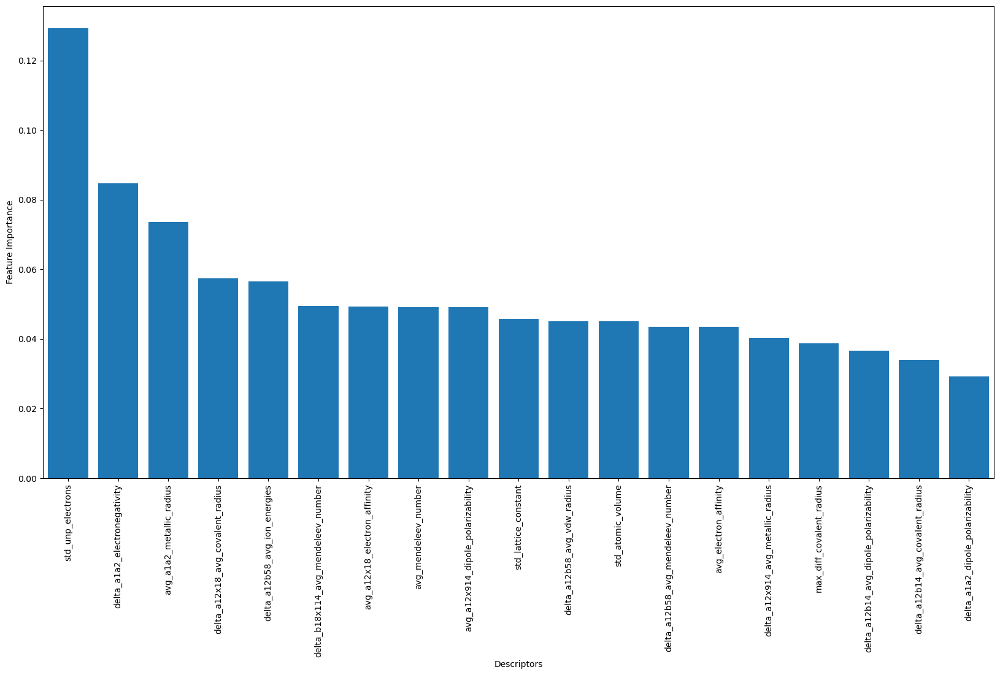

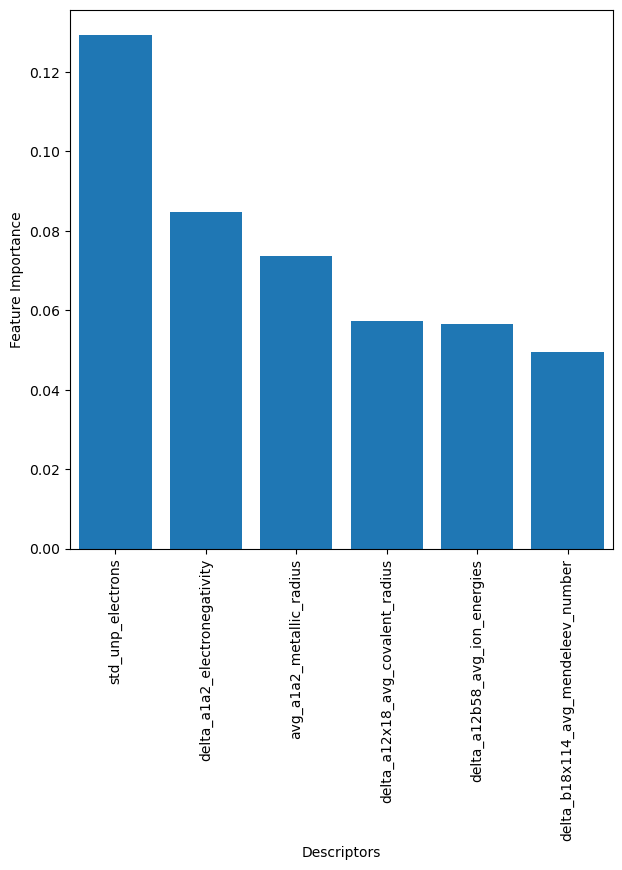

In [21]:
importances_be_x2_xgb_best = model_be_x2_xgb_best.feature_importances_
indices_be_x2_xgb_best = np.argsort(importances_be_x2_xgb_best)[::-1]  ## without [::-1] gives ascending order
plt.figure(figsize=(20,10))
plt.ylabel('Feature Importance')
plt.xlabel('Descriptors')
plt.bar(range(X2_train_be_xgb.shape[1]), importances_be_x2_xgb_best[indices_be_x2_xgb_best], align='center')
desc_labels_be_x2_xgb_best = X2_train_be_xgb.columns
plt.xticks(range(X2_train_be_xgb.shape[1]), desc_labels_be_x2_xgb_best[indices_be_x2_xgb_best],  rotation=90)
plt.xlim([-0.5, X2_train_be_xgb.shape[1]-0.5])
plt.show()

plt.figure(figsize=(7,7))
plt.ylabel('Feature Importance')
plt.xlabel('Descriptors')
plt.bar(range(6), importances_be_x2_xgb_best[indices_be_x2_xgb_best][:6], align='center')
desc_labels_be_x2_xgb_best = X2_train_be_xgb.columns
plt.xticks(range(6), desc_labels_be_x2_xgb_best[indices_be_x2_xgb_best][:6],  rotation=90)
plt.xlim([-0.5, 5.5])
plt.show()

In [38]:
y_spin = [1 if x == 'FM' else 0 for x in y_spin]

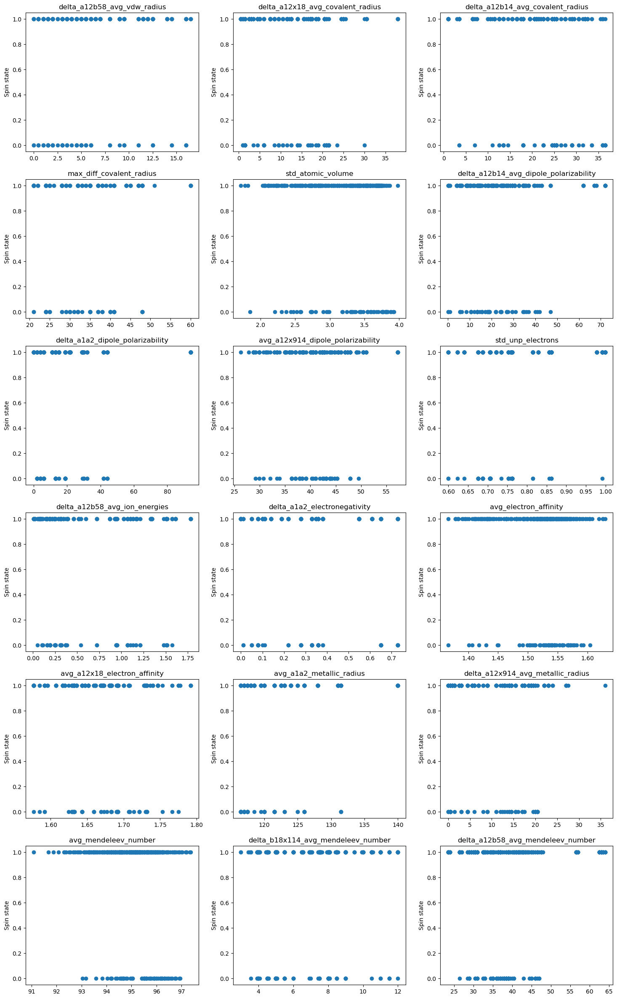

In [55]:
fig, ax = plt.subplots(nrows = 6, ncols = 3, figsize = (18, 30))

nrows = 6
ncols = 3
count = 0
for i in range(nrows):
    for j in range(ncols):
        
        ax[i,j].scatter(X2_mu[X2_train_be_xgb.columns[count]],y_spin)
        ax[i,j].set_xlabel(''), ax[i,j].set_ylabel('Spin state'), ax[i,j].set_title(X2_train_be_xgb.columns[count])
        
        count = count+1

plt.show()

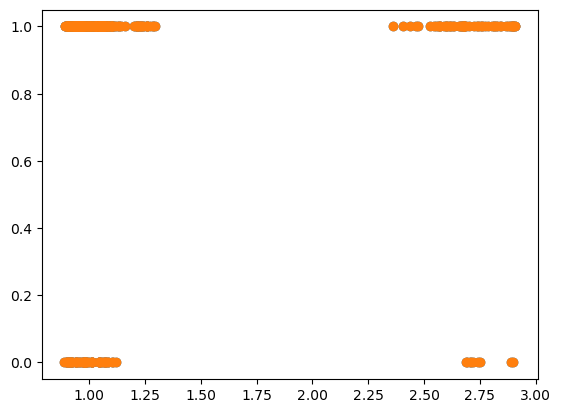

In [59]:
plt.scatter(X2_mu[X2_train_be_xgb.columns[18]],y_spin)
plt.show()

In [22]:
candidates_785 = pd.read_excel('Results_Mag_States/descriptors_for_891_candidates.xlsx','without_Si')

In [23]:
X_785 = candidates_785[features_BE_X2]

In [34]:
pred_y_785 = model_be_x2_xgb_best.predict(X_785)

In [36]:
pred_y_785 = ['AFM' if x == 0 else 'FM' for x in pred_y_785]

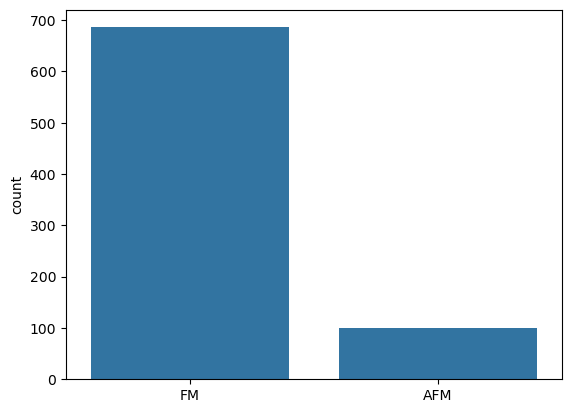

In [38]:
sns.countplot(x = pred_y_785)
plt.show()

In [40]:
pd.DataFrame(pred_y_785).to_csv('Results_Mag_States/X2_7_XGB_BE_Spin_pred_785.csv',index=False)